# Financial Crisis Early Warning System

## Project Motivation

Financial markets, in the medium to long term, tend to generate positive risk premia and positive real returns. However, they periodically experience **crises** when asset returns deviate significantly from these principles.

In market terminology:
- **Risk-on** situations: Investors are willing to take risks, bidding up prices of risky assets
- **Risk-off** situations: Investors become risk-averse, selling risky assets and moving to safer investments

Financial institutions want to detect these regime changes as early as possible to protect portfolios, outperform the market, and maintain reputation.

## Our Approach

We're using Data Science to develop an Early Warning System based on anomaly detection:
- **Risk-on periods** → Normal market conditions
- **Risk-off periods** → Anomalous market conditions

This project will use machine learning to identify financial anomalies in real-time, providing early warnings of potential market crises.

# Section 1: Introduction & Dataset Overview

In [1]:
# Financial Crisis Early Warning System
# An Anomaly Detection Approach for Financial Markets

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
%matplotlib inline

# Set styling for plots
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("cool")
plt.rcParams['figure.figsize'] = (12, 7)
plt.rcParams['font.size'] = 12

In [2]:
# Load the dataset
df = pd.read_excel('Dataset4_EWS.xlsx')

# Display basic information
print(f"Dataset Shape: {df.shape}")
print(f"Time Range: {df['Data'].min()} to {df['Data'].max()}")
print(f"Total Observations: {len(df)}")
print(f"Normal Periods (Y=0): {len(df[df['Y'] == 0])}")
print(f"Crisis Periods (Y=1): {len(df[df['Y'] == 1])}")
print(f"Crisis Percentage: {len(df[df['Y'] == 1]) / len(df) * 100:.2f}%")

# Display first few rows
print("\nFirst few rows of the dataset:")
df.head()

Dataset Shape: (1111, 44)
Time Range: 2000-01-11 00:00:00 to 2021-04-20 00:00:00
Total Observations: 1111
Normal Periods (Y=0): 874
Crisis Periods (Y=1): 237
Crisis Percentage: 21.33%

First few rows of the dataset:


,Data,BDIY,CRY,Cl1,DXY,ECSURPUS,EMUSTRUU,EONIA,GBP,GT10,...,MXJP,MXRU,MXUS,US0001M,USGG2YR,USGG30YR,USGG3M,VIX,XAUBGNL,Y
0,2000-01-11,1388,157.26,25.77,100.56,0.077,230.5267,2.89,1.6460,6.657,...,990.59,224.33,1416.12,5.78125,6.428,6.671,5.426,22.50,283.25,0
1,2000-01-18,1405,165.01,28.85,101.86,0.043,231.3770,3.03,1.6383,6.748,...,993.98,234.37,1428.79,5.80250,6.465,6.747,5.378,21.50,287.65,0
2,2000-01-25,1368,167.24,28.28,102.41,0.135,232.3895,3.15,1.6496,6.692,...,974.83,216.82,1385.93,5.81875,6.432,6.634,5.562,23.02,287.15,0
3,2000-02-01,1311,166.85,28.22,104.92,0.191,231.9417,3.30,1.6106,6.619,...,1007.12,201.89,1385.31,5.88500,6.574,6.423,5.708,23.45,282.75,0
4,2000-02-08,1277,165.43,28.02,104.22,0.312,237.8117,3.26,1.6108,6.613,...,1034.58,218.00,1411.95,5.89125,6.678,6.231,5.677,21.25,298.40,1


In [3]:
# Load crisis periods from our earlier analysis (if available, or create it now)
# If you've already run the crisis_detector.py script, you can load the CSV
try:
    crisis_df = pd.read_csv('crisis_periods.csv')
    has_crisis_file = True
except:
    # If the file doesn't exist, we'll create a simplified version
    has_crisis_file = False
    
    # Find crisis periods
    crisis_periods = []
    current_start = None
    
    for i in range(len(df)):
        # Start of a crisis period
        if df['Y'].iloc[i] == 1 and (i == 0 or df['Y'].iloc[i-1] == 0):
            current_start = df['Data'].iloc[i]
        
        # End of a crisis period
        elif df['Y'].iloc[i] == 0 and i > 0 and df['Y'].iloc[i-1] == 1 and current_start is not None:
            crisis_periods.append((current_start, df['Data'].iloc[i-1]))
            current_start = None
    
    # Handle the case where the last period in the dataset is a crisis
    if current_start is not None:
        crisis_periods.append((current_start, df['Data'].iloc[-1]))
    
    # Create crisis dataframe
    crisis_df = pd.DataFrame({
        'CrisisNumber': range(1, len(crisis_periods) + 1),
        'StartDate': [start for start, _ in crisis_periods],
        'EndDate': [end for _, end in crisis_periods],
        'Duration': [(end - start).days for start, end in crisis_periods]
    })

# Display crisis periods
print(f"\nTotal number of crisis periods: {len(crisis_df)}")
crisis_df.head(10)


Total number of crisis periods: 41


,CrisisNumber,StartDate,EndDate,Duration
0,1,2000-02-08,2000-02-29,21
1,2,2000-04-25,2000-05-16,21
2,3,2000-09-12,2000-10-10,28
3,4,2000-11-14,2000-11-21,7
4,5,2000-12-05,2001-01-02,28
5,6,2001-02-06,2001-04-03,56
6,7,2001-06-05,2001-06-12,7
7,8,2001-06-26,2001-07-03,7
8,9,2001-08-21,2001-10-09,49
9,10,2001-10-23,2001-10-30,7


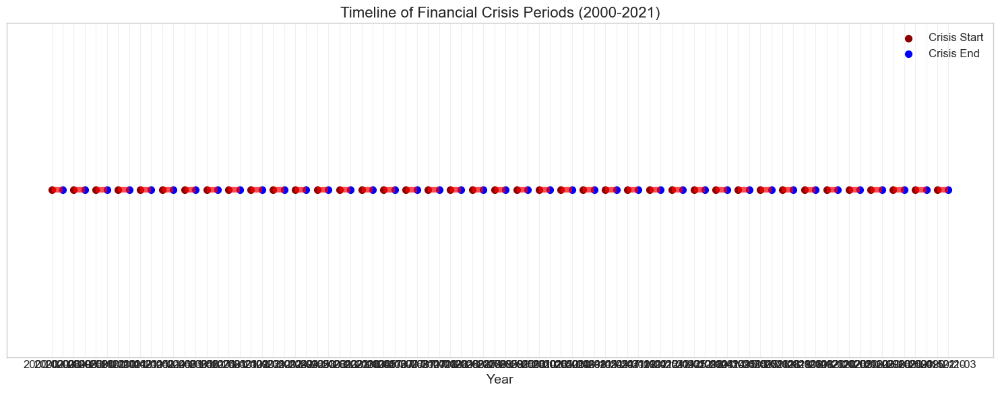

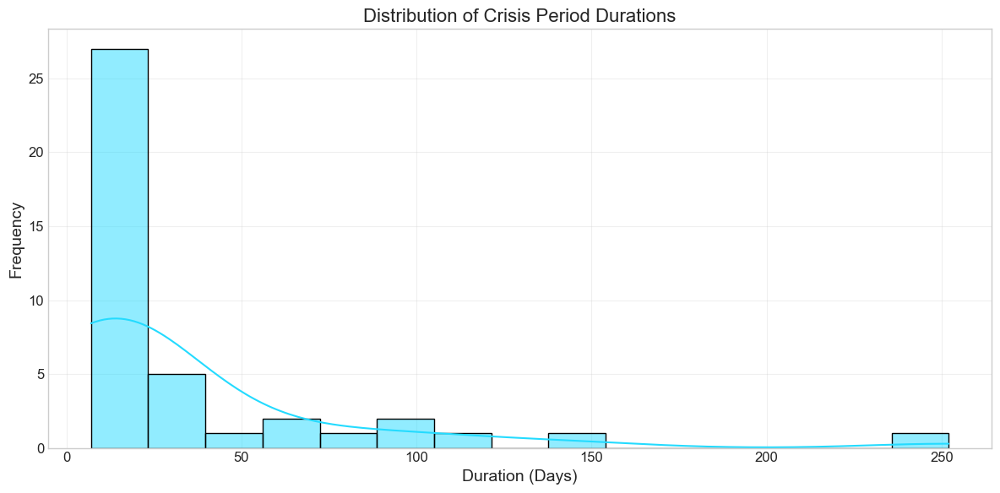

In [4]:
# Visualize crisis periods over time
plt.figure(figsize=(15, 6))

# Create a timeline of crisis periods
for idx, row in crisis_df.iterrows():
    plt.hlines(y=1, xmin=row['StartDate'], xmax=row['EndDate'], colors='red', linewidth=6, alpha=0.7)

# Add markers for crisis start and end
plt.scatter(crisis_df['StartDate'], [1] * len(crisis_df), color='darkred', s=50, label='Crisis Start')
plt.scatter(crisis_df['EndDate'], [1] * len(crisis_df), color='blue', s=50, label='Crisis End')

# Format the plot
plt.yticks([])
plt.title('Timeline of Financial Crisis Periods (2000-2021)', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

# Plot distribution of crisis durations
plt.figure(figsize=(12, 6))
sns.histplot(crisis_df['Duration'], bins=15, kde=True)
plt.title('Distribution of Crisis Period Durations', fontsize=16)
plt.xlabel('Duration (Days)', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

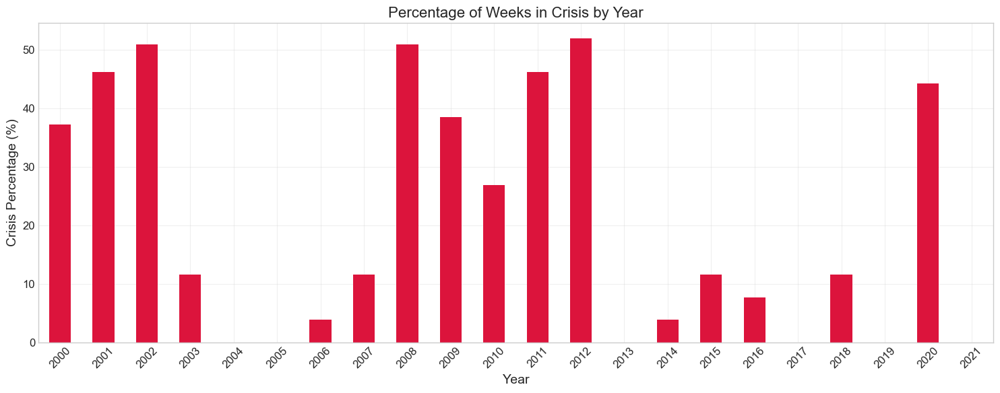

In [5]:
# Analyze crisis frequency by year
df['Year'] = df['Data'].dt.year
crisis_by_year = df.groupby('Year')['Y'].mean() * 100  # Percentage of weeks in crisis per year

plt.figure(figsize=(15, 6))
crisis_by_year.plot(kind='bar', color='crimson')
plt.title('Percentage of Weeks in Crisis by Year', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Crisis Percentage (%)', fontsize=14)
plt.grid(True, alpha=0.3)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

## Dataset Features Overview

Our dataset contains 43 financial indicators across several categories:

1. **Market Indices**: VIX, MSCI country indices
2. **Commodities**: Gold, Oil, Commodity indices
3. **Currencies**: Dollar index, JPY, GBP
4. **Bond Yields**: US, German, Italian, UK, Japanese government bonds
5. **Interest Rates**: LIBOR, EONIA
6. **Bond Indices**: Corporate, High Yield, MBS, Emerging Markets
7. **Economic Indicators**: Baltic Dry Index, Economic surprise indices

The target variable **Y** indicates risk-off periods (1) versus normal periods (0).

## Next Steps

In the following sections, we'll:
1. Perform detailed exploratory analysis of these indicators
2. Apply advanced time series analysis techniques
3. Engineer features that capture early warning signals
4. Develop and evaluate anomaly detection models

# Section 2: Data Exploration

# Data Exploration

In this section, we'll explore the financial indicators in our dataset to understand:
- The statistical properties of each feature
- How indicators behave during normal versus crisis periods
- Correlations between different financial variables
- Changes in distributions before and during crises
- Patterns that emerge as markets transition from normal to crisis states

In [6]:
# Basic statistics for our features
print("Basic statistics for the dataset:")
print(f"Shape: {df.shape}")
print(f"Time Range: {df['Data'].min()} to {df['Data'].max()}")
print(f"Missing Values: {df.isnull().sum().sum()}")

# Create a function to categorize columns by type
def categorize_columns(df):
    # Exclude Data, Y and Year columns
    columns = [col for col in df.columns if col not in ['Data', 'Y', 'Year']]
    
    # Define categories
    categories = {
        'Market Indices': ['VIX', 'MXUS', 'MXEU', 'MXJP', 'MXBR', 'MXRU', 'MXIN', 'MXCN'],
        'Commodities': ['XAUBGNL', 'Cl1', 'CRY'],
        'Currency': ['DXY', 'JPY', 'GBP'],
        'Bond Yields': ['USGG30YR', 'GT10', 'USGG2YR', 'USGG3M', 'GTDEM30Y', 'GTDEM10Y', 'GTDEM2Y', 
                        'GTITL30YR', 'GTITL10YR', 'GTITL2YR', 'GTJPY30YR', 'GTJPY10YR', 'GTJPY2YR',
                        'GTGBP30Y', 'GTGBP20Y', 'GTGBP2Y'],
        'Interest Rates': ['US0001M', 'EONIA'],
        'Bond Indices': ['LUMSTRUU', 'LMBITR', 'LUACTRUU', 'LF98TRUU', 'LG30TRUU', 'LP01TREU', 
                         'EMUSTRUU', 'LF94TRUU'],
        'Economic Indicators': ['BDIY', 'ECSURPUS']
    }
    
    # Create a dictionary to store the category for each column
    column_categories = {}
    for category, cols in categories.items():
        for col in cols:
            if col in columns:
                column_categories[col] = category
    
    # Check if any columns are missing from categories
    for col in columns:
        if col not in column_categories:
            column_categories[col] = 'Other'
    
    return column_categories

column_categories = categorize_columns(df)

# Group statistics by category
for category in sorted(set(column_categories.values())):
    category_cols = [col for col, cat in column_categories.items() if cat == category]
    if category_cols:
        print(f"\n\n{category} - Summary Statistics:")
        print(df[category_cols].describe().T[['mean', 'std', 'min', 'max']])

Basic statistics for the dataset:
Shape: (1111, 45)
Time Range: 2000-01-11 00:00:00 to 2021-04-20 00:00:00
Missing Values: 0


Bond Indices - Summary Statistics:
                 mean         std       min        max
LUMSTRUU  1637.293510  417.229338  869.3300  2325.8600
LMBITR     883.615439  241.507125  472.7233  1350.5000
LUACTRUU  2077.306949  690.731794  986.9400  3550.4300
LF98TRUU  1231.258119  553.121000  491.0800  2378.5300
LG30TRUU   804.720625  370.251996  294.3674  1525.7900
LP01TREU   232.109928  109.917622   80.7968   431.5528
EMUSTRUU   704.379495  309.951768  230.5267  1286.3530
LF94TRUU   259.052663   75.934443  121.3310   398.7065


Bond Yields - Summary Statistics:
               mean       std     min     max
USGG30YR   3.908324  1.178592  1.1626  6.7470
GT10       3.266748  1.332464  0.5080  6.7480
USGG2YR    1.990358  1.710307  0.1073  6.8720
USGG3M     1.575151  1.802895 -0.0381  6.4140
GTDEM30Y   3.039282  1.779526 -0.4710  6.2540
GTDEM10Y   2.448365  1.851558 -

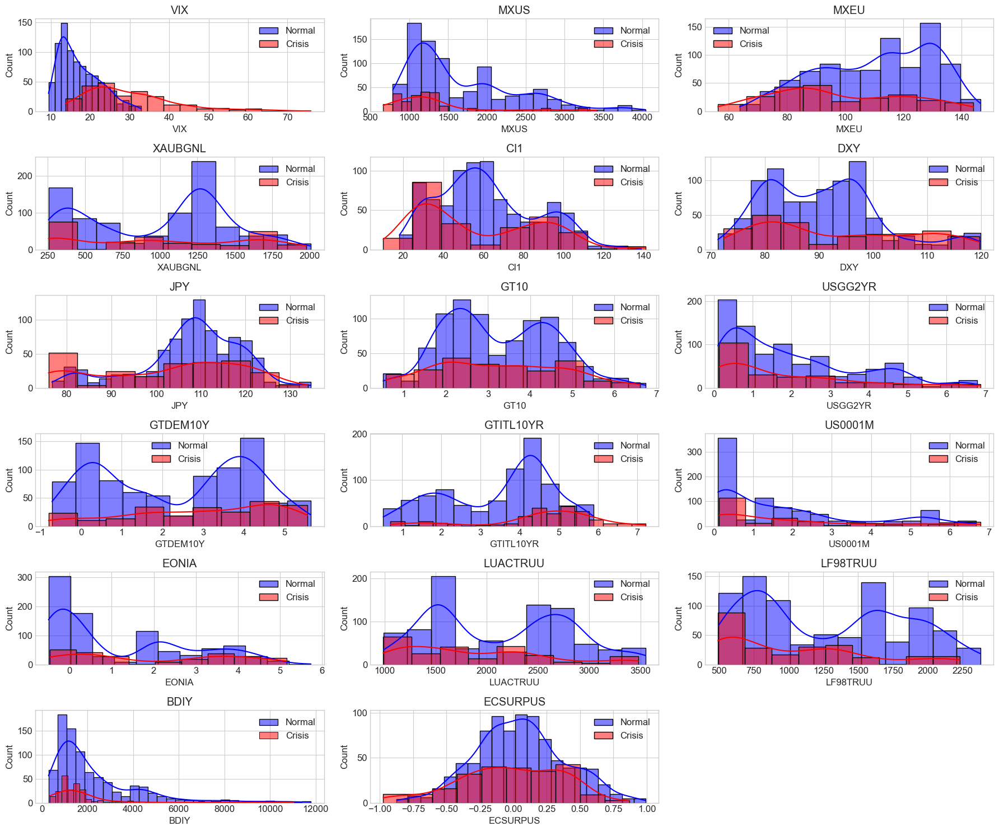

In [7]:
# Function to create comparison plots of indicators during normal vs crisis periods
def plot_normal_vs_crisis(df, columns, n_cols=3, figsize=(18, 15)):
    n_rows = (len(columns) + n_cols - 1) // n_cols
    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
    axes = axes.flatten()
    
    for i, col in enumerate(columns):
        if i < len(axes):
            # Normal periods
            normal_data = df[df['Y'] == 0][col]
            # Crisis periods
            crisis_data = df[df['Y'] == 1][col]
            
            # Plot histograms
            sns.histplot(normal_data, color='blue', alpha=0.5, label='Normal', ax=axes[i], kde=True)
            sns.histplot(crisis_data, color='red', alpha=0.5, label='Crisis', ax=axes[i], kde=True)
            
            axes[i].set_title(f'{col}')
            axes[i].legend()
            
    # Hide any unused subplots
    for i in range(len(columns), len(axes)):
        axes[i].axis('off')
    
    plt.tight_layout()
    plt.show()

# Select representative columns from each category to compare
sample_cols = [
    'VIX', 'MXUS', 'MXEU',              # Market Indices
    'XAUBGNL', 'Cl1',                   # Commodities
    'DXY', 'JPY',                       # Currency
    'GT10', 'USGG2YR',                  # Bond Yields (US)
    'GTDEM10Y', 'GTITL10YR',            # Bond Yields (EU)
    'US0001M', 'EONIA',                 # Interest Rates
    'LUACTRUU', 'LF98TRUU',             # Bond Indices
    'BDIY', 'ECSURPUS'                  # Economic Indicators
]

# Plot normal vs crisis distributions
plot_normal_vs_crisis(df, sample_cols)

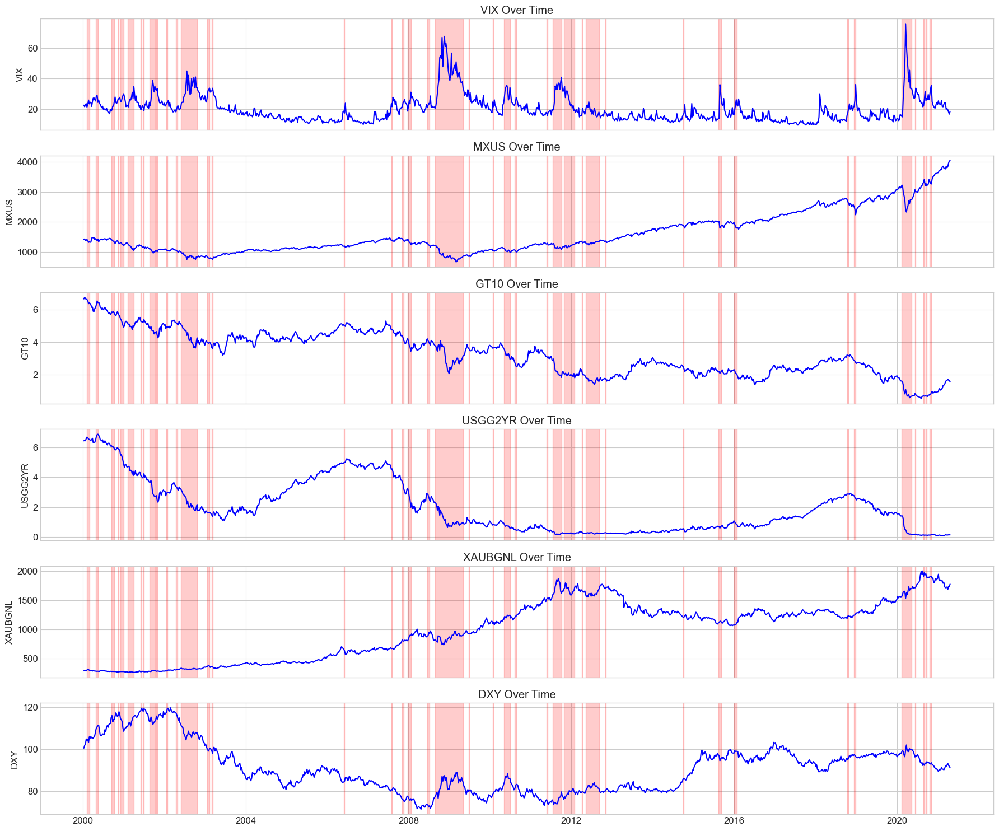

In [8]:
# Create time series plots for key indicators with crisis periods highlighted
def plot_timeseries_with_crises(df, columns, n_cols=1, figsize=(18, 15)):
    n_rows = len(columns)
    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize, sharex=True)
    
    if n_rows == 1:
        axes = [axes]
    
    for i, col in enumerate(columns):
        # Plot the time series
        axes[i].plot(df['Data'], df[col], label=col, color='blue')
        axes[i].set_title(f'{col} Over Time')
        axes[i].set_ylabel(col)
        
        # Highlight crisis periods
        crisis_periods = df[df['Y'] == 1]['Data'].reset_index(drop=True)
        for j in range(len(crisis_periods)):
            if j == 0 or (crisis_periods[j] - crisis_periods[j-1]).days > 7:  # Start of a crisis
                crisis_start = crisis_periods[j]
                crisis_end = crisis_periods[j]
                # Find the end of this crisis
                while j + 1 < len(crisis_periods) and (crisis_periods[j+1] - crisis_periods[j]).days <= 7:
                    j += 1
                    crisis_end = crisis_periods[j]
                
                # Highlight the crisis period
                axes[i].axvspan(crisis_start, crisis_end, alpha=0.2, color='red')
    
    plt.tight_layout()
    plt.show()

# Select a few important indicators to visualize over time
key_indicators = ['VIX', 'MXUS', 'GT10', 'USGG2YR', 'XAUBGNL', 'DXY']
plot_timeseries_with_crises(df, key_indicators)

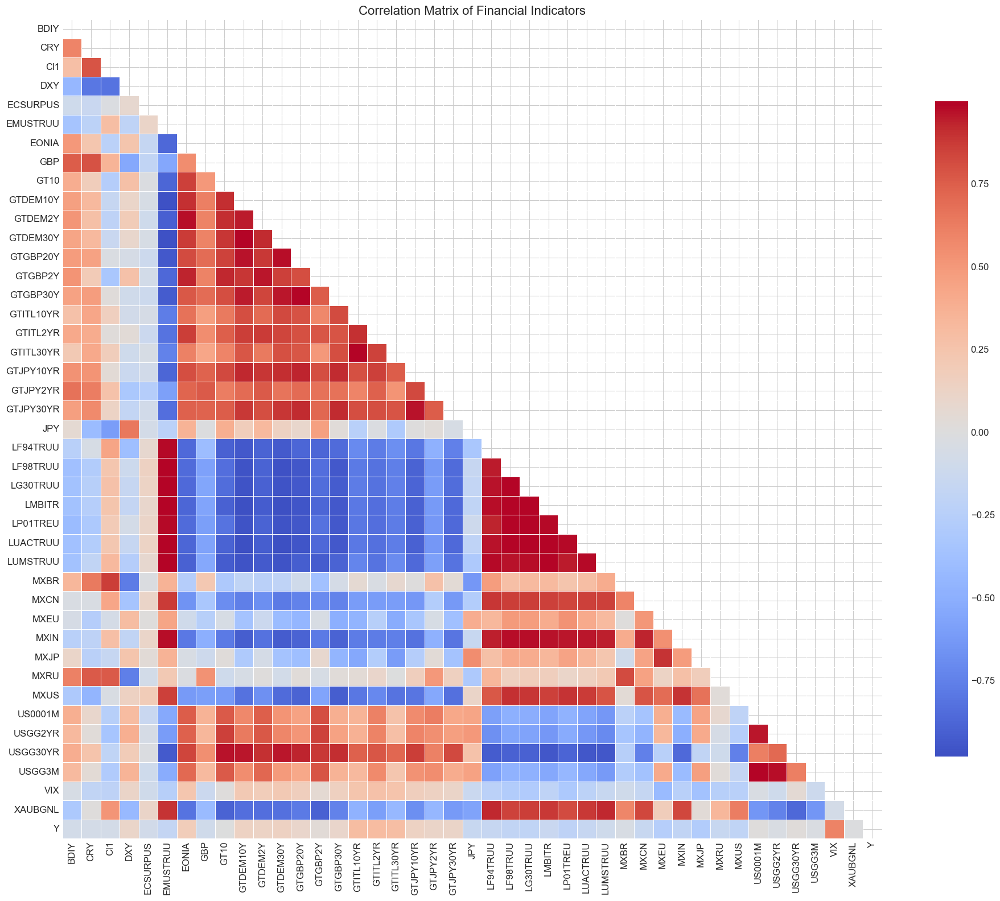

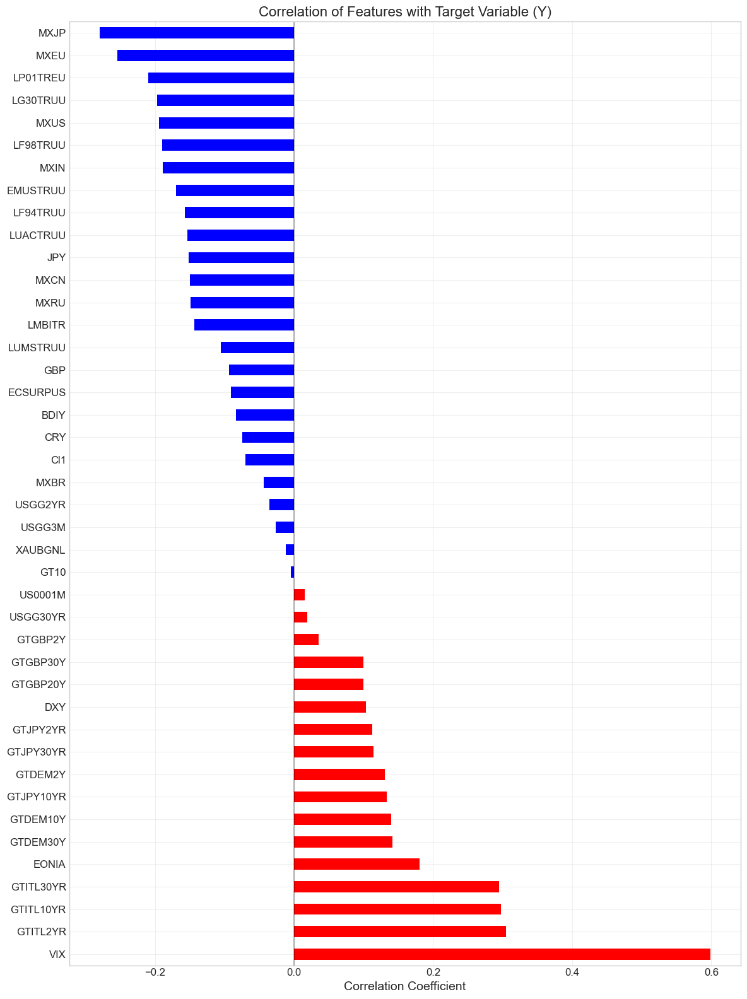

In [9]:
# Calculate correlation matrix
correlation_matrix = df.drop(['Data', 'Year'], axis=1).corr()

# Plot the correlation heatmap
plt.figure(figsize=(20, 16))
mask = np.triu(correlation_matrix)
sns.heatmap(correlation_matrix, mask=mask, cmap='coolwarm', center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .8})
plt.title('Correlation Matrix of Financial Indicators', fontsize=16)
plt.tight_layout()
plt.show()

# Focus on correlations with the target variable
correlations_with_target = correlation_matrix['Y'].sort_values(ascending=False)
plt.figure(figsize=(12, 16))
correlations_with_target.drop('Y').plot(kind='barh', color=correlations_with_target.drop('Y').map(lambda x: 'red' if x > 0 else 'blue'))
plt.title('Correlation of Features with Target Variable (Y)', fontsize=16)
plt.xlabel('Correlation Coefficient', fontsize=14)
plt.axvline(x=0, color='black', linestyle='-', alpha=0.3)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

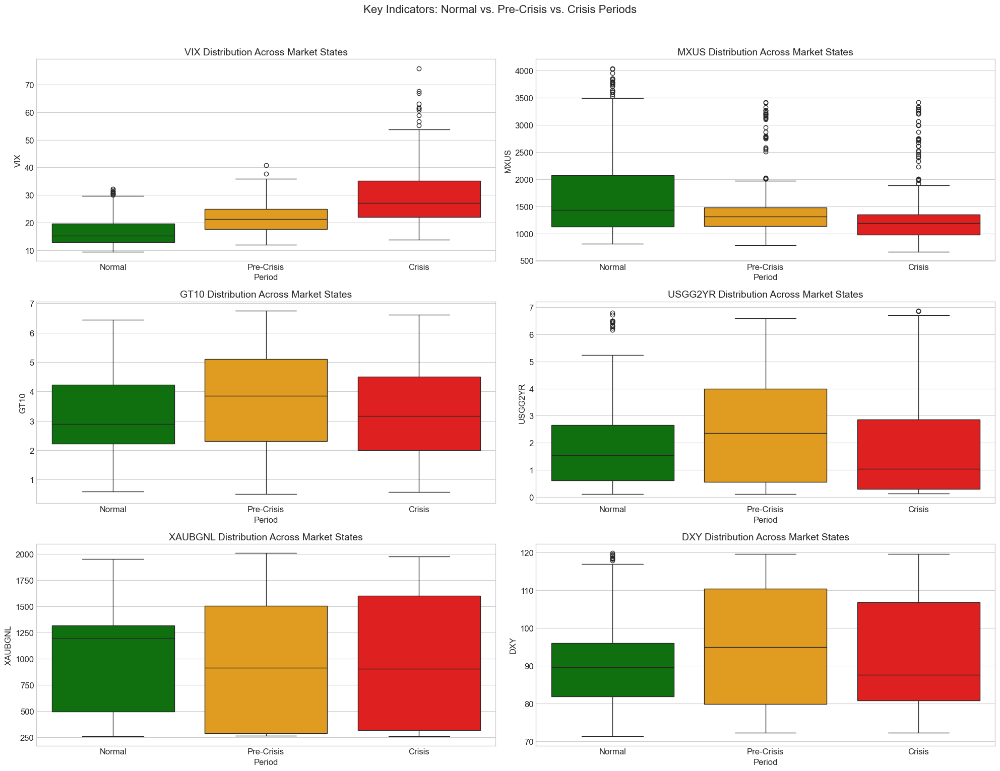

In [10]:
# Analyze feature behavior before crisis onset
# We'll look at changes in indicators leading up to crisis periods

# Function to get data before crisis starts
def get_pre_crisis_periods(df, window=4):
    """
    Extract data from window weeks before each crisis starts
    window: number of weeks before crisis to include
    """
    pre_crisis_indices = []
    
    # Find the starting points of crises
    crisis_starts = []
    for i in range(1, len(df)):
        if df['Y'].iloc[i] == 1 and df['Y'].iloc[i-1] == 0:
            crisis_starts.append(i)
    
    # Get the pre-crisis windows
    for start_idx in crisis_starts:
        for w in range(1, window+1):
            if start_idx - w >= 0:
                pre_crisis_indices.append(start_idx - w)
    
    return df.iloc[pre_crisis_indices].copy()

# Get data from 4 weeks before crisis starts
pre_crisis_df = get_pre_crisis_periods(df, window=4)
pre_crisis_df['Period'] = 'Pre-Crisis'

# Get normal periods (excluding pre-crisis)
normal_indices = set(df[df['Y'] == 0].index) - set(pre_crisis_df.index)
normal_df = df.iloc[list(normal_indices)].copy()
normal_df['Period'] = 'Normal'

# Get crisis periods
crisis_df = df[df['Y'] == 1].copy()
crisis_df['Period'] = 'Crisis'

# Combine for comparison
comparison_df = pd.concat([normal_df, pre_crisis_df, crisis_df])

# Plot boxplots for key indicators comparing the three periods
key_indicators = ['VIX', 'MXUS', 'GT10', 'USGG2YR', 'XAUBGNL', 'DXY']

plt.figure(figsize=(20, 15))
for i, indicator in enumerate(key_indicators):
    plt.subplot(3, 2, i+1)
    sns.boxplot(x='Period', y=indicator, data=comparison_df, 
                order=['Normal', 'Pre-Crisis', 'Crisis'],
                palette=['green', 'orange', 'red'])
    plt.title(f'{indicator} Distribution Across Market States', fontsize=14)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.tight_layout()

plt.suptitle('Key Indicators: Normal vs. Pre-Crisis vs. Crisis Periods', fontsize=16, y=1.02)
plt.tight_layout()
plt.show()

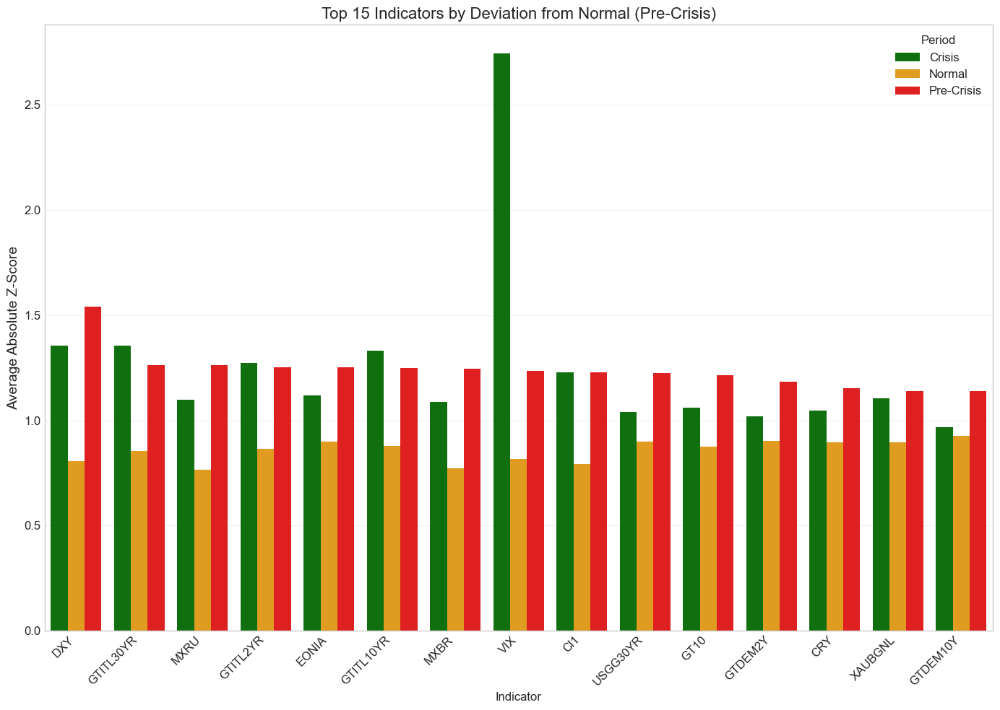

In [11]:
# Calculate Z-scores for each indicator to see standardized shifts
# This helps identify which indicators move the most as markets transition to crisis

# Function to calculate Z-scores based on normal periods
def calculate_zscores(comparison_df, normal_df, indicators):
    # Create a copy of the data
    zscore_df = comparison_df.copy()
    
    # Calculate z-scores based on normal period means and stds
    for col in indicators:
        mean = normal_df[col].mean()
        std = normal_df[col].std()
        zscore_df[f'{col}_zscore'] = (zscore_df[col] - mean) / std
        
    return zscore_df

# Get Z-scores for all indicators
feature_cols = [col for col in df.columns if col not in ['Data', 'Y', 'Year', 'Period']]
zscore_df = calculate_zscores(comparison_df, normal_df, feature_cols)

# Calculate average absolute Z-score by period for each indicator
zscore_cols = [col for col in zscore_df.columns if col.endswith('_zscore')]
avg_zscores = zscore_df.groupby('Period')[zscore_cols].agg(lambda x: x.abs().mean())

# Transform for easier plotting
avg_zscores_melted = avg_zscores.reset_index().melt(id_vars='Period', 
                                                    value_vars=zscore_cols,
                                                    var_name='Indicator', 
                                                    value_name='Avg_Abs_ZScore')
avg_zscores_melted['Indicator'] = avg_zscores_melted['Indicator'].str.replace('_zscore', '')

# Get top 15 indicators with highest Z-scores during Pre-Crisis
top_precrisis_indicators = avg_zscores_melted[avg_zscores_melted['Period'] == 'Pre-Crisis'] \
                          .sort_values('Avg_Abs_ZScore', ascending=False)['Indicator'].head(15).tolist()

# Plot top indicators by average absolute Z-score during pre-crisis periods
plt.figure(figsize=(14, 10))
top_precrisis_data = avg_zscores_melted[avg_zscores_melted['Indicator'].isin(top_precrisis_indicators)]
sns.barplot(x='Indicator', y='Avg_Abs_ZScore', hue='Period', data=top_precrisis_data,
            order=top_precrisis_indicators, palette=['green', 'orange', 'red'])
plt.title('Top 15 Indicators by Deviation from Normal (Pre-Crisis)', fontsize=16)
plt.xticks(rotation=45, ha='right')
plt.ylabel('Average Absolute Z-Score', fontsize=14)
plt.legend(title='Period')
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

## Key Insights from Data Exploration

Our exploratory data analysis reveals several important patterns:

1. **Volatility Indicators**: The VIX and other volatility measures show significant increases during crisis periods, often beginning to rise in pre-crisis periods.

2. **Equity Markets**: Stock indices tend to decline during crises, with certain markets (emerging markets in particular) showing larger drawdowns.

3. **Fixed Income**: Bond yields display varying behavior based on their role as safe haven assets versus risk assets. US Treasuries often see yield declines during crises as investors seek safety.

4. **Correlations**: The correlation structure between assets changes substantially during crises, with increased correlations across equity markets (contagion effect).

5. **Early Warning Indicators**: Several indicators show significant deviations from normal levels in the pre-crisis periods, potentially offering early warning signals.

6. **Crisis Characteristics**: Financial crises show diverse patterns in terms of duration, severity, and the specific indicators that lead the downturn.

These insights will guide our feature engineering process as we develop more sophisticated indicators for our early warning system.

# Section 3: Temporal Decomposition & Spectral Analysis

# Temporal Decomposition & Spectral Analysis

In this section, we'll apply advanced time series analysis techniques to understand the underlying structures in our financial data:

1. **Temporal Decomposition**: Separating time series into trend, seasonality, and residual components
2. **Wavelet Analysis**: Identifying time-varying frequency patterns across different scales
3. **Spectral Analysis**: Examining frequency domain characteristics
4. **Rolling Window Statistics**: Analyzing statistical properties over time

These techniques can help identify subtle patterns and early warning signals that may not be visible through standard analysis.

In [12]:
# Import necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.seasonal import STL
import pywt
from scipy import signal
from scipy.stats import entropy

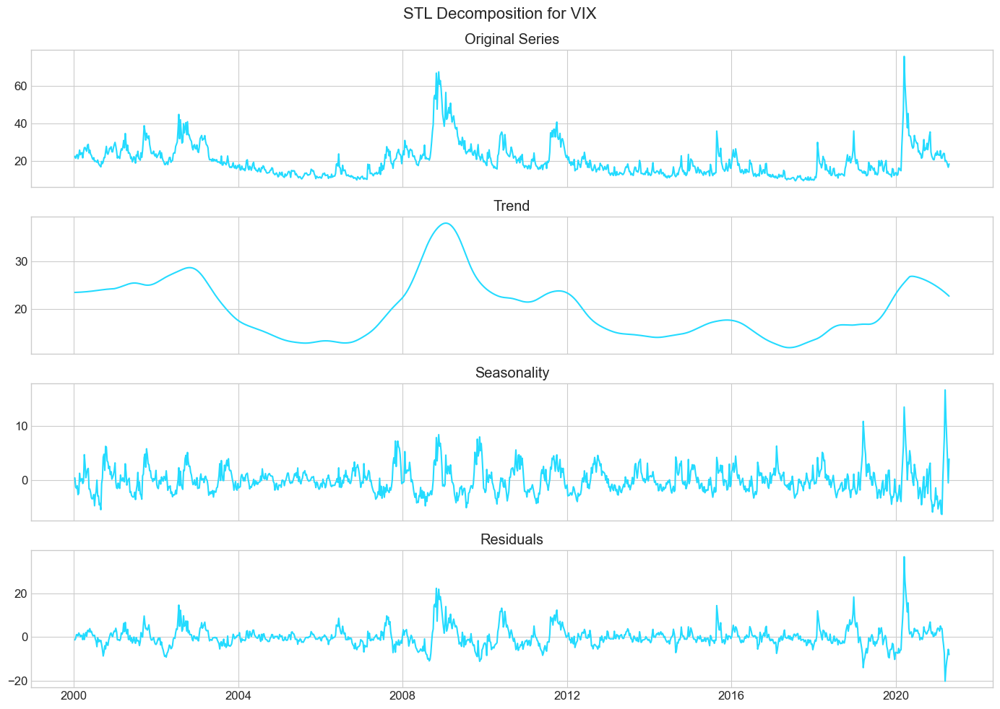

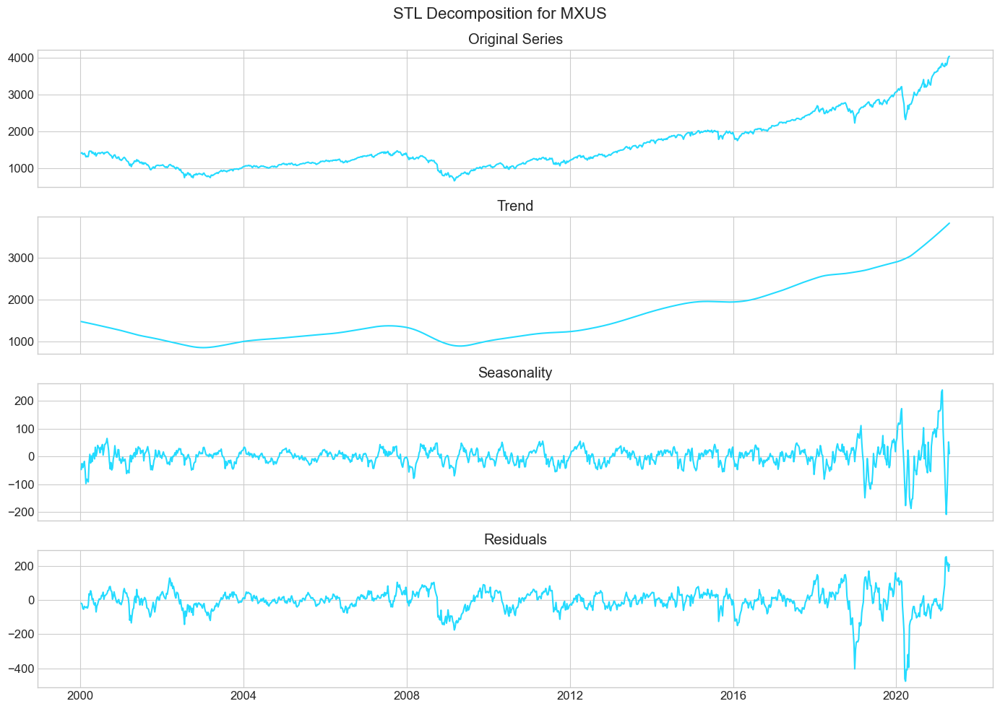

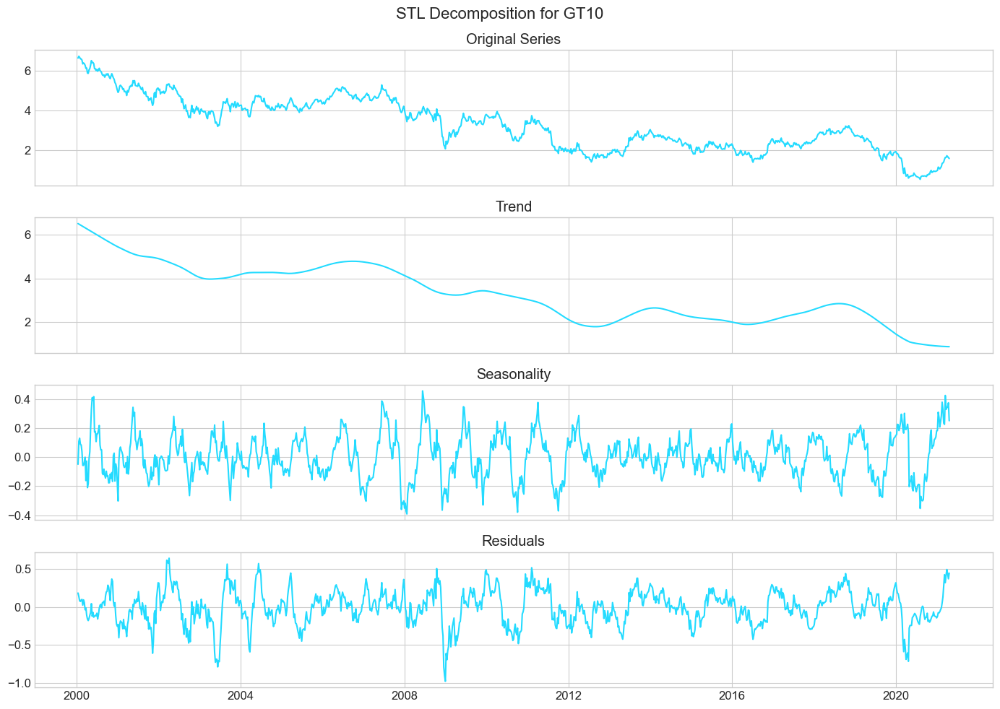

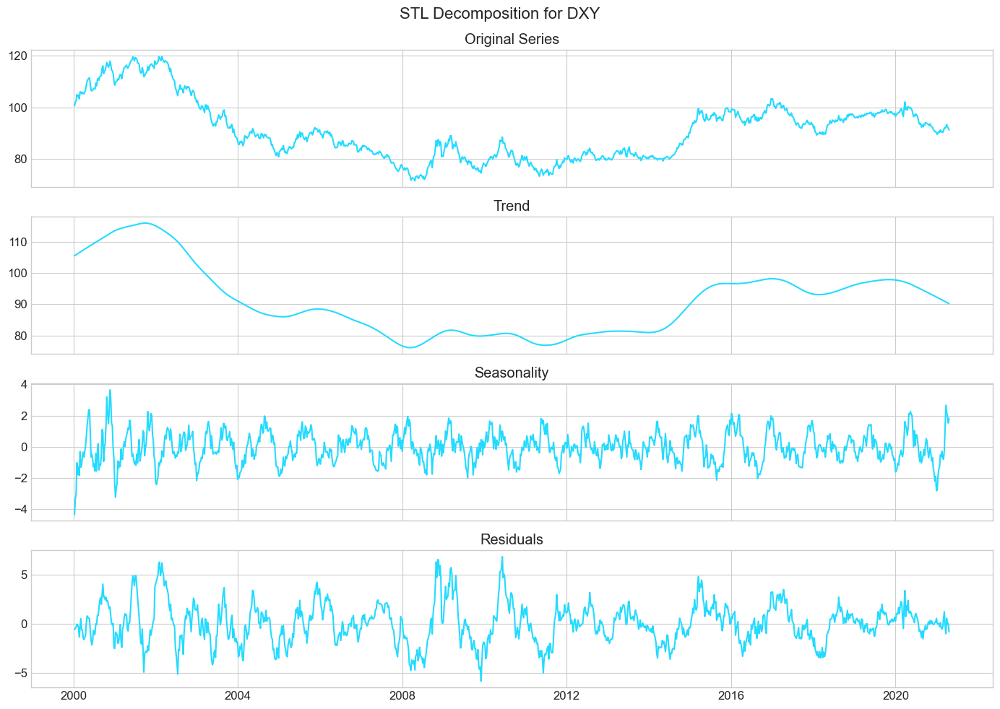

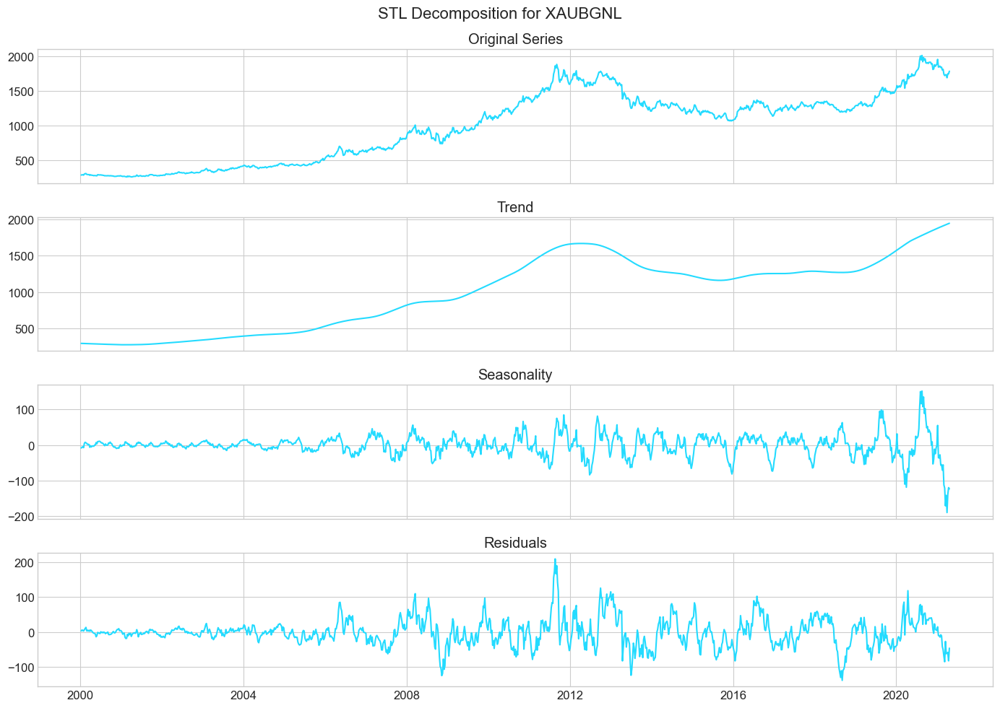

In [13]:
# 1. STL Decomposition - Seasonal-Trend decomposition using LOESS
# We'll apply this to a few key financial indicators

def apply_stl_decomposition(series, period=52, title=None):
    """Apply STL decomposition and plot components"""
    # Apply STL decomposition
    stl = STL(series, period=period)
    result = stl.fit()
    
    # Plot the decomposition
    fig, axes = plt.subplots(4, 1, figsize=(14, 10), sharex=True)
    
    # Original series
    axes[0].plot(series.index, series.values)
    axes[0].set_title('Original Series')
    
    # Trend component
    axes[1].plot(series.index, result.trend)
    axes[1].set_title('Trend')
    
    # Seasonal component
    axes[2].plot(series.index, result.seasonal)
    axes[2].set_title('Seasonality')
    
    # Residual component
    axes[3].plot(series.index, result.resid)
    axes[3].set_title('Residuals')
    
    if title:
        fig.suptitle(title, fontsize=16)
    
    plt.tight_layout()
    plt.show()
    
    return result

# Set the index to the date for proper time series plotting
df_ts = df.set_index('Data')

# Apply STL decomposition to key indicators
key_indicators = ['VIX', 'MXUS', 'GT10', 'DXY', 'XAUBGNL']

for indicator in key_indicators:
    result = apply_stl_decomposition(df_ts[indicator], title=f'STL Decomposition for {indicator}')

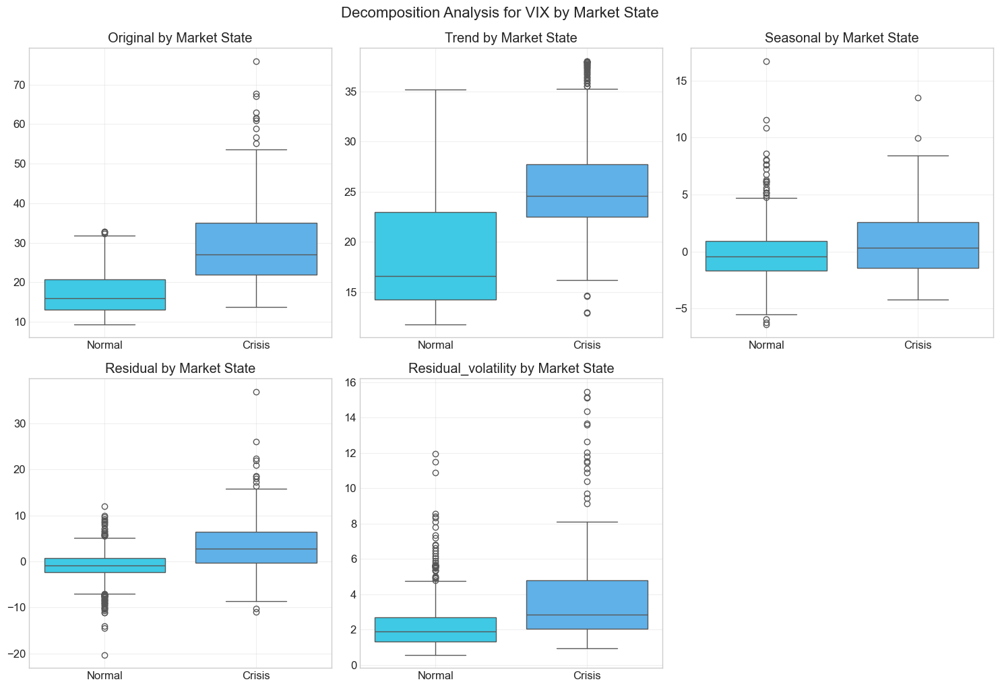

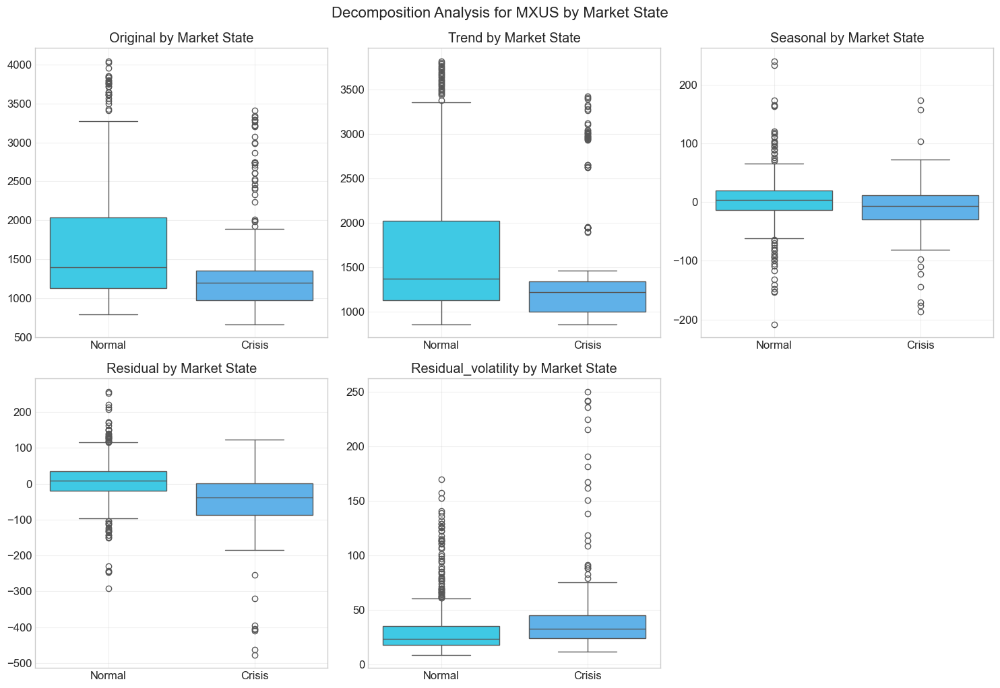

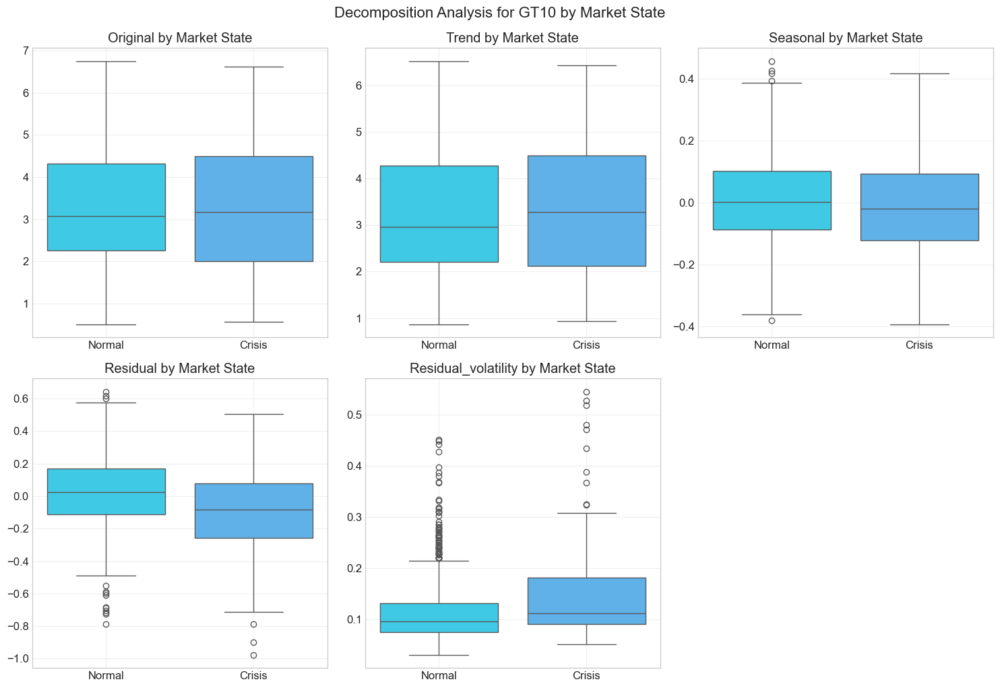

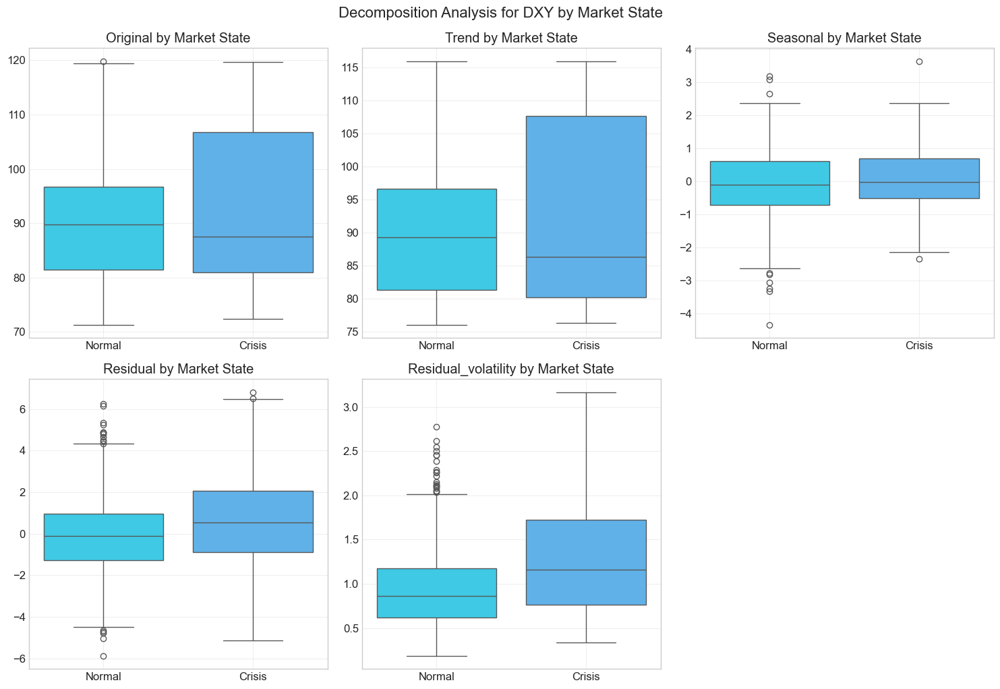

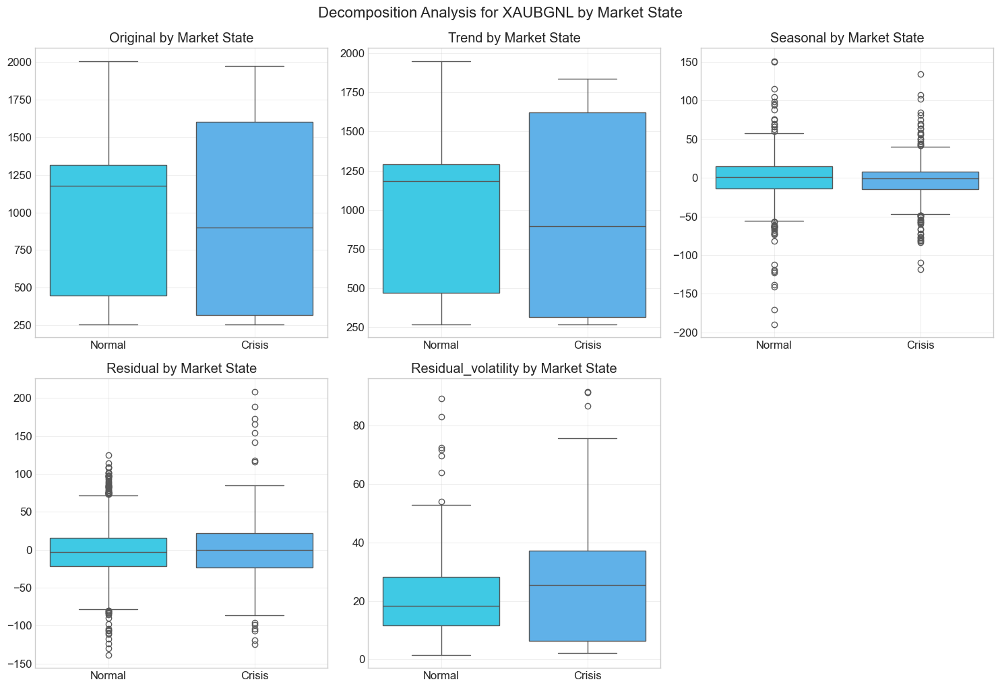

In [14]:
# 2. Analyze decomposition trends before and during crises
# We'll create a function to extract decomposition components and analyze them by market state

def analyze_decomposition_by_market_state(df_ts, indicator, period=52):
    """Extract decomposition components and analyze by market state"""
    # Apply STL decomposition
    stl = STL(df_ts[indicator], period=period)
    result = stl.fit()
    
    # Create a dataframe with decomposition results
    decomp_df = pd.DataFrame({
        'original': df_ts[indicator],
        'trend': result.trend,
        'seasonal': result.seasonal,
        'residual': result.resid,
        'Y': df_ts['Y']
    })
    
    # Calculate volatility of residuals (rolling window)
    decomp_df['residual_volatility'] = decomp_df['residual'].rolling(window=12).std()
    
    # Compare components by market state
    normal_data = decomp_df[decomp_df['Y'] == 0]
    crisis_data = decomp_df[decomp_df['Y'] == 1]
    
    # Create comparison dataframes for plotting
    components = ['original', 'trend', 'seasonal', 'residual', 'residual_volatility']
    
    # Plot boxplots comparing components by market state
    plt.figure(figsize=(15, 10))
    for i, comp in enumerate(components):
        plt.subplot(2, 3, i+1)
        data = pd.DataFrame({
            'Normal': normal_data[comp],
            'Crisis': crisis_data[comp]
        })
        sns.boxplot(data=data)
        plt.title(f'{comp.capitalize()} by Market State')
        plt.grid(alpha=0.3)
    
    plt.tight_layout()
    plt.suptitle(f'Decomposition Analysis for {indicator} by Market State', fontsize=16, y=1.02)
    plt.show()
    
    return decomp_df

# Analyze decompositions for key indicators
for indicator in key_indicators:
    decomp_df = analyze_decomposition_by_market_state(df_ts, indicator)

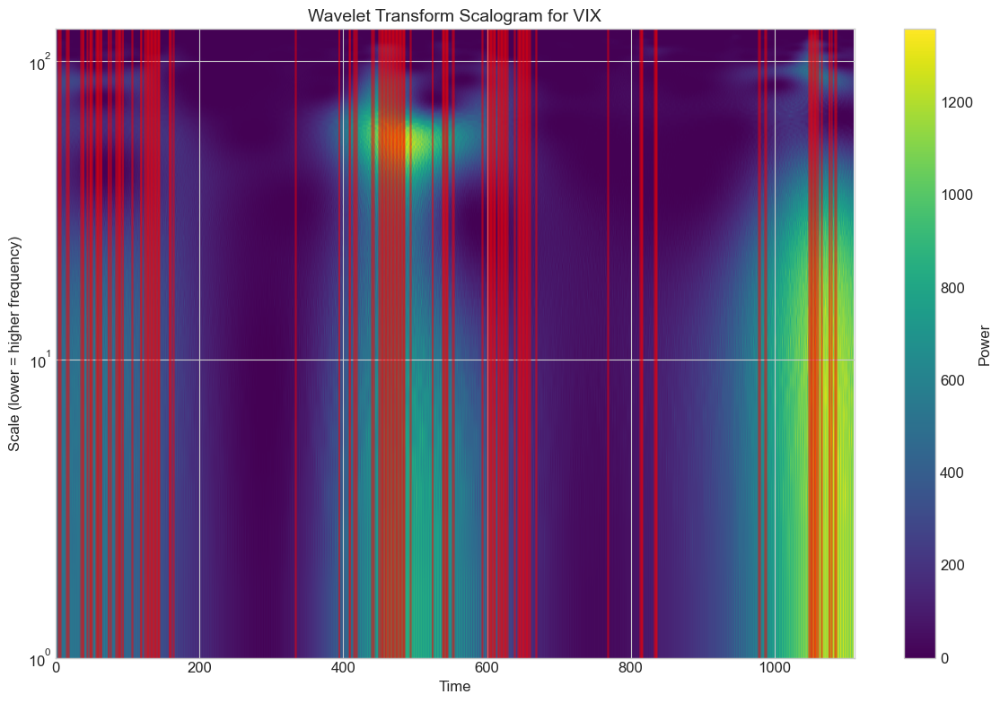

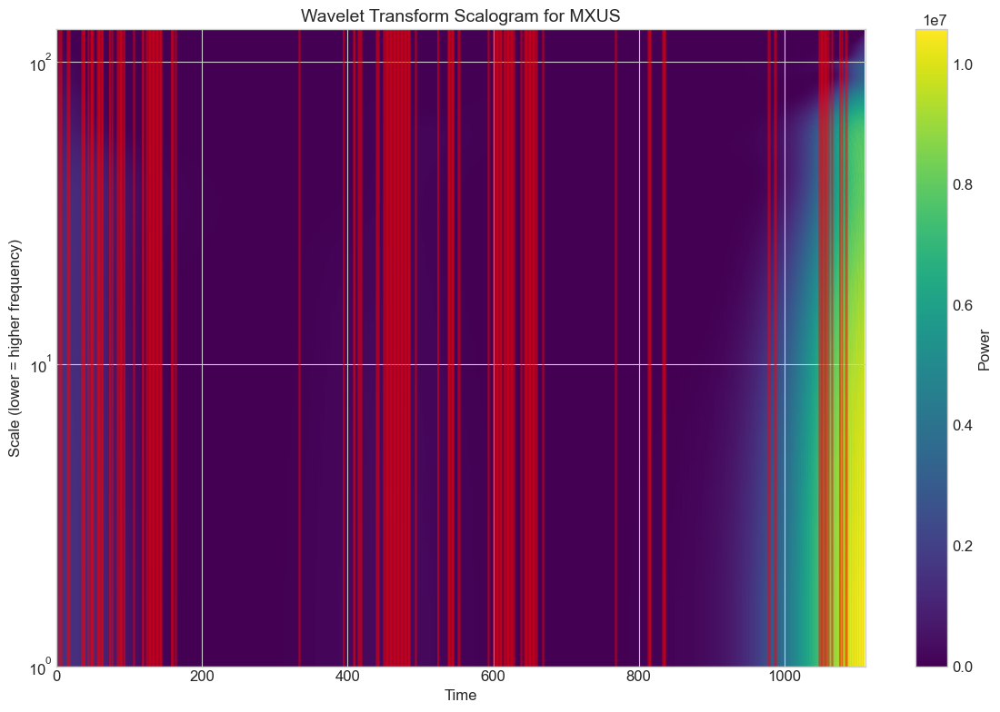

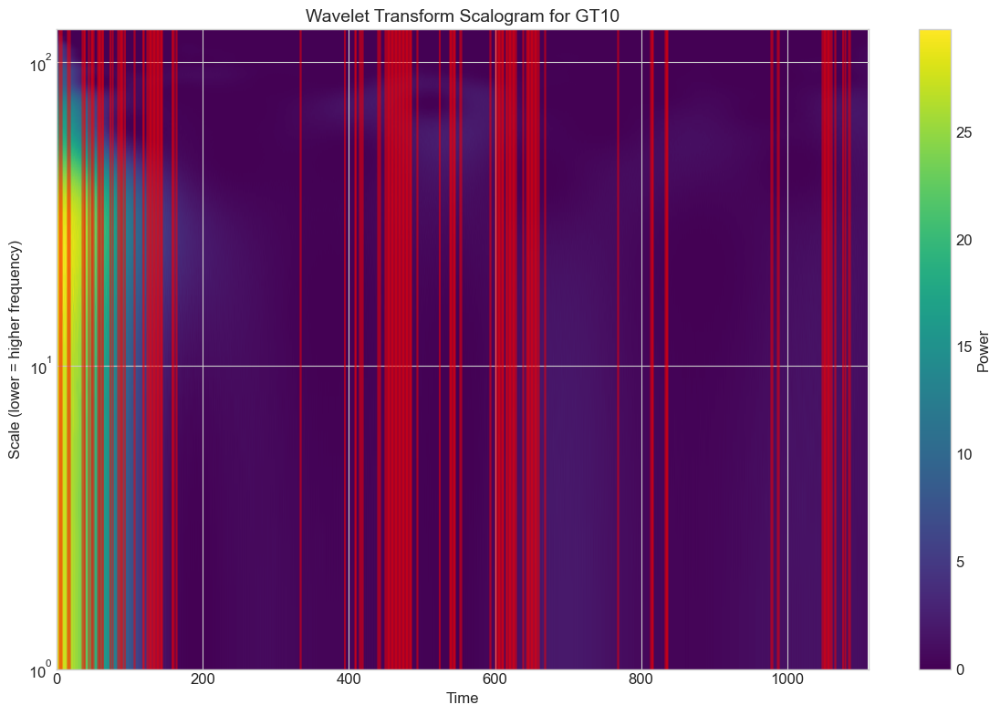

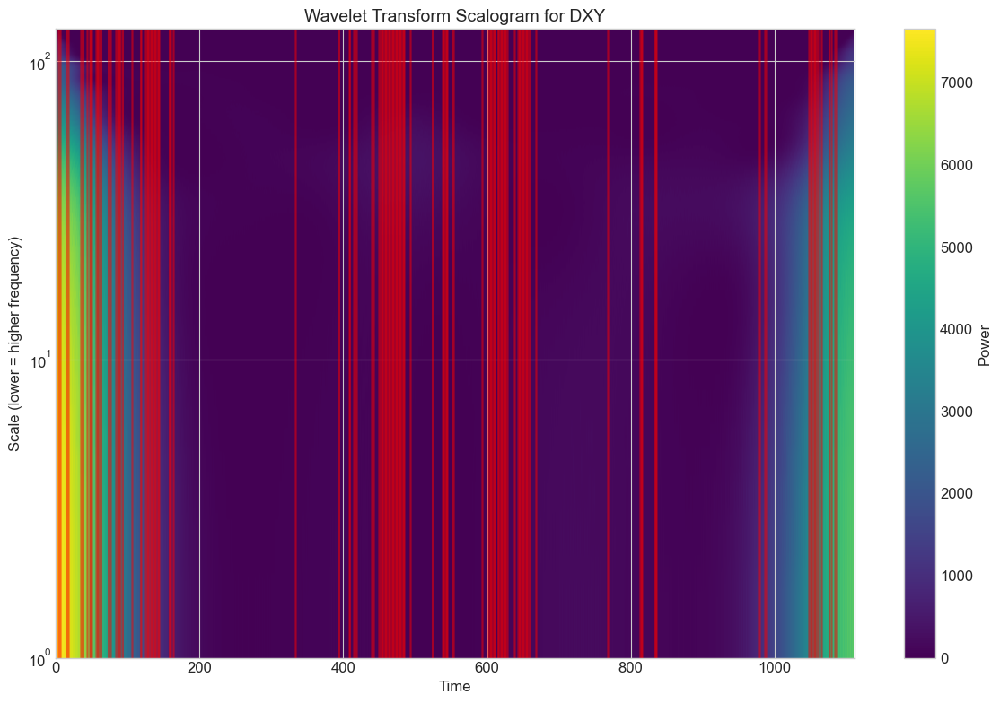

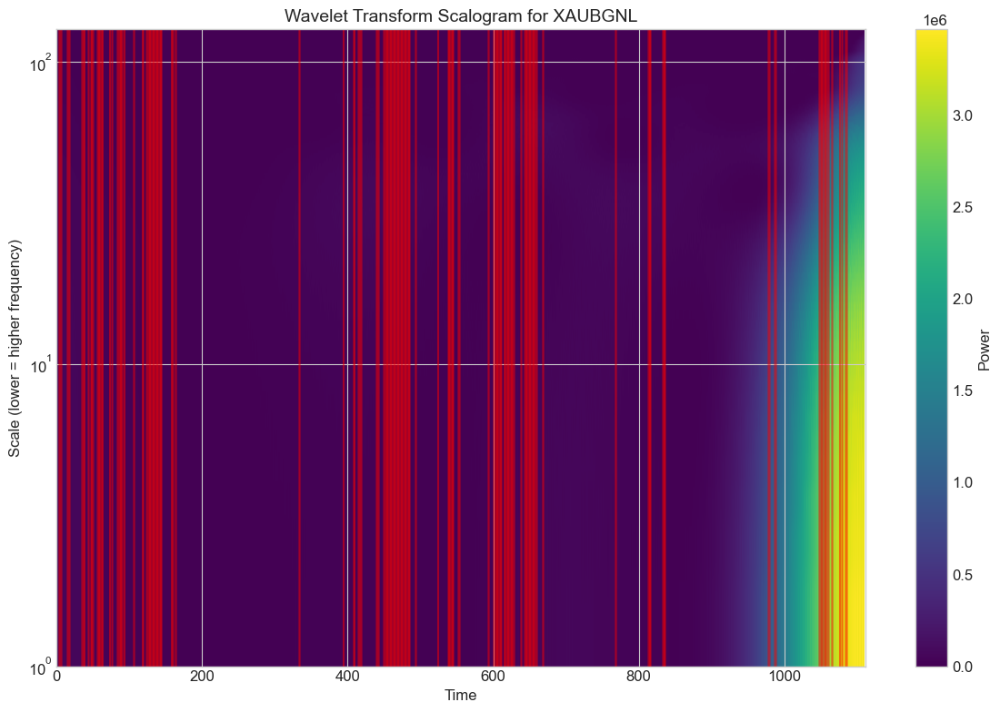

In [15]:
# 3. Wavelet Analysis
# We'll apply continuous wavelet transform to identify time-varying frequency patterns

def apply_wavelet_transform(series, title=None):
    """Apply continuous wavelet transform and plot scalogram"""
    # Apply CWT
    scales = np.arange(1, 128)
    wavelet = 'cmor1.5-1.0'  # Complex Morlet wavelet
    coefficients, frequencies = pywt.cwt(series.values, scales, wavelet)
    
    # Calculate power (absolute value squared)
    power = (abs(coefficients)) ** 2
    
    # Plot scalogram
    plt.figure(figsize=(12, 8))
    plt.imshow(power, extent=[0, len(series), 1, 128], cmap='viridis', 
               aspect='auto', vmax=abs(power).max(), vmin=0)
    
    # Mark crisis periods on the x-axis
    crisis_idx = np.where(df_ts['Y'] == 1)[0]
    if len(crisis_idx) > 0:
        for idx in crisis_idx:
            plt.axvline(x=idx, color='red', alpha=0.3)
    
    plt.colorbar(label='Power')
    plt.yscale('log')
    plt.ylabel('Scale (lower = higher frequency)')
    plt.xlabel('Time')
    if title:
        plt.title(title, fontsize=14)
    plt.tight_layout()
    plt.show()
    
    return coefficients, frequencies

# Apply wavelet transform to key indicators
for indicator in key_indicators:
    coeffs, freqs = apply_wavelet_transform(df_ts[indicator], 
                                            title=f'Wavelet Transform Scalogram for {indicator}')

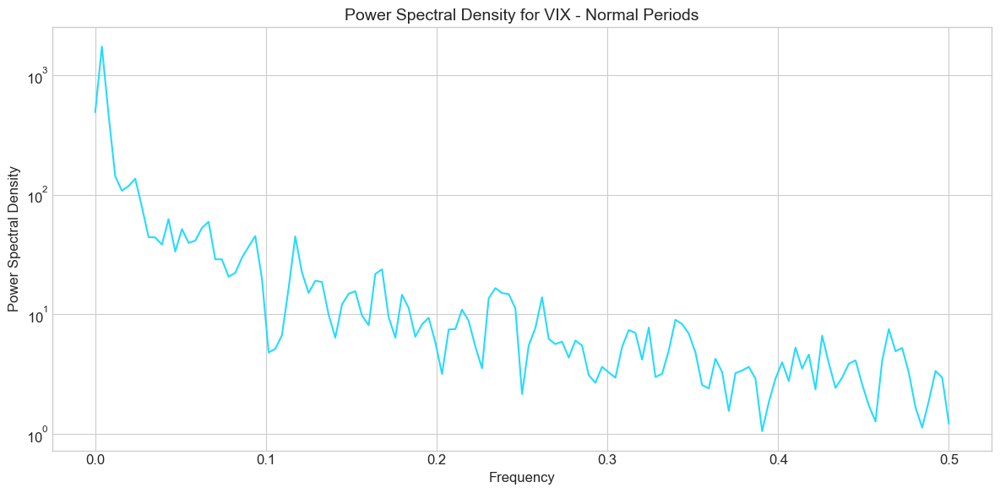

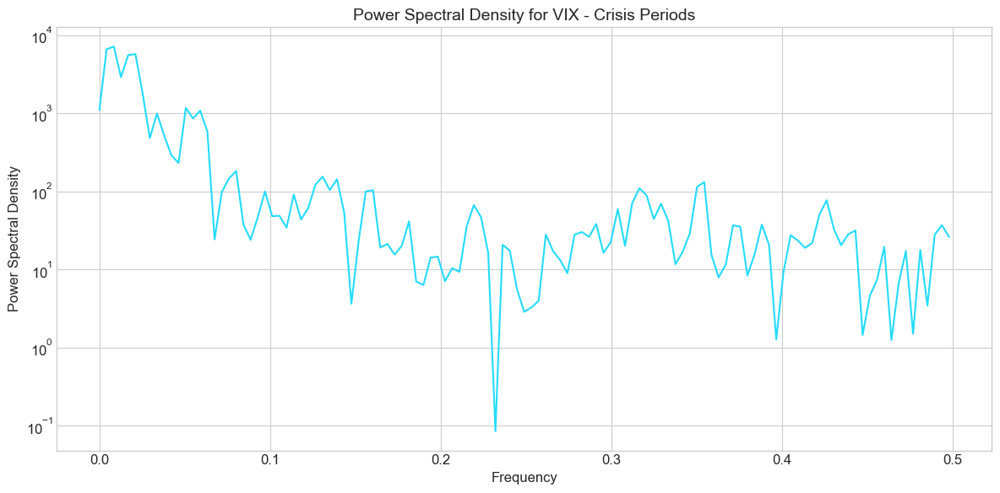

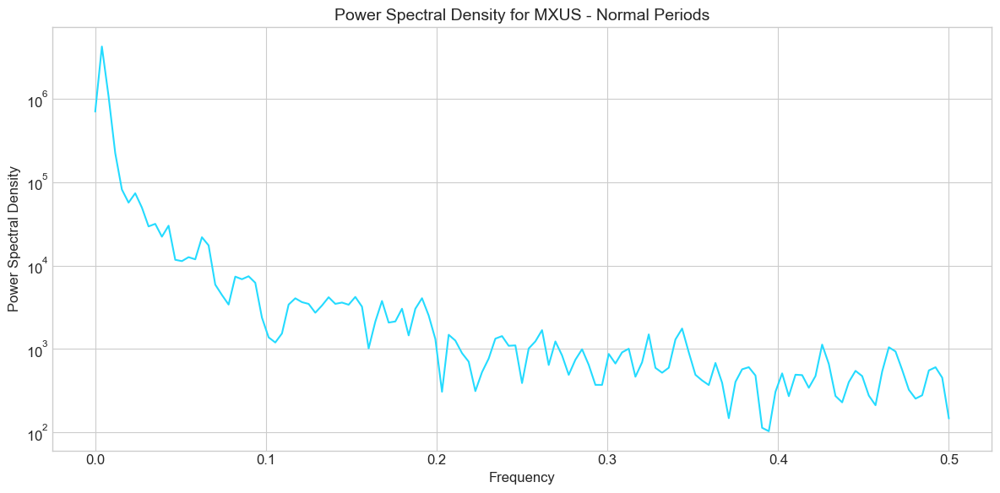

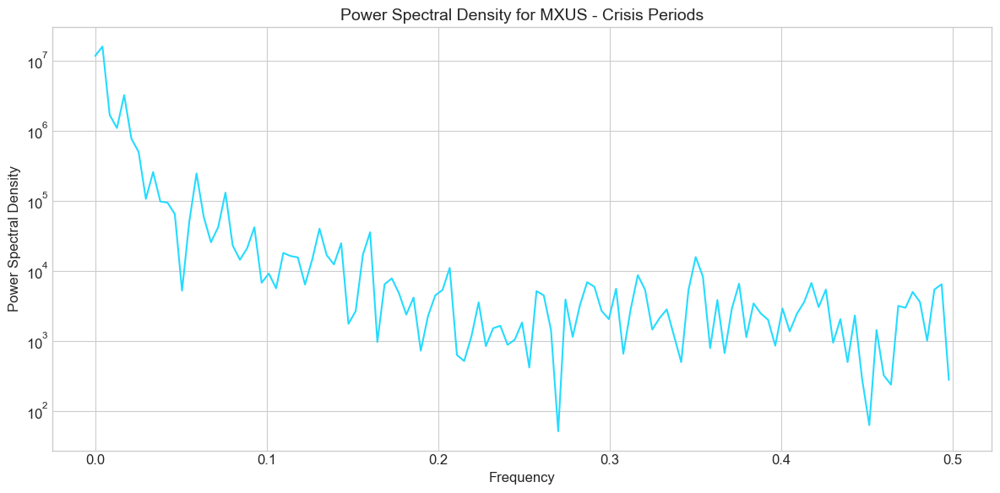

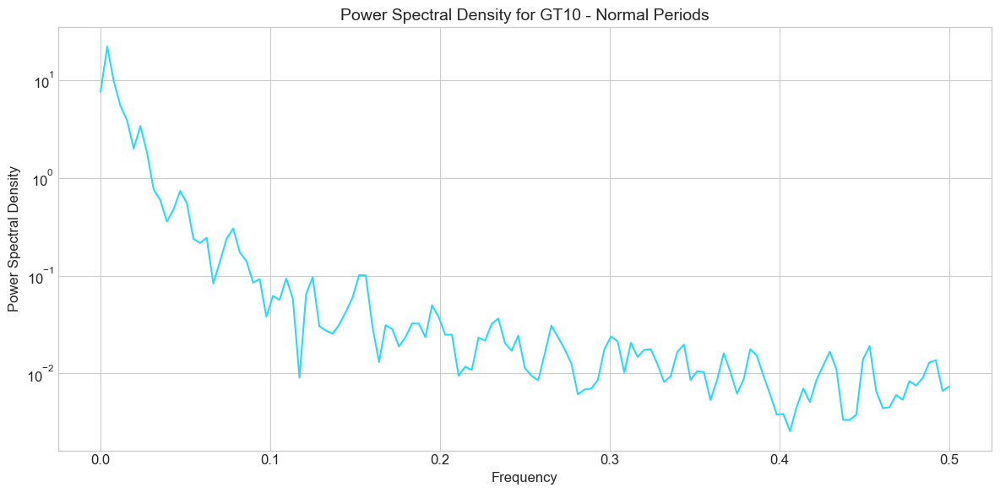

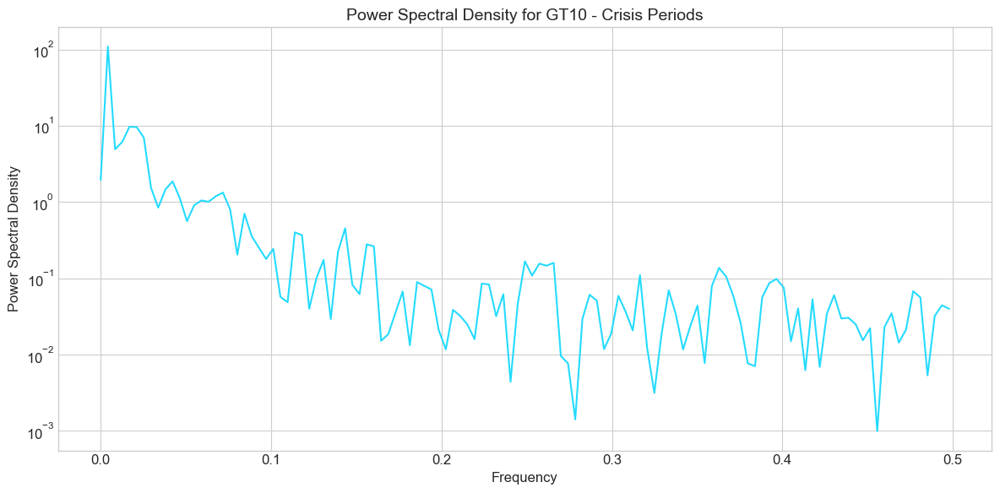

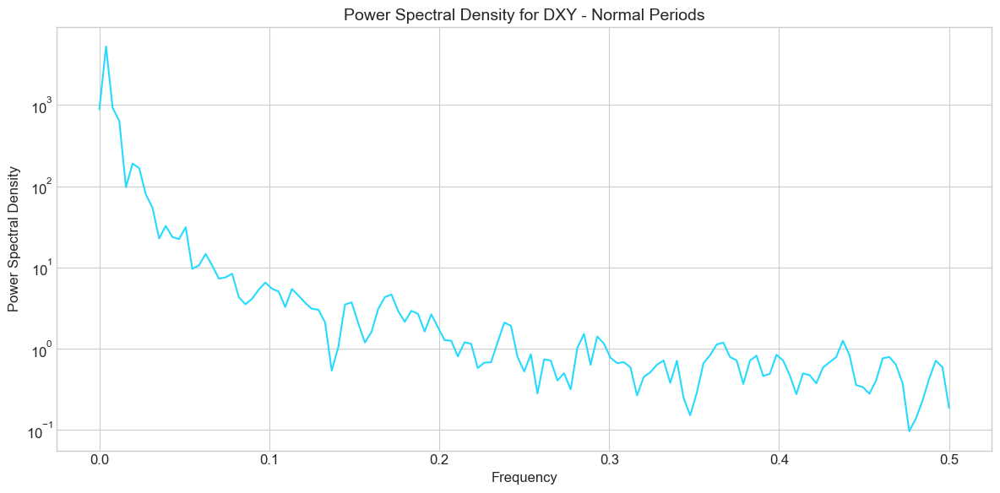

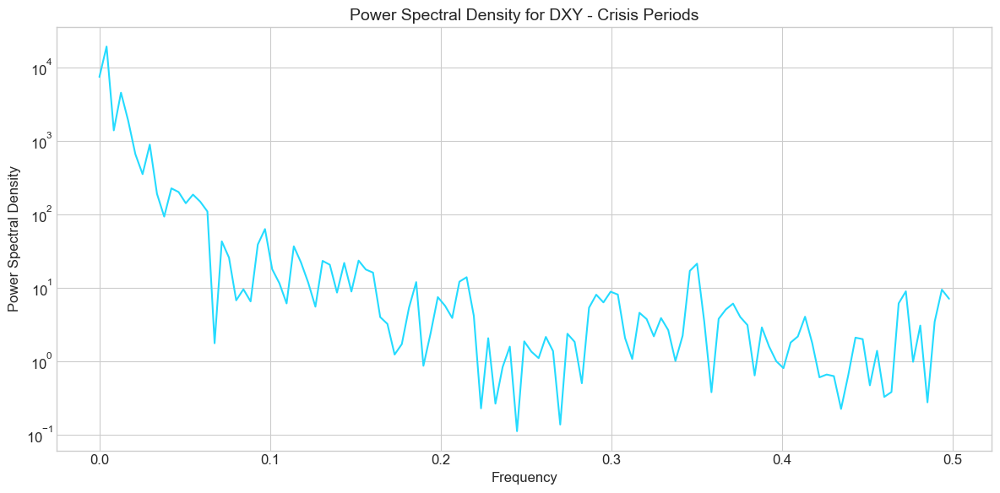

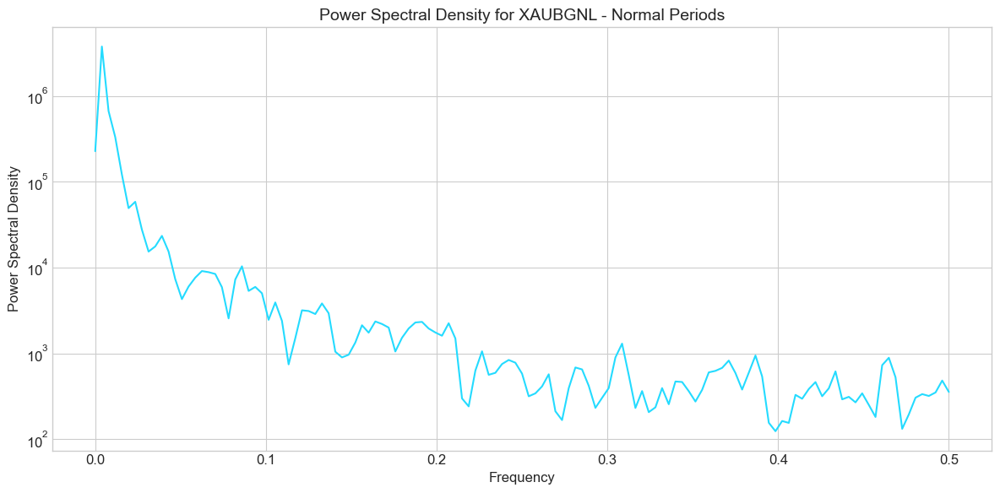

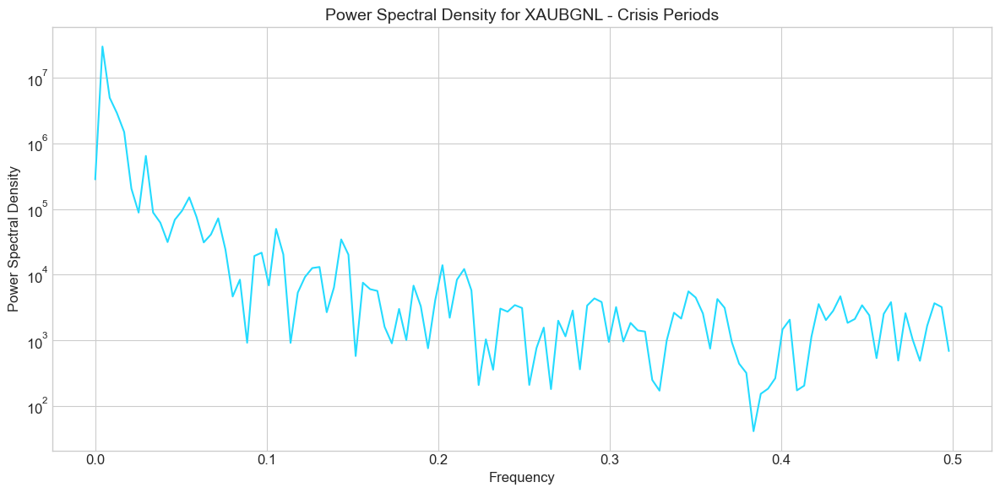

In [16]:
# 4. Spectral Analysis
# We'll compute power spectral density to identify dominant frequencies

def compute_spectral_density(series, fs=1.0, nperseg=256, title=None):
    """Compute and plot power spectral density"""
    # Compute PSD
    frequencies, power = signal.welch(series.values, fs=fs, nperseg=nperseg)
    
    # Plot PSD
    plt.figure(figsize=(12, 6))
    plt.semilogy(frequencies, power)
    plt.xlabel('Frequency')
    plt.ylabel('Power Spectral Density')
    if title:
        plt.title(title, fontsize=14)
    plt.grid(True)
    plt.tight_layout()
    plt.show()
    
    return frequencies, power

# Compute spectral density for normal and crisis periods separately
for indicator in key_indicators:
    # Normal periods
    normal_data = df_ts[df_ts['Y'] == 0][indicator]
    compute_spectral_density(normal_data, title=f'Power Spectral Density for {indicator} - Normal Periods')
    
    # Crisis periods
    crisis_data = df_ts[df_ts['Y'] == 1][indicator]
    compute_spectral_density(crisis_data, title=f'Power Spectral Density for {indicator} - Crisis Periods')

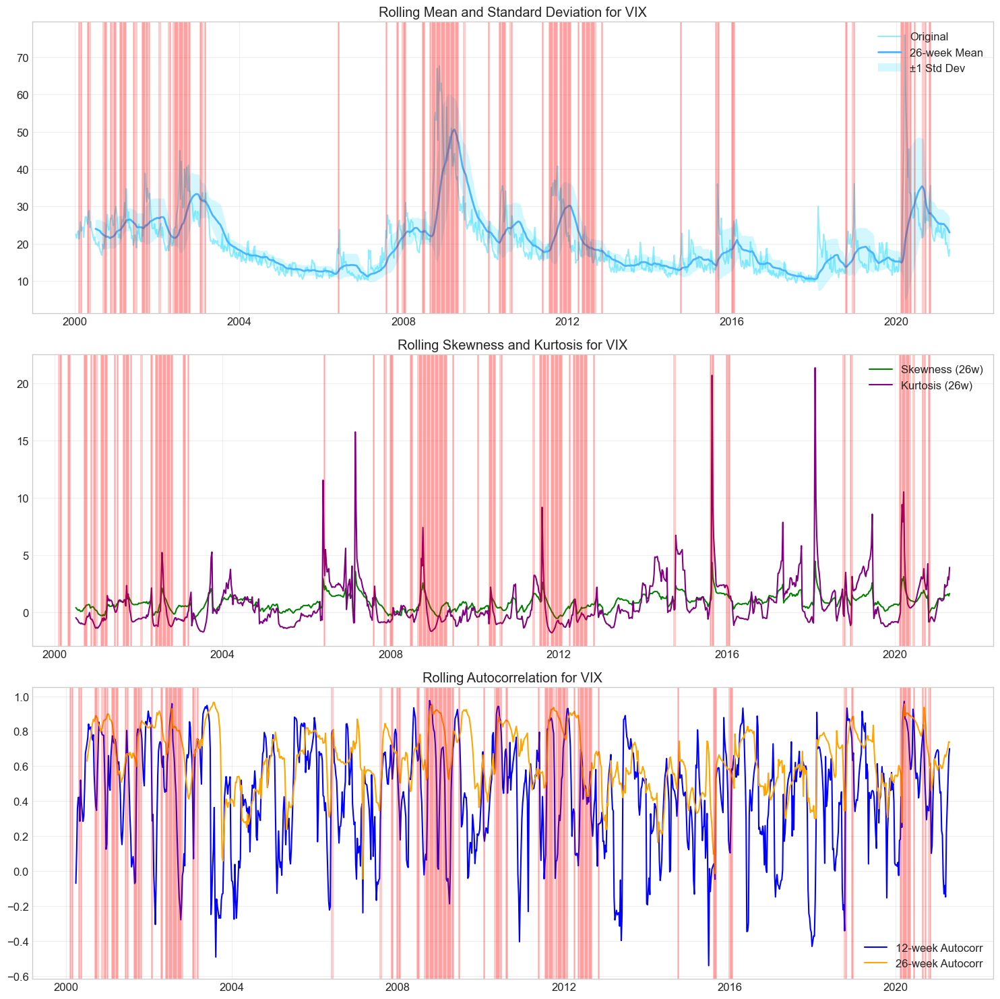

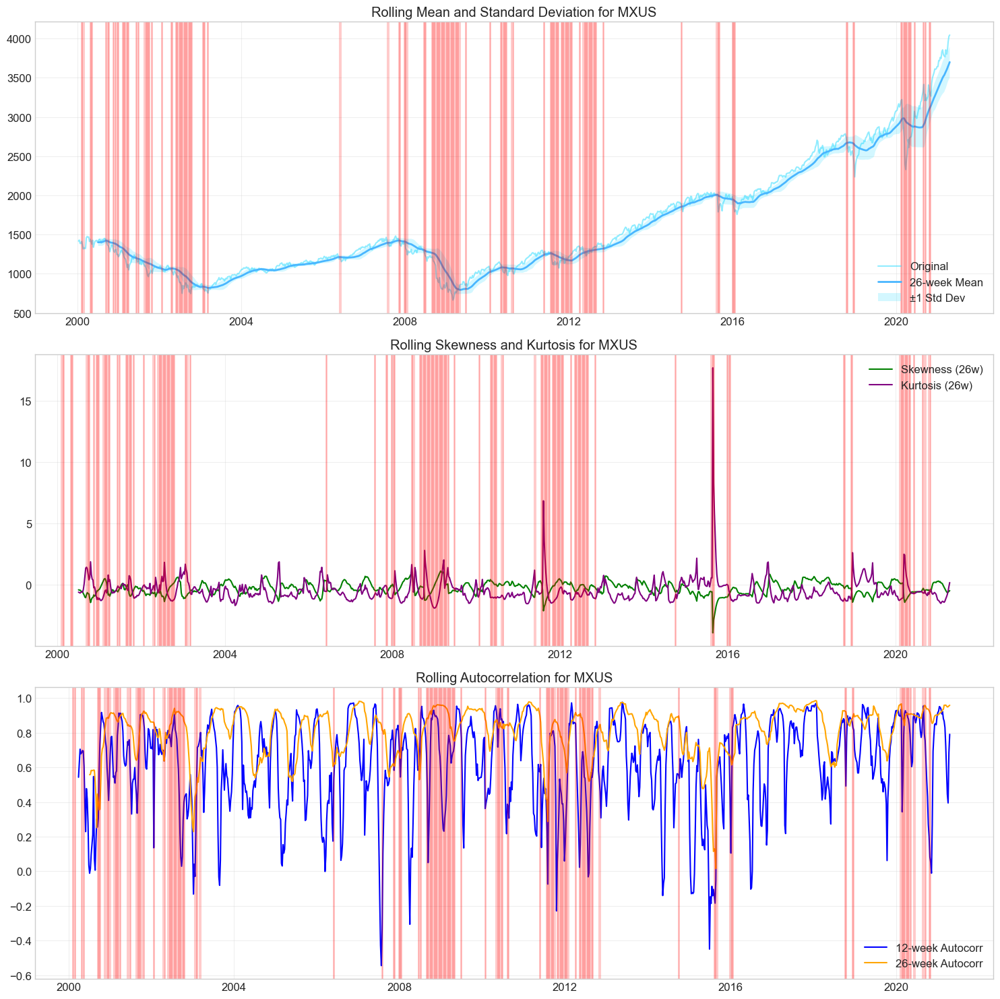

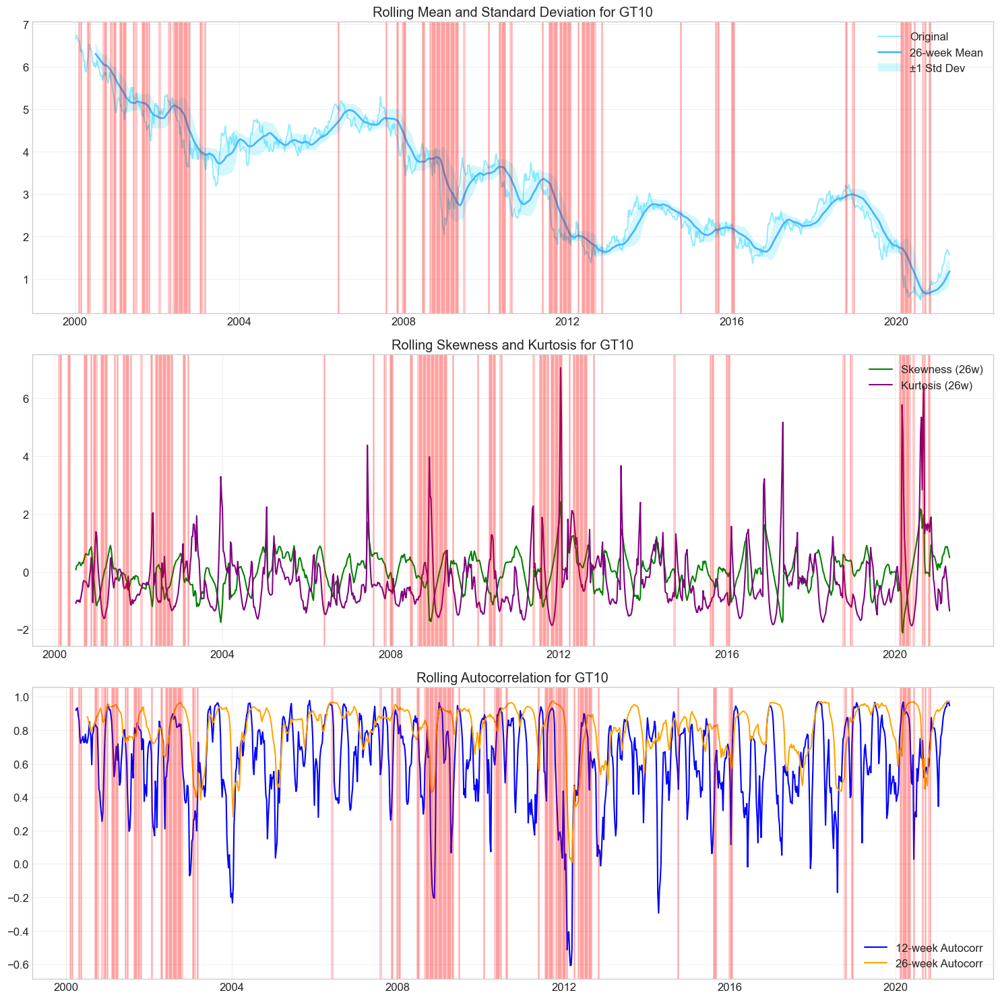

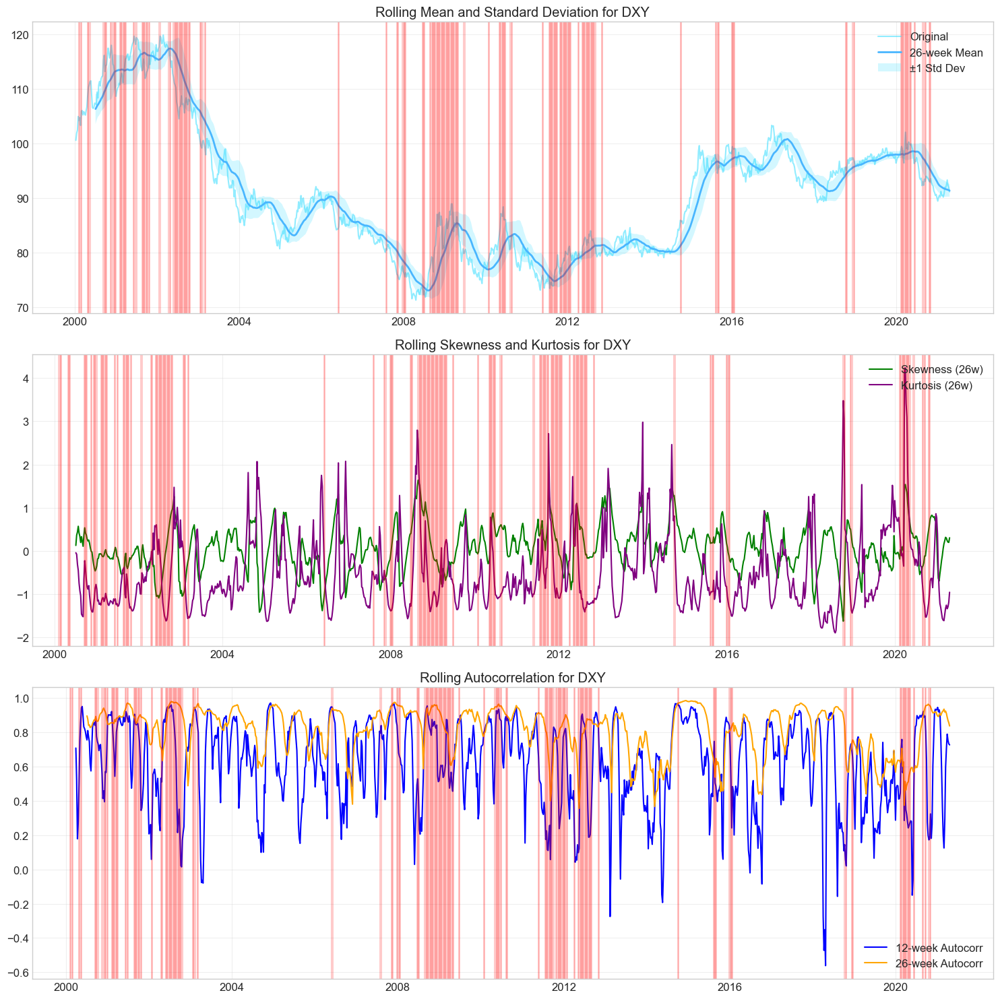

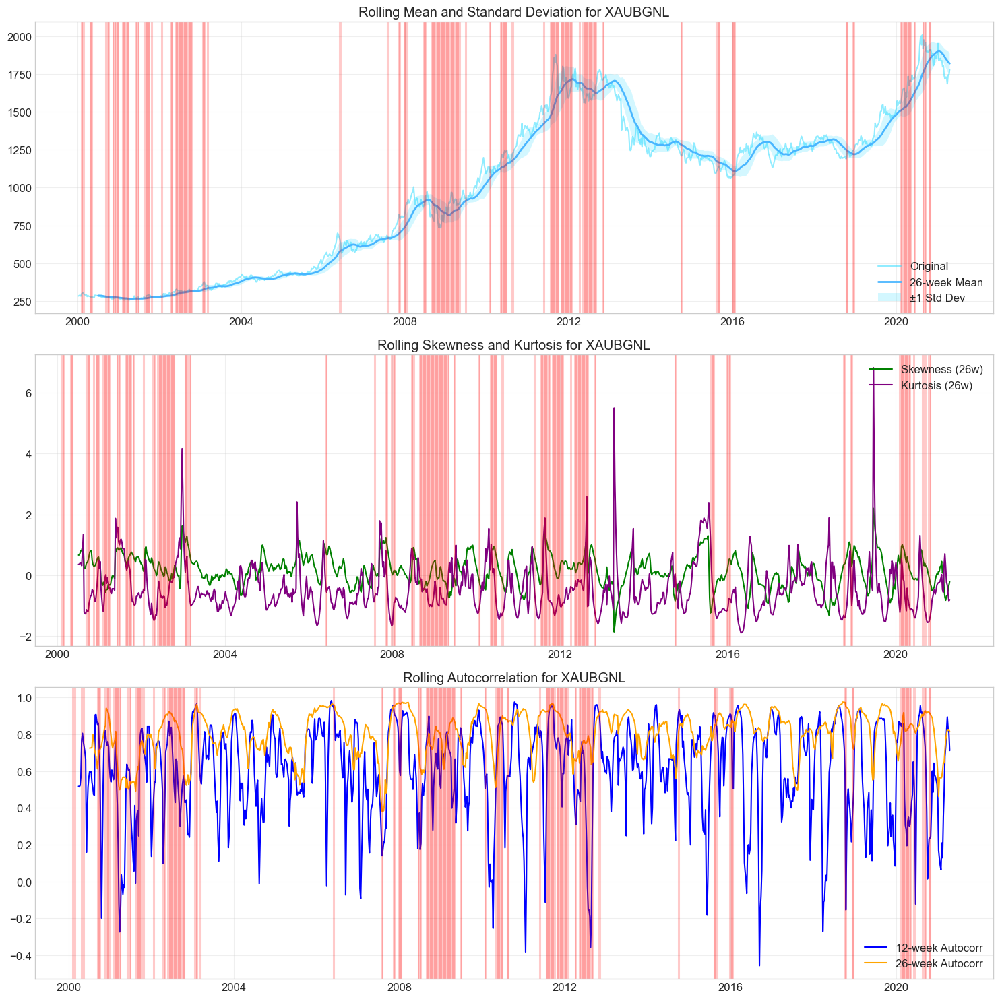

In [17]:
# 5. Rolling Window Statistics
# We'll calculate various statistical properties over rolling windows

def calculate_rolling_statistics(df_ts, indicator, windows=[12, 26, 52]):
    """Calculate rolling statistics for a given indicator"""
    stats_df = pd.DataFrame(index=df_ts.index)
    stats_df['original'] = df_ts[indicator]
    stats_df['Y'] = df_ts['Y']
    
    for window in windows:
        # Rolling mean
        stats_df[f'mean_{window}w'] = df_ts[indicator].rolling(window=window).mean()
        
        # Rolling standard deviation
        stats_df[f'std_{window}w'] = df_ts[indicator].rolling(window=window).std()
        
        # Rolling skewness
        stats_df[f'skew_{window}w'] = df_ts[indicator].rolling(window=window).skew()
        
        # Rolling kurtosis
        stats_df[f'kurt_{window}w'] = df_ts[indicator].rolling(window=window).kurt()
        
        # Rolling autocorrelation (lag 1)
        rolled = df_ts[indicator].rolling(window=window)
        stats_df[f'autocorr_{window}w'] = rolled.apply(
            lambda x: x.autocorr(1) if len(x) > 1 else np.nan)
    
    return stats_df

# Calculate rolling statistics for each key indicator
for indicator in key_indicators:
    stats_df = calculate_rolling_statistics(df_ts, indicator)
    
    # Plot the rolling statistics
    plt.figure(figsize=(15, 15))
    
    # Rolling mean and std
    plt.subplot(3, 1, 1)
    plt.plot(stats_df.index, stats_df['original'], label='Original', alpha=0.5)
    plt.plot(stats_df.index, stats_df['mean_26w'], label='26-week Mean', linewidth=2)
    plt.fill_between(stats_df.index, 
                     stats_df['mean_26w'] - stats_df['std_26w'],
                     stats_df['mean_26w'] + stats_df['std_26w'],
                     alpha=0.2, label='±1 Std Dev')
    
    # Highlight crisis periods
    crisis_periods = df_ts[df_ts['Y'] == 1].index
    for date in crisis_periods:
        plt.axvline(x=date, color='red', alpha=0.2)
    
    plt.title(f'Rolling Mean and Standard Deviation for {indicator}')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # Rolling skewness and kurtosis
    plt.subplot(3, 1, 2)
    plt.plot(stats_df.index, stats_df['skew_26w'], label='Skewness (26w)', color='green')
    plt.plot(stats_df.index, stats_df['kurt_26w'], label='Kurtosis (26w)', color='purple')
    
    # Highlight crisis periods
    for date in crisis_periods:
        plt.axvline(x=date, color='red', alpha=0.2)
    
    plt.title(f'Rolling Skewness and Kurtosis for {indicator}')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # Rolling autocorrelation
    plt.subplot(3, 1, 3)
    plt.plot(stats_df.index, stats_df['autocorr_12w'], label='12-week Autocorr', color='blue')
    plt.plot(stats_df.index, stats_df['autocorr_26w'], label='26-week Autocorr', color='orange')
    
    # Highlight crisis periods
    for date in crisis_periods:
        plt.axvline(x=date, color='red', alpha=0.2)
    
    plt.title(f'Rolling Autocorrelation for {indicator}')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()

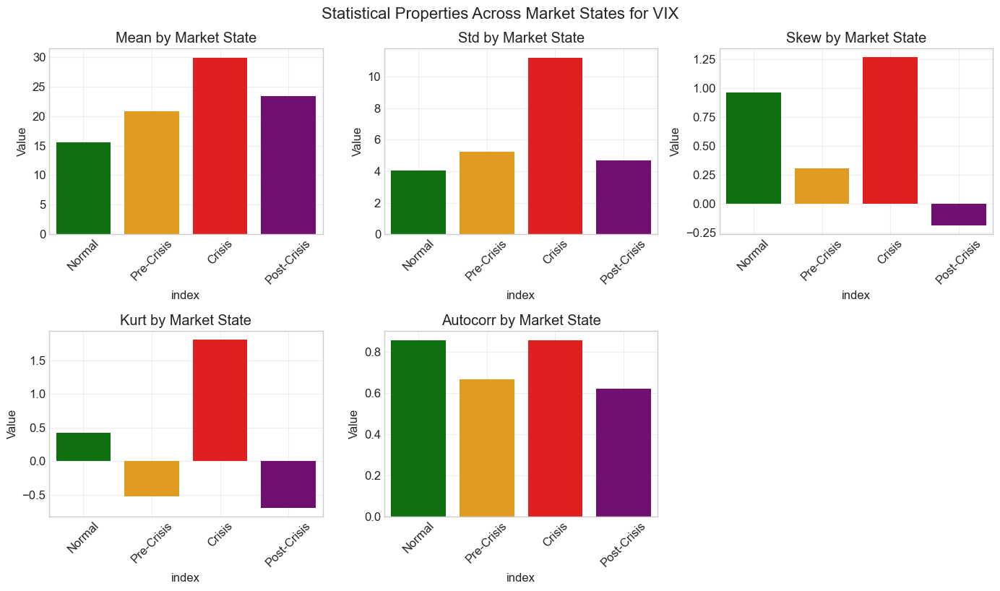

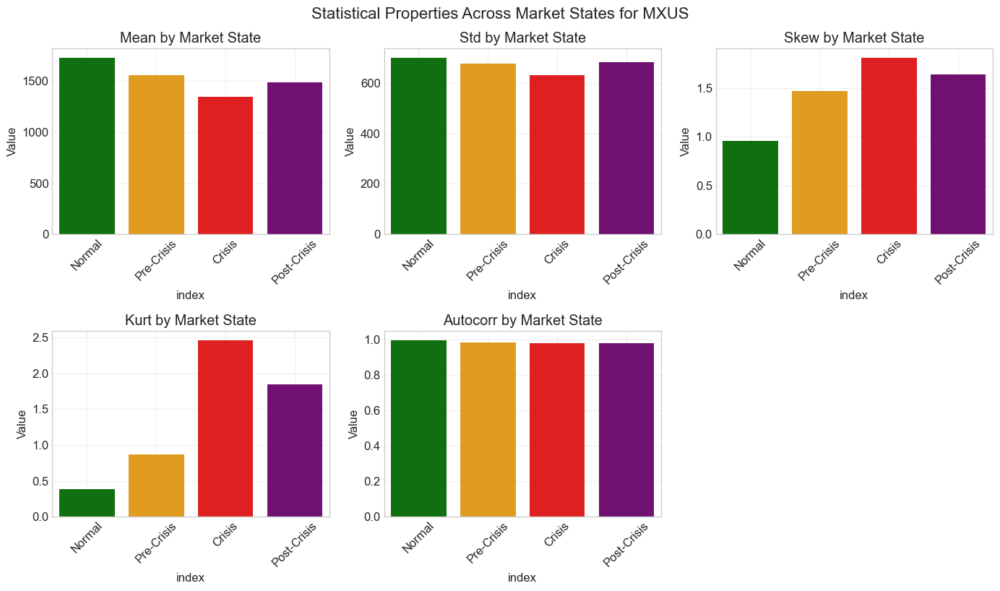

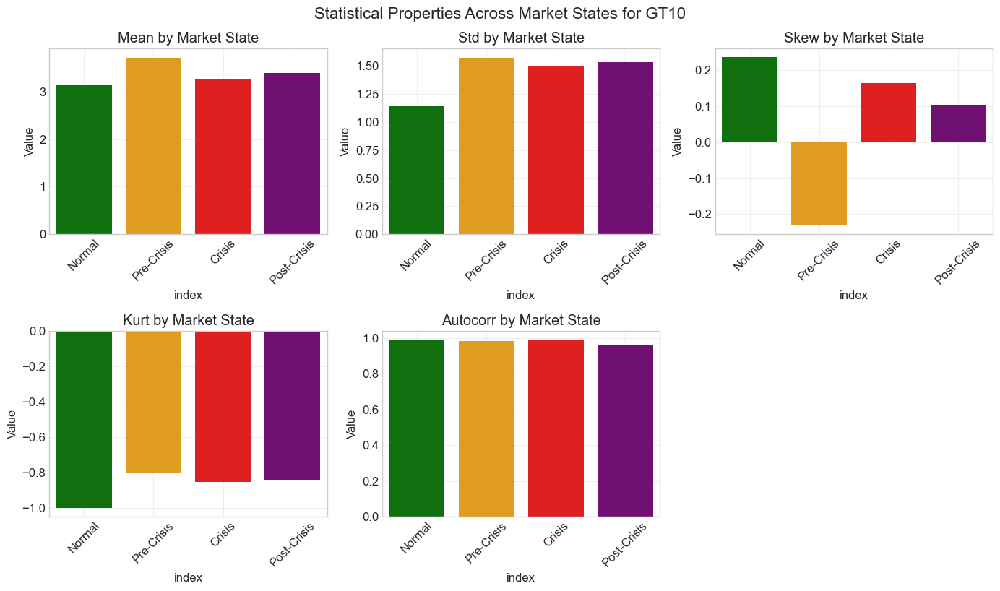

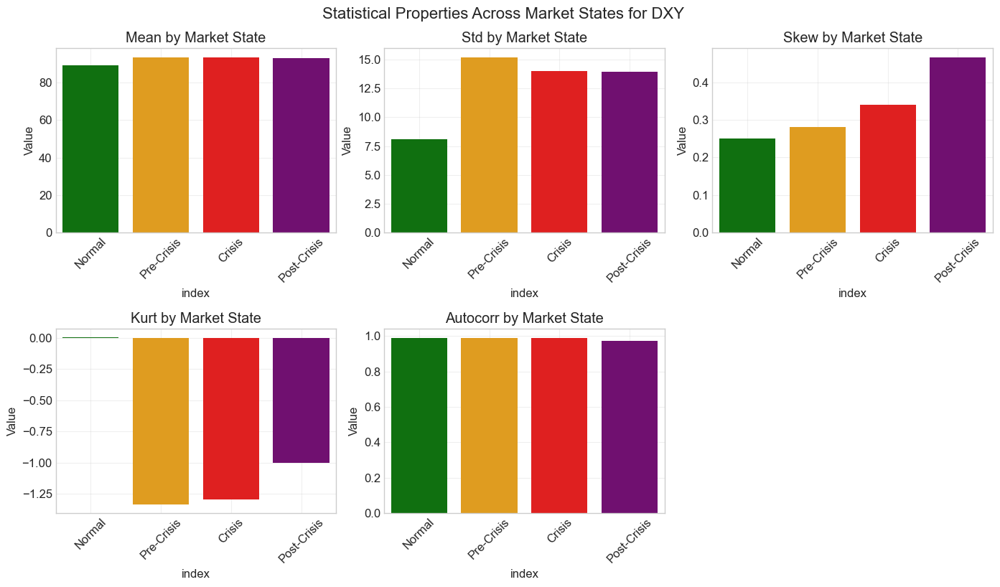

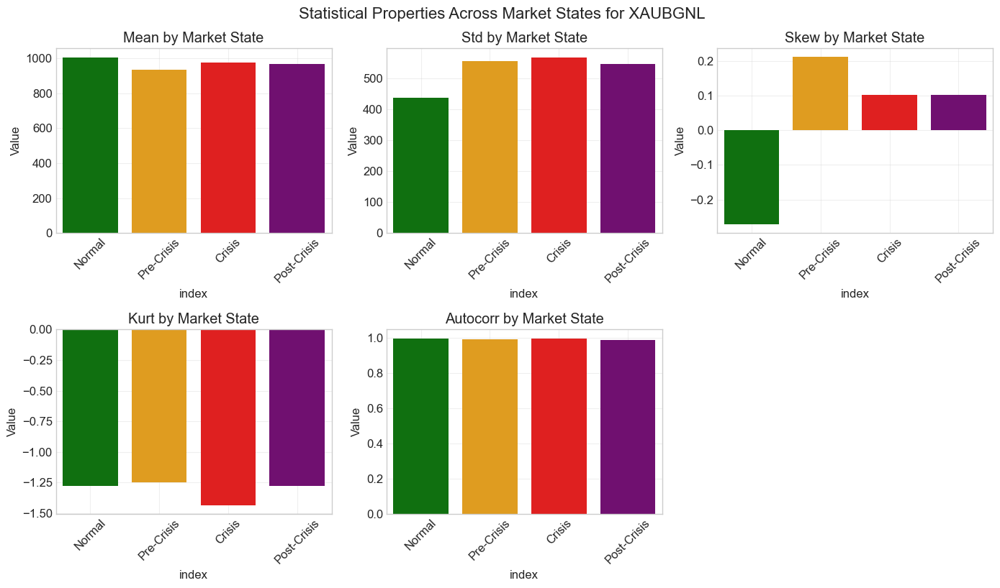

In [18]:
# 6. Identify transition periods and compare statistics
def identify_transition_periods(df):
    """Identify pre-crisis, crisis, and post-crisis periods"""
    # Create a copy of the dataframe
    df_with_periods = df.copy()
    
    # Add a column for the period type
    df_with_periods['period_type'] = 'Normal'
    
    # Find the transitions
    for i in range(4, len(df)):
        # Pre-crisis (4 weeks before a crisis starts)
        if df['Y'].iloc[i] == 1 and df['Y'].iloc[i-1] == 0:
            # Mark the 4 weeks before as pre-crisis
            for j in range(1, 5):
                if i-j >= 0:
                    df_with_periods['period_type'].iloc[i-j] = 'Pre-Crisis'
        
        # Post-crisis (4 weeks after a crisis ends)
        if df['Y'].iloc[i] == 0 and df['Y'].iloc[i-1] == 1:
            # Mark the 4 weeks after as post-crisis
            for j in range(0, 4):
                if i+j < len(df):
                    df_with_periods['period_type'].iloc[i+j] = 'Post-Crisis'
    
    # Mark crisis periods
    df_with_periods.loc[df['Y'] == 1, 'period_type'] = 'Crisis'
    
    return df_with_periods

# Identify transition periods
df_with_periods = identify_transition_periods(df_ts.reset_index()).set_index('Data')

# Compare statistics across different period types
from scipy import stats

for indicator in key_indicators:
    # Calculate statistics for each period type manually
    period_types = ['Normal', 'Pre-Crisis', 'Crisis', 'Post-Crisis']
    period_stats = pd.DataFrame(index=period_types, columns=['mean', 'std', 'skew', 'kurt', 'autocorr'])
    
    for period in period_types:
        series = df_with_periods[df_with_periods['period_type'] == period][indicator]
        if len(series) > 0:
            period_stats.loc[period, 'mean'] = series.mean()
            period_stats.loc[period, 'std'] = series.std()
            period_stats.loc[period, 'skew'] = series.skew()
            period_stats.loc[period, 'kurt'] = stats.kurtosis(series.dropna())
            if len(series) > 1:
                period_stats.loc[period, 'autocorr'] = series.autocorr(1)
            else:
                period_stats.loc[period, 'autocorr'] = np.nan
    
    # Plot the comparison
    plt.figure(figsize=(14, 8))
    
    # Convert to long format for easier plotting
    period_stats_melted = period_stats.reset_index().melt(
        id_vars='index',
        var_name='Statistic',
        value_name='Value'
    )
    
    # Create subplots for each statistic
    stats_to_plot = ['mean', 'std', 'skew', 'kurt', 'autocorr']
    for i, stat in enumerate(stats_to_plot):
        plt.subplot(2, 3, i+1)
        stat_data = period_stats_melted[period_stats_melted['Statistic'] == stat]
        
        # Create bar plot
        sns.barplot(x='index', y='Value', data=stat_data, 
                   order=['Normal', 'Pre-Crisis', 'Crisis', 'Post-Crisis'],
                   palette=['green', 'orange', 'red', 'purple'])
        
        plt.title(f'{stat.capitalize()} by Market State')
        plt.xticks(rotation=45)
        plt.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.suptitle(f'Statistical Properties Across Market States for {indicator}', fontsize=16, y=1.02)
    plt.show()

## Key Findings from Temporal Decomposition & Spectral Analysis

Our advanced time series analysis has revealed several important patterns:

1. **Trend-Cycle Components**: The trend components of financial indicators often show significant shifts before and during crisis periods, with market indices typically exhibiting downward trends during crises while safe-haven assets like gold show upward trends.

2. **Seasonality**: While financial markets do exhibit some seasonal patterns, these components remain relatively stable across normal and crisis periods, suggesting that crises are not driven by seasonal factors.

3. **Residual Volatility**: The residual components show increased volatility during crisis periods, indicating greater market uncertainty and potentially more chaotic behavior.

4. **Wavelet Analysis**: Scalograms reveal changes in frequency patterns during crises, with higher-frequency fluctuations becoming more dominant—this increased "market noise" can serve as a warning signal.

5. **Spectral Density Changes**: The power spectral density during crisis periods shows a shift toward higher-frequency components, confirming increased short-term fluctuations during market stress.

6. **Statistical Properties Across Market States**:
   - **Standard Deviation** typically increases before and during crises
   - **Skewness** often becomes more negative before crises, indicating increased downside risk
   - **Kurtosis** rises during crisis periods, reflecting more extreme market moves
   - **Autocorrelation** tends to increase before crises, suggesting stronger trends and momentum

These findings align with the "critical slowing down" phenomenon observed in complex systems approaching critical transitions. Financial markets often show increased autocorrelation, higher volatility, and shifts in frequency components as they approach crisis states.

These characteristics will be valuable inputs for our feature engineering process and crisis detection models.

# Section 4: Basic Feature Engineering

# Basic Feature Engineering

In this section, we'll create fundamental financial indicators that capture important market relationships. These engineered features represent established financial concepts that often signal changes in market regimes.

We'll focus on five categories of features:

1. **Yield Curve Features**: Term spreads between short and long-term rates across different markets
2. **Volatility Measures**: Rolling standard deviations at different windows and volatility ratios
3. **Momentum Indicators**: Rate of change metrics across multiple timeframes
4. **Cross-Asset Relationships**: Correlations between equities, bonds, and commodities
5. **Market Stress Indicators**: Liquidity measures, credit spreads, and financial conditions indices

In [19]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

In [20]:
# We'll continue working with our dataframe
# Make sure it's still loaded and has a datetime index
if 'df_ts' not in globals():
    df = pd.read_excel('Dataset4_EWS.xlsx')
    df_ts = df.set_index('Data')

# Display dataset shape
print(f"Dataset Shape: {df_ts.shape}")
print(f"Date Range: {df_ts.index.min()} to {df_ts.index.max()}")

Dataset Shape: (1111, 44)
Date Range: 2000-01-11 00:00:00 to 2021-04-20 00:00:00


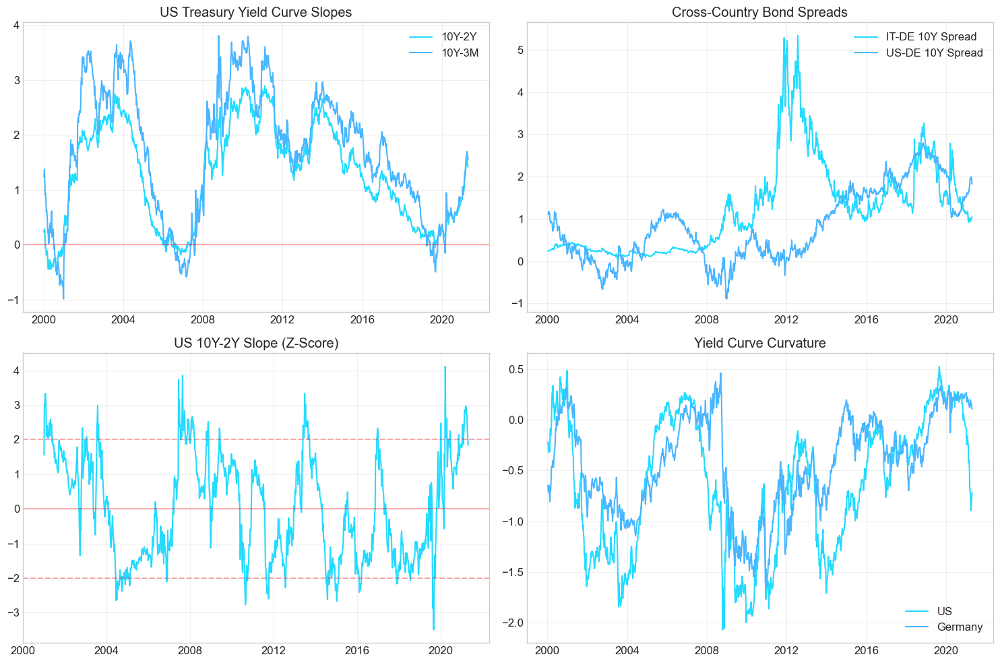

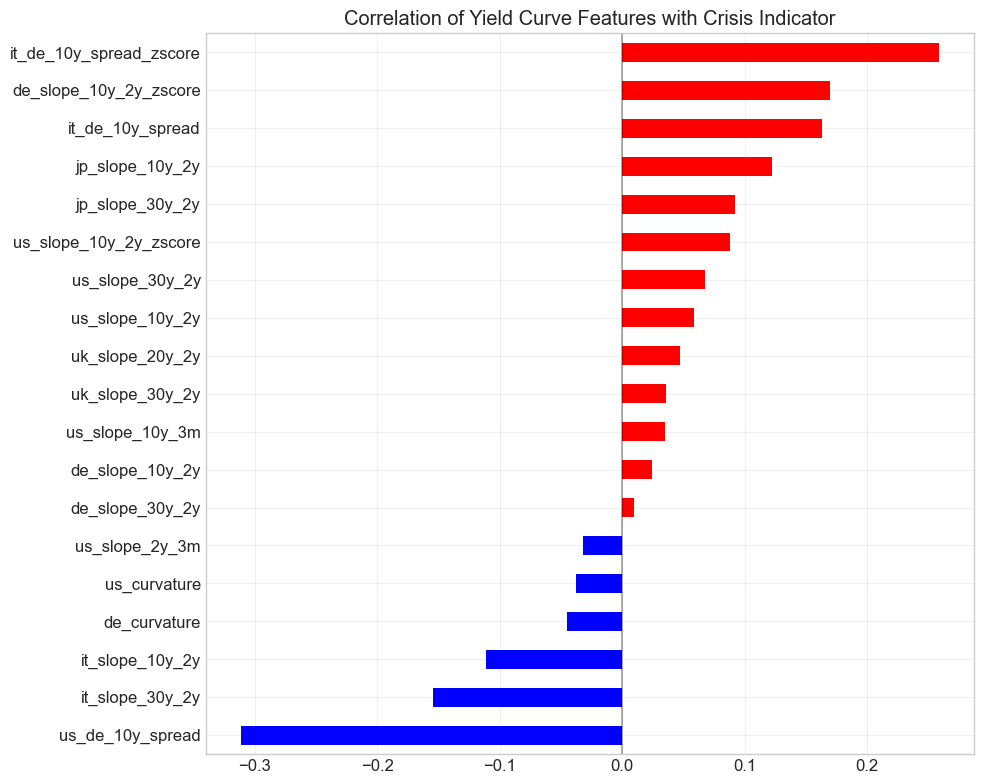

In [21]:
# 1. Yield Curve Features
# The slope of the yield curve is a powerful predictor of economic conditions

def create_yield_curve_features(df):
    """Create yield curve features for various markets"""
    # Create a copy of the dataframe to add features
    feature_df = df.copy()
    
    # US Treasury yield curve
    feature_df['us_slope_10y_2y'] = df['GT10'] - df['USGG2YR']
    feature_df['us_slope_30y_2y'] = df['USGG30YR'] - df['USGG2YR']
    feature_df['us_slope_10y_3m'] = df['GT10'] - df['USGG3M']
    feature_df['us_slope_2y_3m'] = df['USGG2YR'] - df['USGG3M']
    
    # German yield curve
    feature_df['de_slope_10y_2y'] = df['GTDEM10Y'] - df['GTDEM2Y']
    feature_df['de_slope_30y_2y'] = df['GTDEM30Y'] - df['GTDEM2Y']
    
    # Italian yield curve
    feature_df['it_slope_10y_2y'] = df['GTITL10YR'] - df['GTITL2YR']
    feature_df['it_slope_30y_2y'] = df['GTITL30YR'] - df['GTITL2YR']
    
    # UK yield curve
    feature_df['uk_slope_20y_2y'] = df['GTGBP20Y'] - df['GTGBP2Y']
    feature_df['uk_slope_30y_2y'] = df['GTGBP30Y'] - df['GTGBP2Y']
    
    # Japanese yield curve
    feature_df['jp_slope_10y_2y'] = df['GTJPY10YR'] - df['GTJPY2YR']
    feature_df['jp_slope_30y_2y'] = df['GTJPY30YR'] - df['GTJPY2YR']
    
    # Cross-country spreads
    feature_df['us_de_10y_spread'] = df['GT10'] - df['GTDEM10Y']
    feature_df['it_de_10y_spread'] = df['GTITL10YR'] - df['GTDEM10Y']  # Italian-German spread (a key risk indicator)
    
    # Yield curve curvature (convexity)
    feature_df['us_curvature'] = df['USGG30YR'] - 2*df['GT10'] + df['USGG2YR']
    feature_df['de_curvature'] = df['GTDEM30Y'] - 2*df['GTDEM10Y'] + df['GTDEM2Y']
    
    # Normalized curves (relative to their historical average)
    # This helps identify unusual curve shapes
    rolling_window = 52  # 1 year
    
    for curve in ['us_slope_10y_2y', 'de_slope_10y_2y', 'it_de_10y_spread']:
        mean = feature_df[curve].rolling(window=rolling_window).mean()
        std = feature_df[curve].rolling(window=rolling_window).std()
        feature_df[f'{curve}_zscore'] = (feature_df[curve] - mean) / std
    
    return feature_df

# Create yield curve features
df_features = create_yield_curve_features(df_ts)

# Plot key yield curve features
plt.figure(figsize=(15, 10))

# US Treasury Slope
plt.subplot(2, 2, 1)
plt.plot(df_features.index, df_features['us_slope_10y_2y'], label='10Y-2Y')
plt.plot(df_features.index, df_features['us_slope_10y_3m'], label='10Y-3M')
plt.title('US Treasury Yield Curve Slopes')
plt.axhline(y=0, color='r', linestyle='-', alpha=0.3)
plt.grid(True, alpha=0.3)
plt.legend()

# Cross-country spreads
plt.subplot(2, 2, 2)
plt.plot(df_features.index, df_features['it_de_10y_spread'], label='IT-DE 10Y Spread')
plt.plot(df_features.index, df_features['us_de_10y_spread'], label='US-DE 10Y Spread')
plt.title('Cross-Country Bond Spreads')
plt.grid(True, alpha=0.3)
plt.legend()

# Normalized US curve
plt.subplot(2, 2, 3)
plt.plot(df_features.index, df_features['us_slope_10y_2y_zscore'])
plt.title('US 10Y-2Y Slope (Z-Score)')
plt.axhline(y=0, color='r', linestyle='-', alpha=0.3)
plt.axhline(y=2, color='r', linestyle='--', alpha=0.3)
plt.axhline(y=-2, color='r', linestyle='--', alpha=0.3)
plt.grid(True, alpha=0.3)

# Yield curve curvature
plt.subplot(2, 2, 4)
plt.plot(df_features.index, df_features['us_curvature'], label='US')
plt.plot(df_features.index, df_features['de_curvature'], label='Germany')
plt.title('Yield Curve Curvature')
plt.grid(True, alpha=0.3)
plt.legend()

plt.tight_layout()
plt.show()

# Show the correlation of yield curve features with the target
yield_features = [col for col in df_features.columns if any(x in col for x in ['slope', 'spread', 'curvature', 'zscore'])]
correlations = df_features[yield_features + ['Y']].corr()['Y'].sort_values()

plt.figure(figsize=(10, 8))
correlations.drop('Y').plot(kind='barh', color=correlations.drop('Y').map(lambda x: 'red' if x > 0 else 'blue'))
plt.title('Correlation of Yield Curve Features with Crisis Indicator')
plt.axvline(x=0, color='black', linestyle='-', alpha=0.3)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

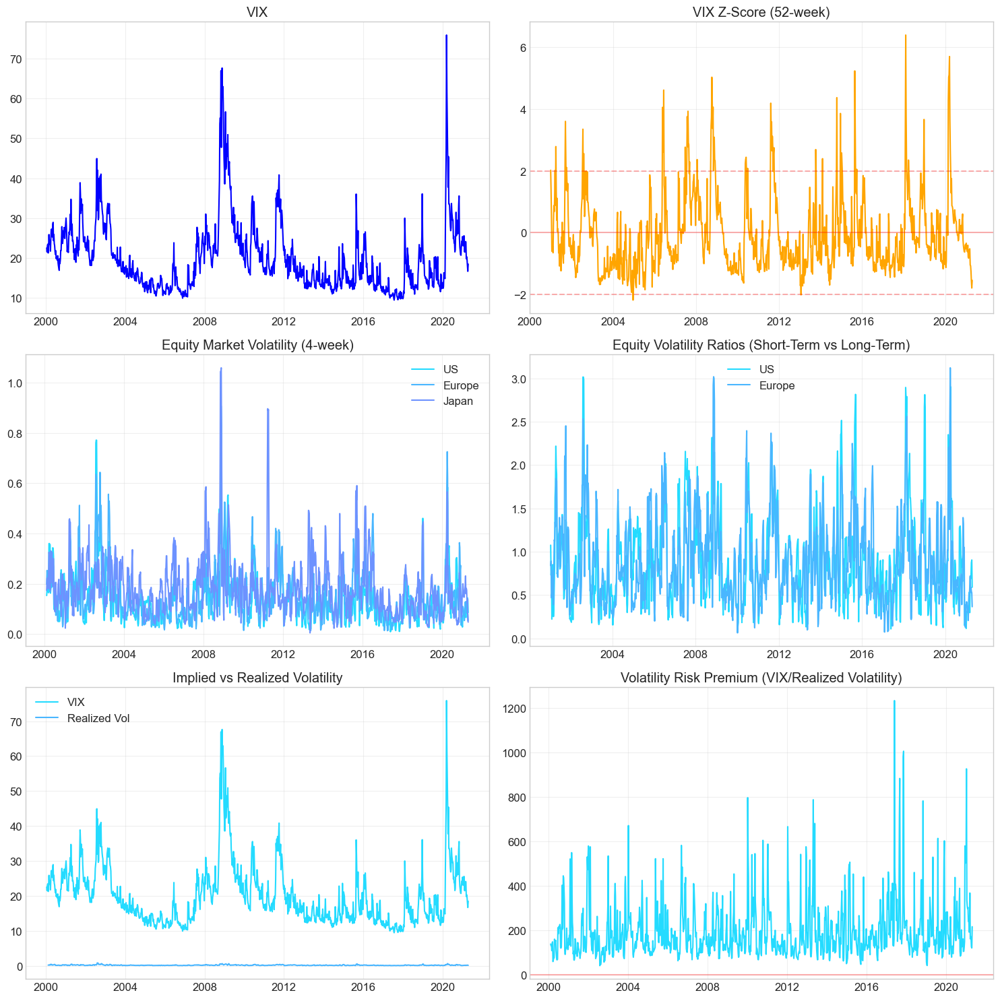

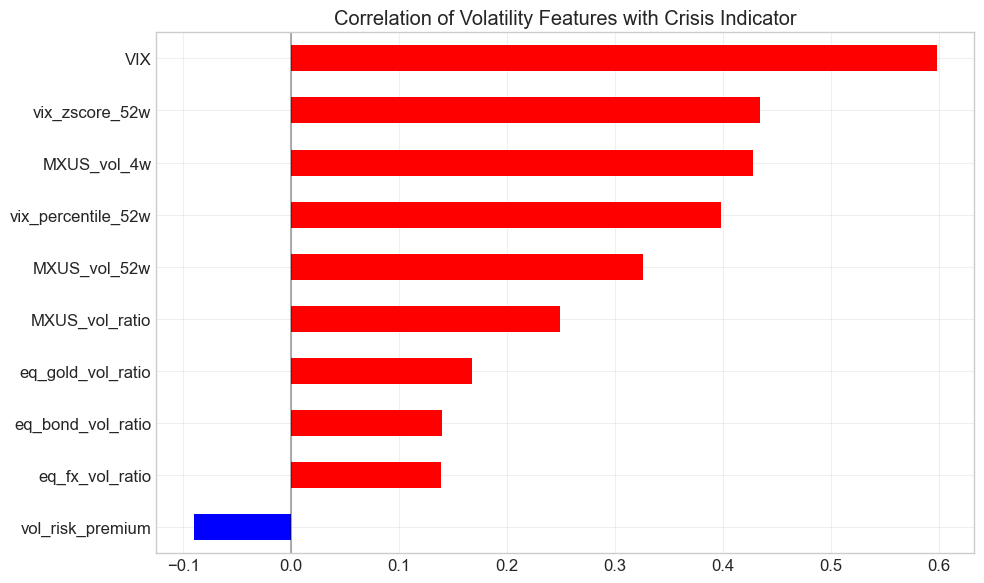

In [22]:
# 2. Volatility Measures
# Volatility is a key indicator of market stress and uncertainty

def create_volatility_features(df):
    """Create volatility-related features"""
    # Create a copy of the dataframe to add features
    feature_df = df.copy()
    
    # Key volatility indicators
    volatility_indicators = ['VIX', 'MXUS', 'MXEU', 'MXJP', 'MXBR', 'MXRU', 'MXIN', 'MXCN', 
                            'GT10', 'DXY', 'XAUBGNL', 'Cl1']
    
    # Rolling windows for volatility calculation
    windows = [4, 12, 26, 52]  # 1 month, 3 months, 6 months, 1 year
    
    # Calculate rolling volatility for each indicator and window
    for indicator in volatility_indicators:
        for window in windows:
            feature_df[f'{indicator}_vol_{window}w'] = df[indicator].pct_change().rolling(window=window).std() * np.sqrt(52)  # Annualized
    
    # Calculate volatility ratios (short-term vs long-term)
    for indicator in volatility_indicators:
        if indicator != 'VIX':  # Skip VIX as it's already a volatility measure
            feature_df[f'{indicator}_vol_ratio'] = feature_df[f'{indicator}_vol_4w'] / feature_df[f'{indicator}_vol_52w']
    
    # VIX-related features
    feature_df['vix_zscore_52w'] = (df['VIX'] - df['VIX'].rolling(window=52).mean()) / df['VIX'].rolling(window=52).std()
    feature_df['vix_percentile_52w'] = df['VIX'].rolling(window=52).apply(lambda x: pd.Series(x).rank(pct=True).iloc[-1])
    
    # Realized volatility of equity index (MXUS)
    feature_df['realized_vol_4w'] = df['MXUS'].pct_change().rolling(window=4).std() * np.sqrt(52)
    
    # VIX vs realized volatility ratio (volatility risk premium)
    feature_df['vol_risk_premium'] = df['VIX'] / feature_df['realized_vol_4w']
    
    # Cross-asset volatility relationships
    feature_df['eq_bond_vol_ratio'] = feature_df['MXUS_vol_4w'] / feature_df['GT10_vol_4w']
    feature_df['eq_fx_vol_ratio'] = feature_df['MXUS_vol_4w'] / feature_df['DXY_vol_4w']
    feature_df['eq_gold_vol_ratio'] = feature_df['MXUS_vol_4w'] / feature_df['XAUBGNL_vol_4w']
    
    return feature_df

# Create volatility features
df_features = create_volatility_features(df_features)

# Plot key volatility features
plt.figure(figsize=(15, 15))

# VIX and its Z-score
plt.subplot(3, 2, 1)
plt.plot(df_features.index, df_features['VIX'], color='blue')
plt.title('VIX')
plt.grid(True, alpha=0.3)

plt.subplot(3, 2, 2)
plt.plot(df_features.index, df_features['vix_zscore_52w'], color='orange')
plt.title('VIX Z-Score (52-week)')
plt.axhline(y=0, color='r', linestyle='-', alpha=0.3)
plt.axhline(y=2, color='r', linestyle='--', alpha=0.3)
plt.axhline(y=-2, color='r', linestyle='--', alpha=0.3)
plt.grid(True, alpha=0.3)

# Volatility of equity markets
plt.subplot(3, 2, 3)
plt.plot(df_features.index, df_features['MXUS_vol_4w'], label='US')
plt.plot(df_features.index, df_features['MXEU_vol_4w'], label='Europe')
plt.plot(df_features.index, df_features['MXJP_vol_4w'], label='Japan')
plt.title('Equity Market Volatility (4-week)')
plt.grid(True, alpha=0.3)
plt.legend()

# Volatility ratios
plt.subplot(3, 2, 4)
plt.plot(df_features.index, df_features['MXUS_vol_ratio'], label='US')
plt.plot(df_features.index, df_features['MXEU_vol_ratio'], label='Europe')
plt.title('Equity Volatility Ratios (Short-Term vs Long-Term)')
plt.grid(True, alpha=0.3)
plt.legend()

# VIX vs Realized volatility
plt.subplot(3, 2, 5)
plt.plot(df_features.index, df_features['VIX'], label='VIX')
plt.plot(df_features.index, df_features['realized_vol_4w'], label='Realized Vol')
plt.title('Implied vs Realized Volatility')
plt.grid(True, alpha=0.3)
plt.legend()

# Volatility risk premium
plt.subplot(3, 2, 6)
plt.plot(df_features.index, df_features['vol_risk_premium'])
plt.title('Volatility Risk Premium (VIX/Realized Volatility)')
plt.axhline(y=1, color='r', linestyle='-', alpha=0.3)
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Show the correlation of volatility features with the target
vol_features = [col for col in df_features.columns if any(x in col for x in ['vol_', 'vix_', 'risk_premium'])]
# Pick a subset to avoid too many features in the plot
vol_features_subset = ['VIX', 'vix_zscore_52w', 'vix_percentile_52w', 'MXUS_vol_4w', 'MXUS_vol_52w', 
                      'MXUS_vol_ratio', 'vol_risk_premium', 'eq_bond_vol_ratio', 'eq_fx_vol_ratio', 'eq_gold_vol_ratio']
correlations = df_features[vol_features_subset + ['Y']].corr()['Y'].sort_values()

plt.figure(figsize=(10, 6))
correlations.drop('Y').plot(kind='barh', color=correlations.drop('Y').map(lambda x: 'red' if x > 0 else 'blue'))
plt.title('Correlation of Volatility Features with Crisis Indicator')
plt.axvline(x=0, color='black', linestyle='-', alpha=0.3)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

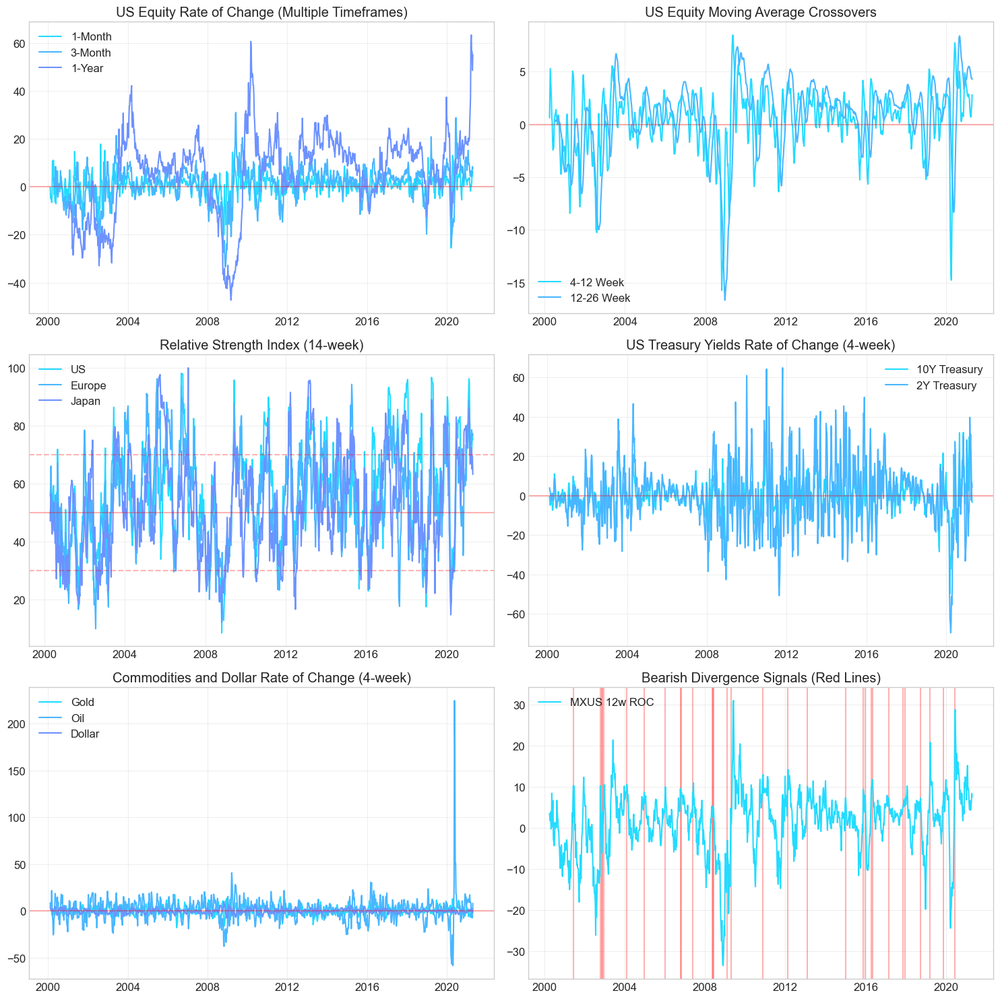

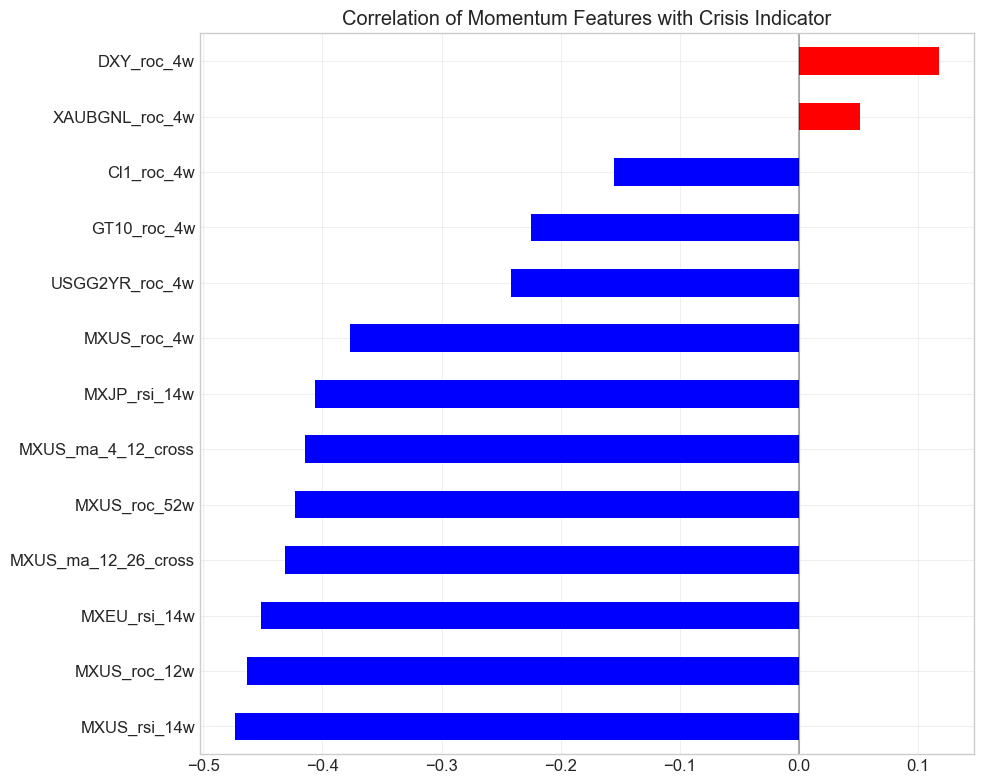

In [23]:
# 3. Momentum Indicators
# Momentum often shifts significantly before and during crises

def create_momentum_features(df):
    """Create momentum-related features"""
    # Create a copy of the dataframe to add features
    feature_df = df.copy()
    
    # Key indicators to track momentum
    momentum_indicators = ['MXUS', 'MXEU', 'MXJP', 'MXBR', 'MXRU', 'MXIN', 'MXCN', 
                          'GT10', 'USGG2YR', 'USGG30YR', 'DXY', 'XAUBGNL', 'Cl1']
    
    # Time frames for momentum calculation
    timeframes = [1, 4, 12, 26, 52]  # 1 week, 1 month, 3 months, 6 months, 1 year
    
    # Calculate rate of change for each indicator and timeframe
    for indicator in momentum_indicators:
        for timeframe in timeframes:
            feature_df[f'{indicator}_roc_{timeframe}w'] = df[indicator].pct_change(periods=timeframe) * 100
    
    # Calculate moving average crossovers (shorter MA minus longer MA)
    ma_pairs = [(4, 12), (12, 26), (26, 52)]  # Fast/slow MA pairs
    
    for indicator in momentum_indicators:
        for fast, slow in ma_pairs:
            feature_df[f'{indicator}_ma_{fast}_{slow}_cross'] = (
                df[indicator].rolling(window=fast).mean() - 
                df[indicator].rolling(window=slow).mean()
            ) / df[indicator].rolling(window=slow).mean() * 100
    
    # Calculate RSI (Relative Strength Index)
    def calculate_rsi(series, period=14):
        # Calculate price changes
        delta = series.diff()
        
        # Separate gains and losses
        gains = delta.copy()
        losses = delta.copy()
        gains[gains < 0] = 0
        losses[losses > 0] = 0
        losses = abs(losses)
        
        # Calculate average gains and losses
        avg_gain = gains.rolling(window=period).mean()
        avg_loss = losses.rolling(window=period).mean()
        
        # Calculate RS and RSI
        rs = avg_gain / avg_loss
        rsi = 100 - (100 / (1 + rs))
        
        return rsi
    
    # Calculate RSI for equity indices
    for indicator in ['MXUS', 'MXEU', 'MXJP', 'MXBR', 'MXRU', 'MXIN', 'MXCN']:
        feature_df[f'{indicator}_rsi_14w'] = calculate_rsi(df[indicator], period=14)
    
    # Create momentum divergence indicators (price vs RSI divergence)
    for indicator in ['MXUS', 'MXEU', 'MXJP']:
        # Calculate if price making higher highs but RSI making lower highs (bearish divergence)
        # We'll use a simple approach comparing current vs previous peaks
        price_roc = feature_df[f'{indicator}_roc_12w']
        rsi = feature_df[f'{indicator}_rsi_14w']
        
        # Get peaks in price momentum (top 10% of values in a rolling window)
        price_peaks = price_roc.rolling(window=26).apply(
            lambda x: 1 if x.iloc[-1] > np.percentile(x, 90) else 0)
        
        # Compare RSI at current peak vs previous peak
        feature_df[f'{indicator}_bearish_divergence'] = 0
        
        peak_indices = price_peaks[price_peaks == 1].index
        for i in range(1, len(peak_indices)):
            curr_idx = peak_indices[i]
            prev_idx = peak_indices[i-1]
            
            if (price_roc.loc[curr_idx] > price_roc.loc[prev_idx]) and (rsi.loc[curr_idx] < rsi.loc[prev_idx]):
                feature_df.loc[curr_idx, f'{indicator}_bearish_divergence'] = 1
    
    return feature_df

# Create momentum features
df_features = create_momentum_features(df_features)

# Plot key momentum features
plt.figure(figsize=(15, 15))

# Rate of change across timeframes for US equities
plt.subplot(3, 2, 1)
plt.plot(df_features.index, df_features['MXUS_roc_4w'], label='1-Month')
plt.plot(df_features.index, df_features['MXUS_roc_12w'], label='3-Month')
plt.plot(df_features.index, df_features['MXUS_roc_52w'], label='1-Year')
plt.title('US Equity Rate of Change (Multiple Timeframes)')
plt.axhline(y=0, color='r', linestyle='-', alpha=0.3)
plt.grid(True, alpha=0.3)
plt.legend()

# Moving average crossovers
plt.subplot(3, 2, 2)
plt.plot(df_features.index, df_features['MXUS_ma_4_12_cross'], label='4-12 Week')
plt.plot(df_features.index, df_features['MXUS_ma_12_26_cross'], label='12-26 Week')
plt.title('US Equity Moving Average Crossovers')
plt.axhline(y=0, color='r', linestyle='-', alpha=0.3)
plt.grid(True, alpha=0.3)
plt.legend()

# RSI across equity markets
plt.subplot(3, 2, 3)
plt.plot(df_features.index, df_features['MXUS_rsi_14w'], label='US')
plt.plot(df_features.index, df_features['MXEU_rsi_14w'], label='Europe')
plt.plot(df_features.index, df_features['MXJP_rsi_14w'], label='Japan')
plt.title('Relative Strength Index (14-week)')
plt.axhline(y=70, color='r', linestyle='--', alpha=0.3)
plt.axhline(y=30, color='r', linestyle='--', alpha=0.3)
plt.axhline(y=50, color='r', linestyle='-', alpha=0.3)
plt.grid(True, alpha=0.3)
plt.legend()

# Rate of change for bonds
plt.subplot(3, 2, 4)
plt.plot(df_features.index, df_features['GT10_roc_4w'], label='10Y Treasury')
plt.plot(df_features.index, df_features['USGG2YR_roc_4w'], label='2Y Treasury')
plt.title('US Treasury Yields Rate of Change (4-week)')
plt.axhline(y=0, color='r', linestyle='-', alpha=0.3)
plt.grid(True, alpha=0.3)
plt.legend()

# Rate of change for commodities and dollar
plt.subplot(3, 2, 5)
plt.plot(df_features.index, df_features['XAUBGNL_roc_4w'], label='Gold')
plt.plot(df_features.index, df_features['Cl1_roc_4w'], label='Oil')
plt.plot(df_features.index, df_features['DXY_roc_4w'], label='Dollar')
plt.title('Commodities and Dollar Rate of Change (4-week)')
plt.axhline(y=0, color='r', linestyle='-', alpha=0.3)
plt.grid(True, alpha=0.3)
plt.legend()

# Bearish divergence
plt.subplot(3, 2, 6)
for idx in df_features[df_features['MXUS_bearish_divergence'] == 1].index:
    plt.axvline(x=idx, color='r', alpha=0.3)
plt.plot(df_features.index, df_features['MXUS_roc_12w'], label='MXUS 12w ROC')
plt.title('Bearish Divergence Signals (Red Lines)')
plt.grid(True, alpha=0.3)
plt.legend()

plt.tight_layout()
plt.show()

# Show the correlation of momentum features with the target
momentum_features = ['MXUS_roc_4w', 'MXUS_roc_12w', 'MXUS_roc_52w', 
                     'MXUS_ma_4_12_cross', 'MXUS_ma_12_26_cross', 
                     'MXUS_rsi_14w', 'MXEU_rsi_14w', 'MXJP_rsi_14w',
                     'GT10_roc_4w', 'USGG2YR_roc_4w',
                     'XAUBGNL_roc_4w', 'Cl1_roc_4w', 'DXY_roc_4w']

correlations = df_features[momentum_features + ['Y']].corr()['Y'].sort_values()

plt.figure(figsize=(10, 8))
correlations.drop('Y').plot(kind='barh', color=correlations.drop('Y').map(lambda x: 'red' if x > 0 else 'blue'))
plt.title('Correlation of Momentum Features with Crisis Indicator')
plt.axvline(x=0, color='black', linestyle='-', alpha=0.3)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

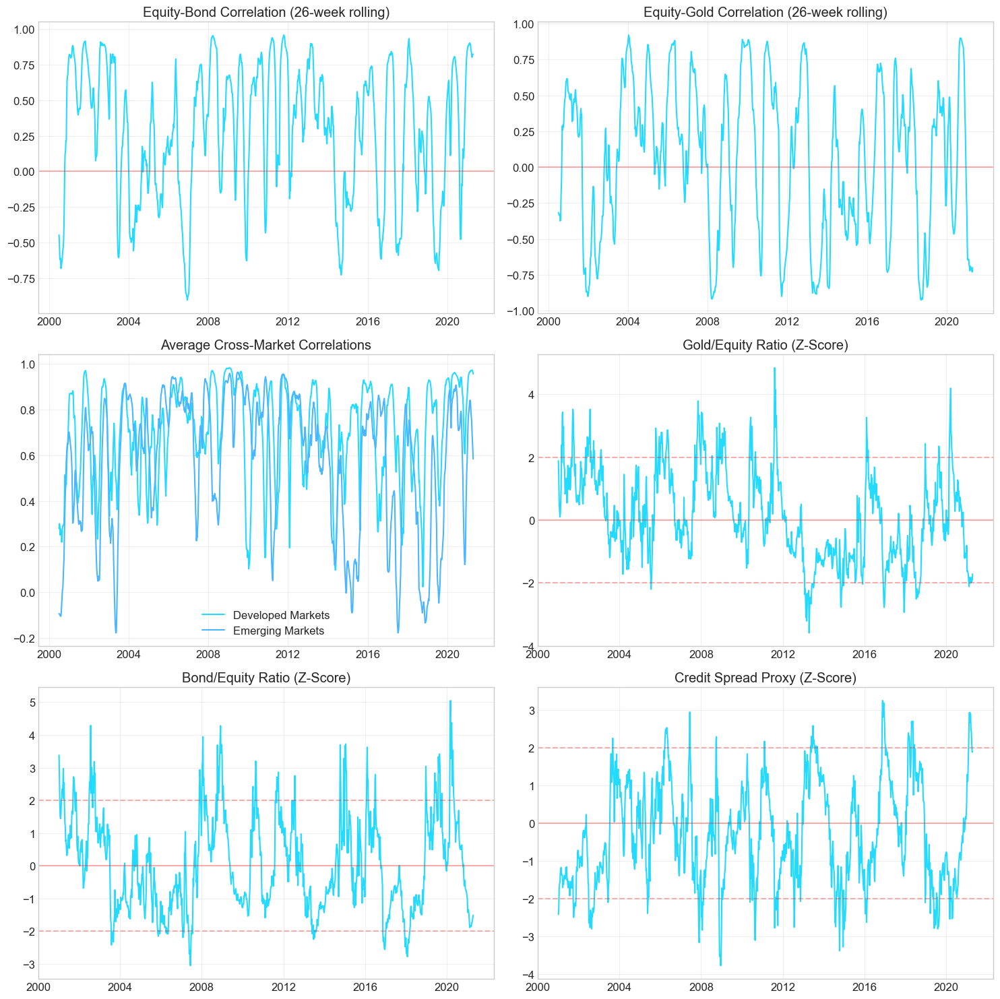

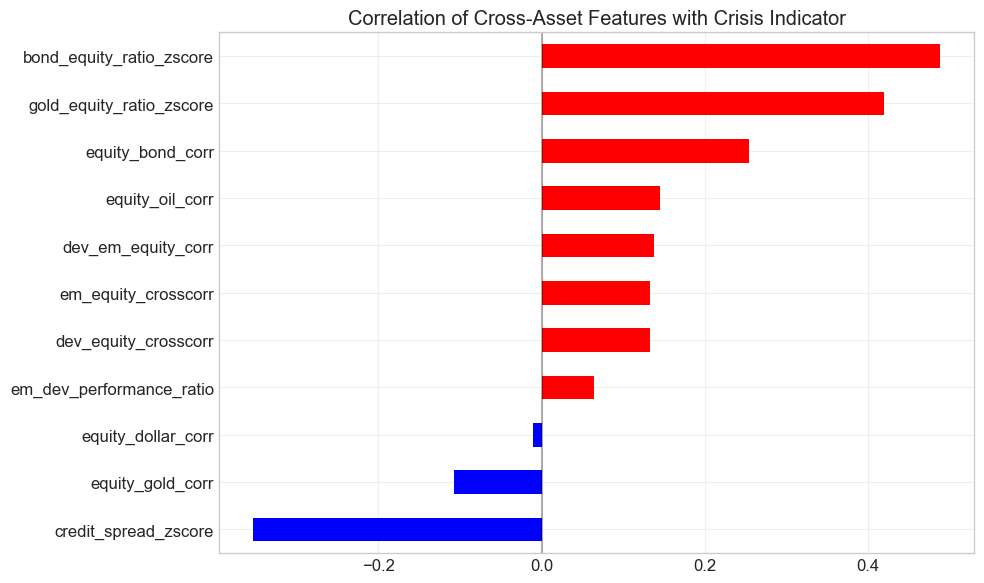

In [24]:
# 4. Cross-Asset Relationships
# Correlations and relationships between asset classes often shift during crises

def create_crossasset_features(df):
    """Create features based on cross-asset relationships"""
    # Create a copy of the dataframe to add features
    feature_df = df.copy()
    
    # Calculate rolling correlations
    window = 26  # 6-month window
    
    # Equity-Bond correlation (a key regime indicator)
    feature_df['equity_bond_corr'] = df['MXUS'].rolling(window=window).corr(df['GT10'])
    
    # Equity-Gold correlation (often negative during crises)
    feature_df['equity_gold_corr'] = df['MXUS'].rolling(window=window).corr(df['XAUBGNL'])
    
    # Equity-Dollar correlation
    feature_df['equity_dollar_corr'] = df['MXUS'].rolling(window=window).corr(df['DXY'])
    
    # Equity-Oil correlation
    feature_df['equity_oil_corr'] = df['MXUS'].rolling(window=window).corr(df['Cl1'])
    
    # Developed vs. Emerging market correlations
    feature_df['dev_em_equity_corr'] = df['MXUS'].rolling(window=window).corr(
        (df['MXBR'] + df['MXRU'] + df['MXIN'] + df['MXCN'])/4)  # Simple average of EM indices
    
    # Developed markets cross-correlation (US, Europe, Japan)
    def avg_pairwise_corr(df, cols, window):
        """Calculate average pairwise correlation among a set of columns"""
        pairs = [(a, b) for a in cols for b in cols if a < b]
        corrs = [df[a].rolling(window=window).corr(df[b]) for a, b in pairs]
        return sum(corrs) / len(corrs)
    
    feature_df['dev_equity_crosscorr'] = avg_pairwise_corr(df, ['MXUS', 'MXEU', 'MXJP'], window)
    feature_df['em_equity_crosscorr'] = avg_pairwise_corr(df, ['MXBR', 'MXRU', 'MXIN', 'MXCN'], window)
    
    # Financial ratios
    # Gold/S&P ratio (tends to rise during crises)
    feature_df['gold_equity_ratio'] = df['XAUBGNL'] / df['MXUS']
    
    # Create Z-score of the ratio
    feature_df['gold_equity_ratio_zscore'] = (
        feature_df['gold_equity_ratio'] - 
        feature_df['gold_equity_ratio'].rolling(window=52).mean()
    ) / feature_df['gold_equity_ratio'].rolling(window=52).std()
    
    # Bond/Equity ratio (tends to rise during flight-to-quality)
    # We'll use an inverse yield as a simple proxy for bond price
    feature_df['bond_equity_ratio'] = (1/df['GT10']) / df['MXUS']
    feature_df['bond_equity_ratio_zscore'] = (
        feature_df['bond_equity_ratio'] - 
        feature_df['bond_equity_ratio'].rolling(window=52).mean()
    ) / feature_df['bond_equity_ratio'].rolling(window=52).std()
    
    # Credit spreads - difference between high yield and investment grade
    # Here we're using the high yield index vs a standard bond index as a proxy
    feature_df['credit_spread_proxy'] = df['LF98TRUU'] - df['LUACTRUU']
    feature_df['credit_spread_zscore'] = (
        feature_df['credit_spread_proxy'] - 
        feature_df['credit_spread_proxy'].rolling(window=52).mean()
    ) / feature_df['credit_spread_proxy'].rolling(window=52).std()
    
    # Emerging market vs. Developed market performance ratio
    feature_df['em_dev_performance_ratio'] = (
        (df['MXBR'] + df['MXRU'] + df['MXIN'] + df['MXCN'])/4
    ) / df['MXUS']
    
    return feature_df

# Create cross-asset relationship features
df_features = create_crossasset_features(df_features)

# Plot key cross-asset relationship features
plt.figure(figsize=(15, 15))

# Equity-Bond correlation
plt.subplot(3, 2, 1)
plt.plot(df_features.index, df_features['equity_bond_corr'])
plt.title('Equity-Bond Correlation (26-week rolling)')
plt.axhline(y=0, color='r', linestyle='-', alpha=0.3)
plt.grid(True, alpha=0.3)

# Equity-Gold correlation
plt.subplot(3, 2, 2)
plt.plot(df_features.index, df_features['equity_gold_corr'])
plt.title('Equity-Gold Correlation (26-week rolling)')
plt.axhline(y=0, color='r', linestyle='-', alpha=0.3)
plt.grid(True, alpha=0.3)

# Cross-market correlations
plt.subplot(3, 2, 3)
plt.plot(df_features.index, df_features['dev_equity_crosscorr'], label='Developed Markets')
plt.plot(df_features.index, df_features['em_equity_crosscorr'], label='Emerging Markets')
plt.title('Average Cross-Market Correlations')
plt.grid(True, alpha=0.3)
plt.legend()

# Gold/Equity ratio
plt.subplot(3, 2, 4)
plt.plot(df_features.index, df_features['gold_equity_ratio_zscore'])
plt.title('Gold/Equity Ratio (Z-Score)')
plt.axhline(y=0, color='r', linestyle='-', alpha=0.3)
plt.axhline(y=2, color='r', linestyle='--', alpha=0.3)
plt.axhline(y=-2, color='r', linestyle='--', alpha=0.3)
plt.grid(True, alpha=0.3)

# Bond/Equity ratio
plt.subplot(3, 2, 5)
plt.plot(df_features.index, df_features['bond_equity_ratio_zscore'])
plt.title('Bond/Equity Ratio (Z-Score)')
plt.axhline(y=0, color='r', linestyle='-', alpha=0.3)
plt.axhline(y=2, color='r', linestyle='--', alpha=0.3)
plt.axhline(y=-2, color='r', linestyle='--', alpha=0.3)
plt.grid(True, alpha=0.3)

# Credit spread proxy
plt.subplot(3, 2, 6)
plt.plot(df_features.index, df_features['credit_spread_zscore'])
plt.title('Credit Spread Proxy (Z-Score)')
plt.axhline(y=0, color='r', linestyle='-', alpha=0.3)
plt.axhline(y=2, color='r', linestyle='--', alpha=0.3)
plt.axhline(y=-2, color='r', linestyle='--', alpha=0.3)
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Show the correlation of cross-asset relationship features with the target
crossasset_features = [
    'equity_bond_corr', 'equity_gold_corr', 'equity_dollar_corr', 'equity_oil_corr',
    'dev_em_equity_corr', 'dev_equity_crosscorr', 'em_equity_crosscorr',
    'gold_equity_ratio_zscore', 'bond_equity_ratio_zscore', 'credit_spread_zscore',
    'em_dev_performance_ratio'
]

correlations = df_features[crossasset_features + ['Y']].corr()['Y'].sort_values()

plt.figure(figsize=(10, 6))
correlations.drop('Y').plot(kind='barh', color=correlations.drop('Y').map(lambda x: 'red' if x > 0 else 'blue'))
plt.title('Correlation of Cross-Asset Features with Crisis Indicator')
plt.axvline(x=0, color='black', linestyle='-', alpha=0.3)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

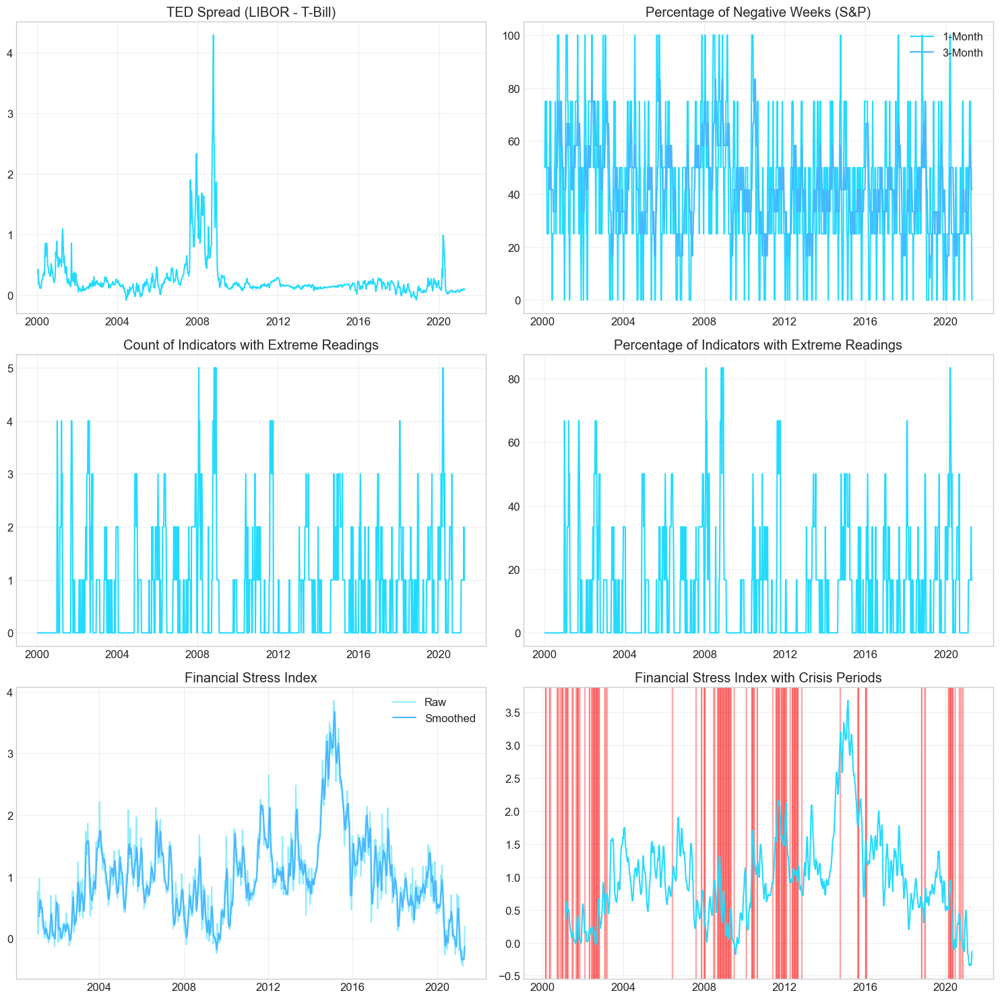

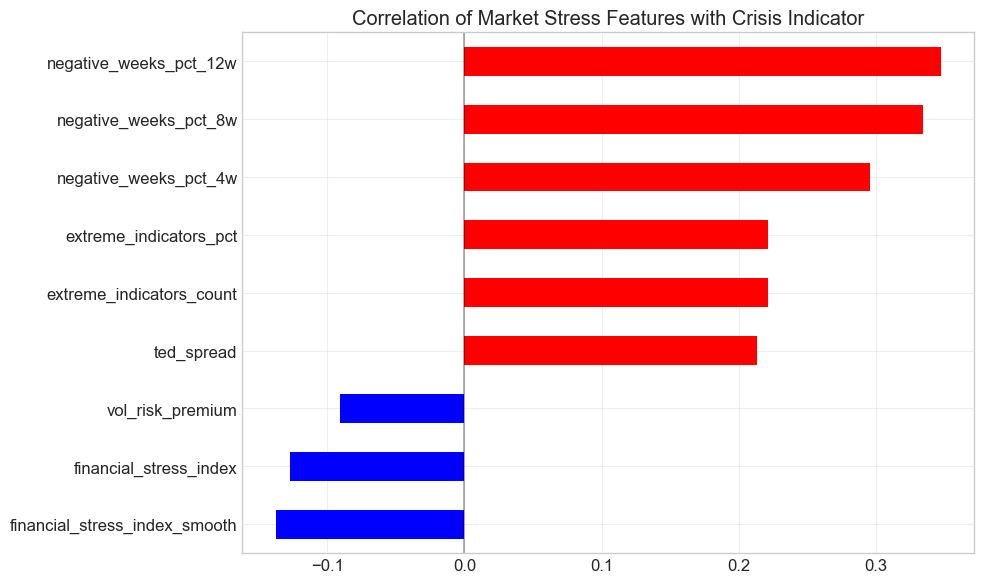

Original number of features: 43
Newly engineered features: 223
Total number of features: 266


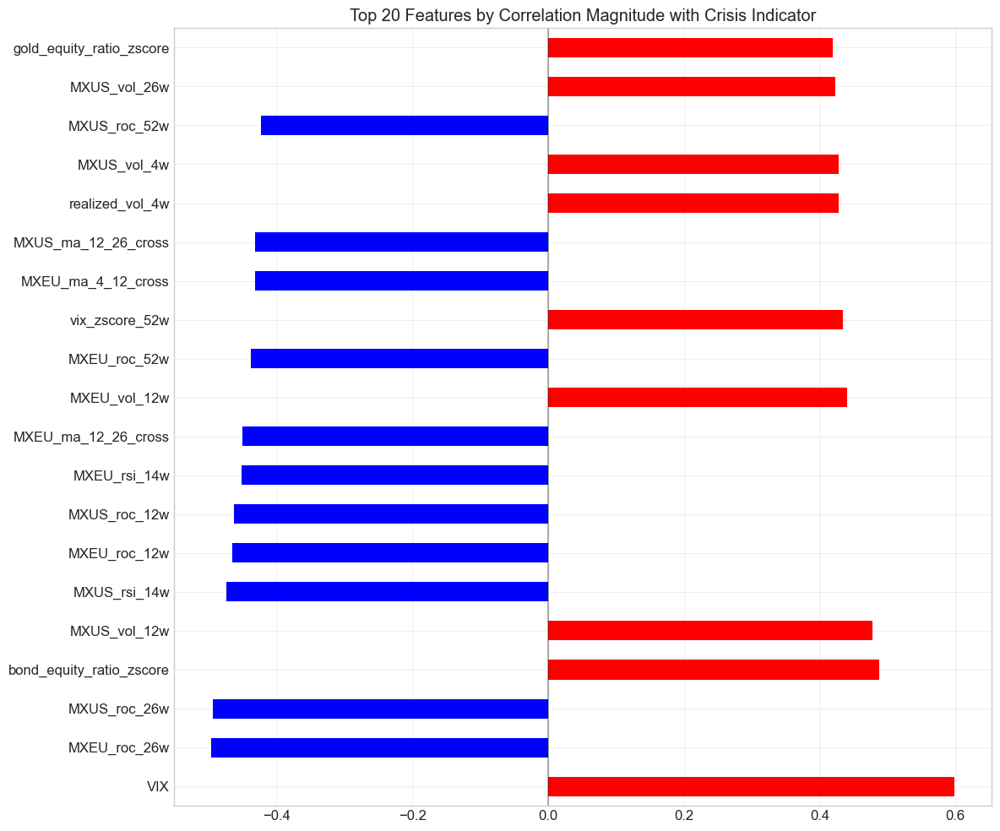

In [25]:
# 5. Market Stress Indicators
# These indicators capture financial conditions and market stress

def create_market_stress_features(df):
    """Create features related to market stress and financial conditions"""
    # Create a copy of the dataframe to add features
    feature_df = df.copy()
    
    # TED spread - difference between LIBOR and Treasury Bill rate (proxy for credit risk)
    feature_df['ted_spread'] = df['US0001M'] - df['USGG3M']
    
    # VIX/Realized Vol ratio (as calculated earlier)
    # High values indicate market is pricing in significant future volatility
    
    # Count of negative returns in recent periods
    windows = [4, 8, 12]
    for window in windows:
        feature_df[f'negative_weeks_count_{window}w'] = (
            df['MXUS'].pct_change().rolling(window=window).apply(lambda x: sum(x < 0))
        )
        
        # Calculate as a percentage
        feature_df[f'negative_weeks_pct_{window}w'] = feature_df[f'negative_weeks_count_{window}w'] / window * 100
    
    # Count of indicators with extreme readings
    # Define extreme as +/- 2 standard deviations from 1-year mean
    indicators_to_check = ['VIX', 'MXUS', 'MXEU', 'GT10', 'DXY', 'XAUBGNL']
    
    # Create a new column for the count
    feature_df['extreme_indicators_count'] = 0
    
    for indicator in indicators_to_check:
        # Calculate rolling mean and std
        rolling_mean = df[indicator].rolling(window=52).mean()
        rolling_std = df[indicator].rolling(window=52).std()
        
        # Calculate Z-score
        z_score = (df[indicator] - rolling_mean) / rolling_std
        
        # Count as extreme if |Z-score| > 2
        extreme = (z_score.abs() > 2).astype(int)
        
        # Add to count
        feature_df['extreme_indicators_count'] += extreme
    
    # Calculate as a percentage
    feature_df['extreme_indicators_pct'] = feature_df['extreme_indicators_count'] / len(indicators_to_check) * 100
    
    # Financial stress index (simple version)
    # We'll create a composite of several stress indicators
    stress_components = [
        feature_df['ted_spread'] / feature_df['ted_spread'].rolling(window=52).std(),  # TED spread
        feature_df['vol_risk_premium'] / feature_df['vol_risk_premium'].rolling(window=52).std(),  # Volatility risk premium
        feature_df['extreme_indicators_count'] / len(indicators_to_check),  # Extreme indicators
        feature_df['us_slope_10y_2y_zscore'] * -1,  # Yield curve slope (inverted)
        feature_df['equity_bond_corr'] * -1  # Equity-bond correlation (inverted)
    ]
    
    # Simple average of standardized components
    feature_df['financial_stress_index'] = sum(stress_components) / len(stress_components)
    
    # Smooth the index with a 4-week moving average
    feature_df['financial_stress_index_smooth'] = feature_df['financial_stress_index'].rolling(window=4).mean()
    
    return feature_df

# Create market stress features
df_features = create_market_stress_features(df_features)

# Plot key market stress features
plt.figure(figsize=(15, 15))

# TED spread
plt.subplot(3, 2, 1)
plt.plot(df_features.index, df_features['ted_spread'])
plt.title('TED Spread (LIBOR - T-Bill)')
plt.grid(True, alpha=0.3)

# Negative weeks
plt.subplot(3, 2, 2)
plt.plot(df_features.index, df_features['negative_weeks_pct_4w'], label='1-Month')
plt.plot(df_features.index, df_features['negative_weeks_pct_12w'], label='3-Month')
plt.title('Percentage of Negative Weeks (S&P)')
plt.grid(True, alpha=0.3)
plt.legend()

# Extreme indicators count
plt.subplot(3, 2, 3)
plt.plot(df_features.index, df_features['extreme_indicators_count'])
plt.title('Count of Indicators with Extreme Readings')
plt.grid(True, alpha=0.3)

# Extreme indicators percentage
plt.subplot(3, 2, 4)
plt.plot(df_features.index, df_features['extreme_indicators_pct'])
plt.title('Percentage of Indicators with Extreme Readings')
plt.grid(True, alpha=0.3)

# Financial stress index
plt.subplot(3, 2, 5)
plt.plot(df_features.index, df_features['financial_stress_index'], alpha=0.5, label='Raw')
plt.plot(df_features.index, df_features['financial_stress_index_smooth'], label='Smoothed')
plt.title('Financial Stress Index')
plt.grid(True, alpha=0.3)
plt.legend()

# Crisis periods with stress index
plt.subplot(3, 2, 6)
plt.plot(df_features.index, df_features['financial_stress_index_smooth'])
plt.title('Financial Stress Index with Crisis Periods')

# Highlight crisis periods
for i, row in df_features.reset_index().iterrows():
    if row['Y'] == 1:
        plt.axvspan(row['Data'], row['Data'], color='red', alpha=0.3)

plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Show the correlation of market stress features with the target
stress_features = [
    'ted_spread', 'vol_risk_premium',
    'negative_weeks_pct_4w', 'negative_weeks_pct_8w', 'negative_weeks_pct_12w',
    'extreme_indicators_count', 'extreme_indicators_pct',
    'financial_stress_index', 'financial_stress_index_smooth'
]

correlations = df_features[stress_features + ['Y']].corr()['Y'].sort_values()

plt.figure(figsize=(10, 6))
correlations.drop('Y').plot(kind='barh', color=correlations.drop('Y').map(lambda x: 'red' if x > 0 else 'blue'))
plt.title('Correlation of Market Stress Features with Crisis Indicator')
plt.axvline(x=0, color='black', linestyle='-', alpha=0.3)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


# Save the engineered features for later use
df_features.to_csv('engineered_features_basic.csv')

# Show the total number of engineered features
original_features = len(df.columns) - 2  # Exclude Data and Y
engineered_features = len(df_features.columns) - len(df.columns)
print(f"Original number of features: {original_features}")
print(f"Newly engineered features: {engineered_features}")
print(f"Total number of features: {original_features + engineered_features}")

# Display the top 20 features most correlated with the target variable (Y)
all_features = [col for col in df_features.columns if col not in ['Data', 'Y', 'Year']]
all_correlations = df_features[all_features + ['Y']].corr()['Y'].drop('Y').sort_values(key=abs, ascending=False)

plt.figure(figsize=(12, 10))
all_correlations.head(20).plot(kind='barh', color=all_correlations.head(20).map(lambda x: 'red' if x > 0 else 'blue'))
plt.title('Top 20 Features by Correlation Magnitude with Crisis Indicator')
plt.axvline(x=0, color='black', linestyle='-', alpha=0.3)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

## Key Insights from Basic Feature Engineering

Our feature engineering process has created several powerful indicators that capture financial market relationships:

### 1. Yield Curve Features
- **Yield curve slopes** show strong negative correlation with crises, confirming the predictive power of yield curve inversions
- **Cross-country spreads**, particularly the Italian-German spread, widen significantly during crisis periods, indicating stress in European sovereign debt markets
- **Normalized yield measures** (Z-scores) provide context by comparing current slopes to their historical norms

### 2. Volatility Measures
- **Volatility ratios** (short-term vs. long-term) increase sharply at crisis onset, suggesting accelerating market uncertainty
- **VIX vs. realized volatility** spreads widen during periods of market stress, indicating heightened fear
- **Cross-asset volatility relationships** shift during crises, with equity volatility typically rising relative to other assets

### 3. Momentum Indicators
- **Rate of change** metrics often turn negative before and during crises
- **Moving average crossovers** show transitions from bullish to bearish market regimes
- **RSI (Relative Strength Index)** tends to drop below key thresholds during market stress
- **Bearish divergence** signals (price making new highs while momentum weakens) sometimes precede market downturns

### 4. Cross-Asset Relationships
- **Equity-bond correlation** often turns negative during crises as the "flight to quality" effect strengthens
- **Gold/equity ratio** increases during risk-off periods as investors seek safe-haven assets
- **Credit spread** metrics widen significantly during stress periods
- **Cross-market correlations** tend to increase during crises, indicating contagion effects

### 5. Market Stress Indicators
- Our **composite financial stress index** captures multiple dimensions of market stress
- **TED spread** widens during periods of credit stress
- **Extreme indicator counts** rise before and during crisis periods
- **Percentage of negative weeks** increases substantially during downturns

These engineered features provide a rich set of indicators for our early warning system. The most powerful predictors appear to be those related to yield curves, volatility regimes, and cross-asset correlations.

# Section 5: Multi-timeframe Relative Changes

# Multi-timeframe Relative Changes

In this section, we'll implement a sophisticated approach to capturing market dynamics across different time horizons. By measuring how indicators change over various timeframes, we can detect both fast-moving market reactions and slow-building systemic risks.

We'll focus on these techniques:

1. **Log returns** for strictly positive indicators across multiple timeframes
2. **Differences and z-scores** for indicators that can have negative values
3. **Acceleration metrics** to measure second-order changes (change of change)
4. **Threshold crossings** to identify unusual movements across multiple indicators

This multi-timeframe approach will help us detect different types of market stress that develop at varying speeds.

In [26]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

In [27]:
# Load the dataframe with previously engineered features if not already in memory
try:
    df_features.head()
except:
    df_features = pd.read_csv('engineered_features_basic.csv', index_col='Data', parse_dates=True)

# Display basic information
print(f"Dataset Shape: {df_features.shape}")
print(f"Date Range: {df_features.index.min()} to {df_features.index.max()}")

Dataset Shape: (1111, 268)
Date Range: 2000-01-11 00:00:00 to 2021-04-20 00:00:00


In [28]:
# 1. Categorize indicators by whether they can have negative values

# Original indicators (excluding engineered features)
original_indicators = ['BDIY', 'CRY', 'Cl1', 'DXY', 'ECSURPUS', 'EMUSTRUU', 'EONIA', 'GBP', 
                       'GT10', 'GTDEM10Y', 'GTDEM2Y', 'GTDEM30Y', 'GTGBP20Y', 'GTGBP2Y', 
                       'GTGBP30Y', 'GTITL10YR', 'GTITL2YR', 'GTITL30YR', 'GTJPY10YR', 
                       'GTJPY2YR', 'GTJPY30YR', 'JPY', 'LF94TRUU', 'LF98TRUU', 'LG30TRUU', 
                       'LMBITR', 'LP01TREU', 'LUACTRUU', 'LUMSTRUU', 'MXBR', 'MXCN', 'MXEU', 
                       'MXIN', 'MXJP', 'MXRU', 'MXUS', 'US0001M', 'USGG2YR', 'USGG30YR', 
                       'USGG3M', 'VIX', 'XAUBGNL']

# Check which indicators can have negative values
# We'll look at the minimum values
min_values = df_features[original_indicators].min()
negative_possible = min_values[min_values < 0].index.tolist()
positive_only = [col for col in original_indicators if col not in negative_possible]

print("Indicators that can have negative values:")
print(negative_possible)
print("\nStrictly positive indicators:")
print(positive_only)

Indicators that can have negative values:
['ECSURPUS', 'EONIA', 'GTDEM10Y', 'GTDEM2Y', 'GTDEM30Y', 'GTGBP2Y', 'GTITL2YR', 'GTJPY10YR', 'GTJPY2YR', 'USGG3M']

Strictly positive indicators:
['BDIY', 'CRY', 'Cl1', 'DXY', 'EMUSTRUU', 'GBP', 'GT10', 'GTGBP20Y', 'GTGBP30Y', 'GTITL10YR', 'GTITL30YR', 'GTJPY30YR', 'JPY', 'LF94TRUU', 'LF98TRUU', 'LG30TRUU', 'LMBITR', 'LP01TREU', 'LUACTRUU', 'LUMSTRUU', 'MXBR', 'MXCN', 'MXEU', 'MXIN', 'MXJP', 'MXRU', 'MXUS', 'US0001M', 'USGG2YR', 'USGG30YR', 'VIX', 'XAUBGNL']


In [29]:
# 2. Create multi-timeframe features

def create_multitimeframe_features(df, positive_indicators, negative_possible_indicators):
    """Create relative change features across multiple timeframes"""
    # Create a copy of the dataframe
    feature_df = df.copy()
    
    # Define timeframes (in weeks)
    timeframes = [1, 4, 12, 26, 52, 104]  # 1w, 1m, 3m, 6m, 1y, 2y
    
    # A. For strictly positive indicators: calculate log returns
    for col in positive_indicators:
        for t in timeframes:
            # Log return
            feature_df[f'{col}_logret_{t}w'] = np.log(df[col] / df[col].shift(t))
    
    # B. For indicators that can be negative: use differences and z-scores
    for col in negative_possible_indicators:
        for t in timeframes:
            # Absolute difference
            feature_df[f'{col}_diff_{t}w'] = df[col] - df[col].shift(t)
            
            # Z-score using rolling windows
            mean = df[col].rolling(window=104).mean()  # 2-year window for mean
            std = df[col].rolling(window=104).std()  # 2-year window for std
            feature_df[f'{col}_zscore_{t}w'] = (df[col] - mean) / std
    
    # C. Calculate acceleration metrics (second derivatives)
    # For positive indicators: change in log returns
    for col in positive_indicators:
        for t in timeframes:
            if t >= 4:  # Only calculate for 1m and longer timeframes to avoid noise
                # Log return acceleration (change in log returns)
                feature_df[f'{col}_logret_accel_{t}w'] = (
                    feature_df[f'{col}_logret_1w'] - 
                    feature_df[f'{col}_logret_1w'].shift(t-1)
                )
    
    # For negative possible indicators: change in differences
    for col in negative_possible_indicators:
        for t in timeframes:
            if t >= 4:  # Only calculate for 1m and longer timeframes
                # Difference acceleration
                feature_df[f'{col}_diff_accel_{t}w'] = (
                    feature_df[f'{col}_diff_1w'] - 
                    feature_df[f'{col}_diff_1w'].shift(t-1)
                )
    
    return feature_df

# Create multi-timeframe features
df_multi = create_multitimeframe_features(df_features, positive_only, negative_possible)

# Display the number of new features created
new_features_count = len(df_multi.columns) - len(df_features.columns)
print(f"Number of new multi-timeframe features created: {new_features_count}")

Number of new multi-timeframe features created: 522


In [30]:
# 3. Create threshold crossing features

def create_threshold_features(df, positive_indicators, negative_possible_indicators):
    """Create features counting threshold crossings across indicators"""
    # Create a copy of the dataframe
    feature_df = df.copy()
    
    # Define timeframes for monitoring
    timeframes = [4, 12, 26]  # 1m, 3m, 6m
    
    # Thresholds in terms of standard deviations
    thresholds = [1.5, 2.0, 2.5]
    
    # Initialize count columns for each timeframe and threshold
    for t in timeframes:
        for threshold in thresholds:
            # Negative crossings (below -threshold)
            feature_df[f'neg_thresh_{threshold}sd_{t}w_count'] = 0
            # Positive crossings (above +threshold)
            feature_df[f'pos_thresh_{threshold}sd_{t}w_count'] = 0
    
    # Count threshold crossings for log returns (positive indicators)
    for col in positive_indicators:
        for t in timeframes:
            logret_col = f'{col}_logret_{t}w'
            if logret_col in feature_df.columns:
                # Calculate mean and std over a 104-week window
                rolling_mean = feature_df[logret_col].rolling(window=104).mean()
                rolling_std = feature_df[logret_col].rolling(window=104).std()
                
                # Calculate z-score
                z_score = (feature_df[logret_col] - rolling_mean) / rolling_std
                
                # Count threshold crossings
                for threshold in thresholds:
                    feature_df[f'neg_thresh_{threshold}sd_{t}w_count'] += (z_score < -threshold).astype(int)
                    feature_df[f'pos_thresh_{threshold}sd_{t}w_count'] += (z_score > threshold).astype(int)
    
    # Count threshold crossings for differences (negative possible indicators)
    for col in negative_possible_indicators:
        for t in timeframes:
            diff_col = f'{col}_diff_{t}w'
            if diff_col in feature_df.columns:
                # Calculate mean and std over a 104-week window
                rolling_mean = feature_df[diff_col].rolling(window=104).mean()
                rolling_std = feature_df[diff_col].rolling(window=104).std()
                
                # Calculate z-score
                z_score = (feature_df[diff_col] - rolling_mean) / rolling_std
                
                # Count threshold crossings
                for threshold in thresholds:
                    feature_df[f'neg_thresh_{threshold}sd_{t}w_count'] += (z_score < -threshold).astype(int)
                    feature_df[f'pos_thresh_{threshold}sd_{t}w_count'] += (z_score > threshold).astype(int)
    
    # Calculate crossing percentages
    total_indicators = len(positive_indicators) + len(negative_possible_indicators)
    for t in timeframes:
        for threshold in thresholds:
            # Negative crossings percentage
            feature_df[f'neg_thresh_{threshold}sd_{t}w_pct'] = (
                feature_df[f'neg_thresh_{threshold}sd_{t}w_count'] / total_indicators * 100
            )
            # Positive crossings percentage
            feature_df[f'pos_thresh_{threshold}sd_{t}w_pct'] = (
                feature_df[f'pos_thresh_{threshold}sd_{t}w_count'] / total_indicators * 100
            )
    
    return feature_df

# Create threshold crossing features
df_multi = create_threshold_features(df_multi, positive_only, negative_possible)

# Display the number of threshold features created
threshold_features = [col for col in df_multi.columns if 'thresh_' in col]
print(f"Number of threshold crossing features created: {len(threshold_features)}")

Number of threshold crossing features created: 36


In [31]:
# 4. Create composite features - FIXED VERSION

def create_composite_features(df, positive_indicators, negative_possible_indicators):
    """Create composite metrics from multi-timeframe features"""
    # Create a copy of the dataframe
    feature_df = df.copy()
    
    # A. Equity market composite metrics
    equity_indices = ['MXUS', 'MXEU', 'MXJP', 'MXBR', 'MXRU', 'MXIN', 'MXCN']
    equity_indices = [idx for idx in equity_indices if idx in positive_indicators]  # Ensure all exist
    timeframes = [4, 12, 26]  # 1m, 3m, 6m
    
    for t in timeframes:
        # Average log returns across equity markets
        eq_returns = [feature_df[f'{idx}_logret_{t}w'] for idx in equity_indices if f'{idx}_logret_{t}w' in feature_df.columns]
        if eq_returns:  # Only proceed if we have returns to process
            feature_df[f'equity_avg_logret_{t}w'] = sum(eq_returns) / len(eq_returns)
            
            # Dispersion of equity returns (std dev across markets)
            feature_df[f'equity_dispersion_{t}w'] = np.std(np.vstack(eq_returns), axis=0)
            
            # Average acceleration across equity markets
            if t >= 4:
                eq_accels = [feature_df[f'{idx}_logret_accel_{t}w'] for idx in equity_indices 
                             if f'{idx}_logret_accel_{t}w' in feature_df.columns]
                if eq_accels:  # Only proceed if we have acceleration metrics
                    feature_df[f'equity_avg_accel_{t}w'] = sum(eq_accels) / len(eq_accels)
    
    # B. Fixed income composite metrics
    bond_yields = ['GT10', 'USGG2YR', 'GTDEM10Y', 'GTDEM2Y', 'GTITL10YR']
    
    for t in timeframes:
        # Check which features exist
        yield_changes = []
        for y in bond_yields:
            # Check if this is in positive or negative indicators and use appropriate feature
            if y in positive_indicators and f'{y}_logret_{t}w' in feature_df.columns:
                yield_changes.append(feature_df[f'{y}_logret_{t}w'])
            elif y in negative_possible_indicators and f'{y}_diff_{t}w' in feature_df.columns:
                yield_changes.append(feature_df[f'{y}_diff_{t}w'])
        
        if yield_changes:  # Only proceed if we have changes to process
            # Average changes across bond yields
            feature_df[f'yield_avg_change_{t}w'] = sum(yield_changes) / len(yield_changes)
            
            # Dispersion of yield changes
            feature_df[f'yield_dispersion_{t}w'] = np.std(np.vstack(yield_changes), axis=0)
    
    # C. Commodity & Currency composite metrics
    comm_curr = ['XAUBGNL', 'Cl1', 'DXY', 'JPY', 'GBP']
    
    for t in timeframes:
        # Process each indicator appropriately based on type
        processed_values = []
        
        for indicator in comm_curr:
            if indicator in positive_indicators and f'{indicator}_logret_{t}w' in feature_df.columns:
                processed_values.append(feature_df[f'{indicator}_logret_{t}w'])
            elif indicator in negative_possible_indicators and f'{indicator}_zscore_{t}w' in feature_df.columns:
                processed_values.append(feature_df[f'{indicator}_zscore_{t}w'])
        
        if processed_values:  # Only proceed if we have values to process
            # Calculate average and dispersion
            feature_df[f'commcurr_avg_change_{t}w'] = sum(processed_values) / len(processed_values)
            feature_df[f'commcurr_dispersion_{t}w'] = np.std(np.vstack(processed_values), axis=0)
    
    # D. Divergence indicators (comparing short-term vs long-term changes)
    for indicator in positive_indicators:
        st_col = f'{indicator}_logret_4w'
        lt_col = f'{indicator}_logret_52w'
        if st_col in feature_df.columns and lt_col in feature_df.columns:
            feature_df[f'{indicator}_st_lt_divergence'] = (
                feature_df[st_col] - feature_df[lt_col] / 12
            )
    
    for indicator in negative_possible_indicators:
        st_col = f'{indicator}_diff_4w'
        lt_col = f'{indicator}_diff_52w'
        if st_col in feature_df.columns and lt_col in feature_df.columns:
            feature_df[f'{indicator}_st_lt_divergence'] = (
                feature_df[st_col] - feature_df[lt_col] / 12
            )
    
    return feature_df

# Create composite features with the corrected function
df_multi = create_composite_features(df_multi, positive_only, negative_possible)

# Count the new features
composite_features = [
    col for col in df_multi.columns 
    if any(x in col for x in ['_avg_', '_dispersion_', '_divergence'])
]
print(f"Number of composite features created: {len(composite_features)}")

Number of composite features created: 66


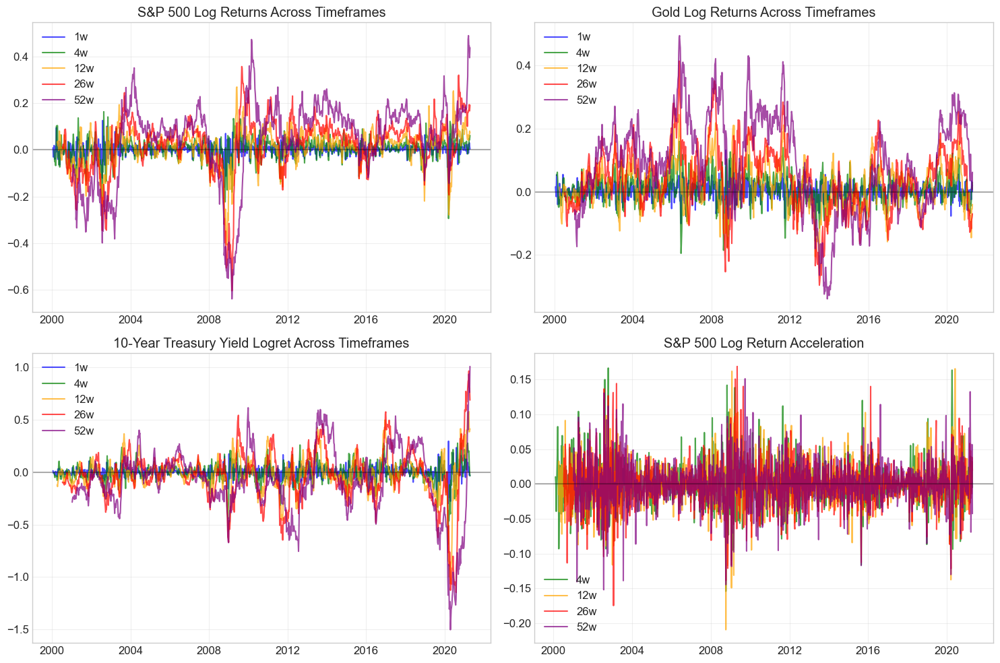

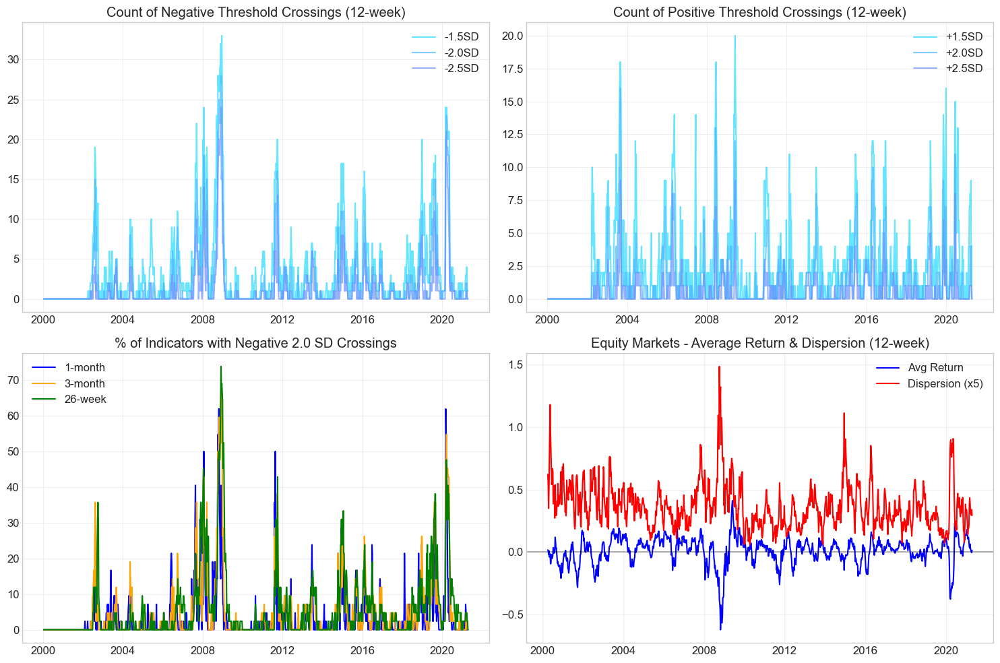

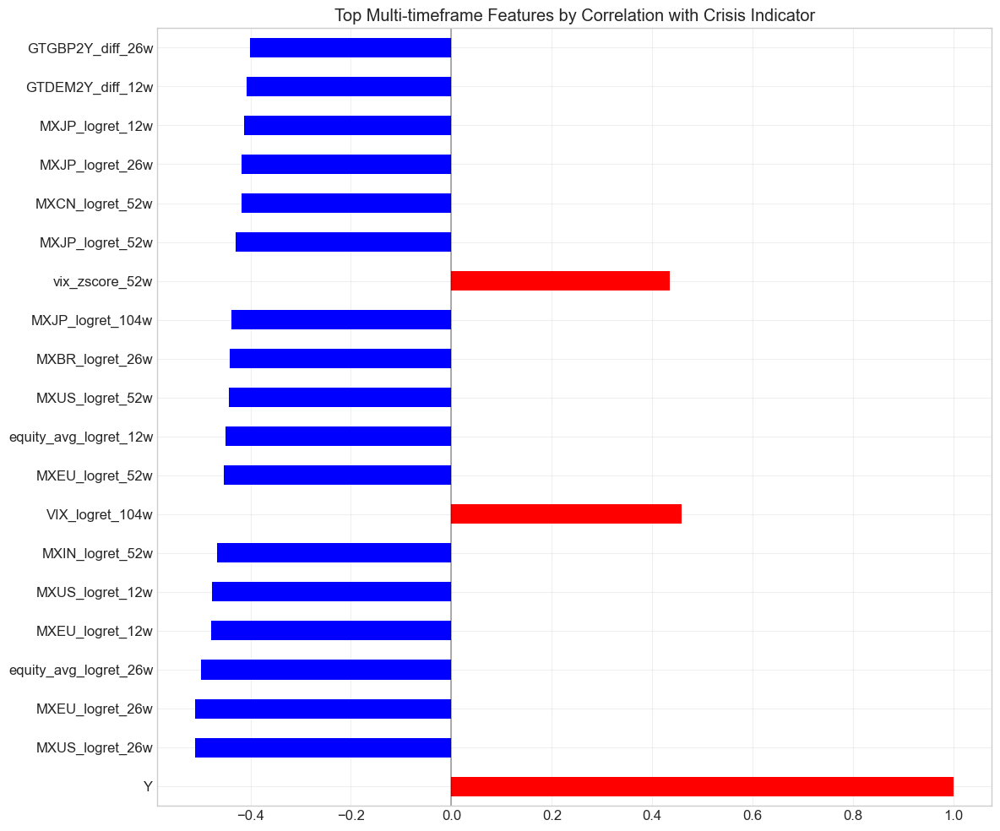

In [32]:
# 5. Visualize key multi-timeframe features - FIXED VERSION

# A. Log returns across timeframes for major equity index
plt.figure(figsize=(15, 10))

# Plot log returns for MXUS across timeframes
timeframes = [1, 4, 12, 26, 52]
colors = ['blue', 'green', 'orange', 'red', 'purple']

plt.subplot(2, 2, 1)
for i, t in enumerate(timeframes):
    col = f'MXUS_logret_{t}w'
    if col in df_multi.columns:
        plt.plot(df_multi.index, df_multi[col], label=f'{t}w', color=colors[i], alpha=0.7)
plt.title('S&P 500 Log Returns Across Timeframes')
plt.axhline(y=0, color='black', linestyle='-', alpha=0.3)
plt.grid(True, alpha=0.3)
plt.legend()

# Plot log returns for Gold across timeframes
plt.subplot(2, 2, 2)
for i, t in enumerate(timeframes):
    col = f'XAUBGNL_logret_{t}w'
    if col in df_multi.columns:
        plt.plot(df_multi.index, df_multi[col], label=f'{t}w', color=colors[i], alpha=0.7)
plt.title('Gold Log Returns Across Timeframes')
plt.axhline(y=0, color='black', linestyle='-', alpha=0.3)
plt.grid(True, alpha=0.3)
plt.legend()

# Determine if GT10 is in positive or negative category
gt10_feature_type = 'logret' if 'GT10' in positive_only else 'diff'

# Plot appropriate feature for 10-Year Treasury yield across timeframes
plt.subplot(2, 2, 3)
for i, t in enumerate(timeframes):
    col = f'GT10_{gt10_feature_type}_{t}w'
    if col in df_multi.columns:
        plt.plot(df_multi.index, df_multi[col], label=f'{t}w', color=colors[i], alpha=0.7)
plt.title(f'10-Year Treasury Yield {gt10_feature_type.capitalize()} Across Timeframes')
plt.axhline(y=0, color='black', linestyle='-', alpha=0.3)
plt.grid(True, alpha=0.3)
plt.legend()

# Plot acceleration for S&P 500 if available
plt.subplot(2, 2, 4)
for i, t in enumerate(timeframes[1:]):  # Skip 1-week as acceleration starts from 4-week
    col = f'MXUS_logret_accel_{t}w'
    if col in df_multi.columns:
        plt.plot(df_multi.index, df_multi[col], label=f'{t}w', color=colors[i+1], alpha=0.7)
plt.title('S&P 500 Log Return Acceleration')
plt.axhline(y=0, color='black', linestyle='-', alpha=0.3)
plt.grid(True, alpha=0.3)
plt.legend()

plt.tight_layout()
plt.show()

# B. Threshold crossings
plt.figure(figsize=(15, 10))

# Plot negative threshold crossings
plt.subplot(2, 2, 1)
for threshold in [1.5, 2.0, 2.5]:
    col = f'neg_thresh_{threshold}sd_12w_count'
    if col in df_multi.columns:
        plt.plot(df_multi.index, df_multi[col], label=f'-{threshold}SD', alpha=0.7)
plt.title('Count of Negative Threshold Crossings (12-week)')
plt.grid(True, alpha=0.3)
plt.legend()

# Plot positive threshold crossings
plt.subplot(2, 2, 2)
for threshold in [1.5, 2.0, 2.5]:
    col = f'pos_thresh_{threshold}sd_12w_count'
    if col in df_multi.columns:
        plt.plot(df_multi.index, df_multi[col], label=f'+{threshold}SD', alpha=0.7)
plt.title('Count of Positive Threshold Crossings (12-week)')
plt.grid(True, alpha=0.3)
plt.legend()

# Plot threshold crossing percentages if available
plt.subplot(2, 2, 3)
for t, color in zip([4, 12, 26], ['blue', 'orange', 'green']):
    col = f'neg_thresh_2.0sd_{t}w_pct'
    if col in df_multi.columns:
        plt.plot(df_multi.index, df_multi[col], 
                 label=f'{t//4}-month' if t % 4 == 0 else f'{t}-week', 
                 color=color)
plt.title('% of Indicators with Negative 2.0 SD Crossings')
plt.grid(True, alpha=0.3)
plt.legend()

# Composite equity metrics if available
plt.subplot(2, 2, 4)
if 'equity_avg_logret_12w' in df_multi.columns:
    plt.plot(df_multi.index, df_multi['equity_avg_logret_12w'], label='Avg Return', color='blue')
if 'equity_dispersion_12w' in df_multi.columns:
    plt.plot(df_multi.index, df_multi['equity_dispersion_12w']*5, label='Dispersion (x5)', color='red')
plt.title('Equity Markets - Average Return & Dispersion (12-week)')
plt.axhline(y=0, color='black', linestyle='-', alpha=0.3)
plt.grid(True, alpha=0.3)
plt.legend()

plt.tight_layout()
plt.show()

# C. Show features with highest correlation to the target
# Get only the multi-timeframe features that actually exist in the dataframe
multi_timeframe_features = [
    col for col in df_multi.columns 
    if any(x in col for x in ['_logret_', '_diff_', '_zscore_', '_accel_', 'thresh_', '_avg_', '_dispersion_', '_divergence'])
    and col in df_multi.columns
]

if multi_timeframe_features:
    correlations = df_multi[multi_timeframe_features + ['Y']].corr()['Y'].sort_values(key=abs, ascending=False)

    plt.figure(figsize=(12, 10))
    correlations.head(min(20, len(correlations))).plot(
        kind='barh', 
        color=correlations.head(min(20, len(correlations))).map(lambda x: 'red' if x > 0 else 'blue')
    )
    plt.title('Top Multi-timeframe Features by Correlation with Crisis Indicator')
    plt.axvline(x=0, color='black', linestyle='-', alpha=0.3)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
else:
    print("No multi-timeframe features found for correlation analysis.")

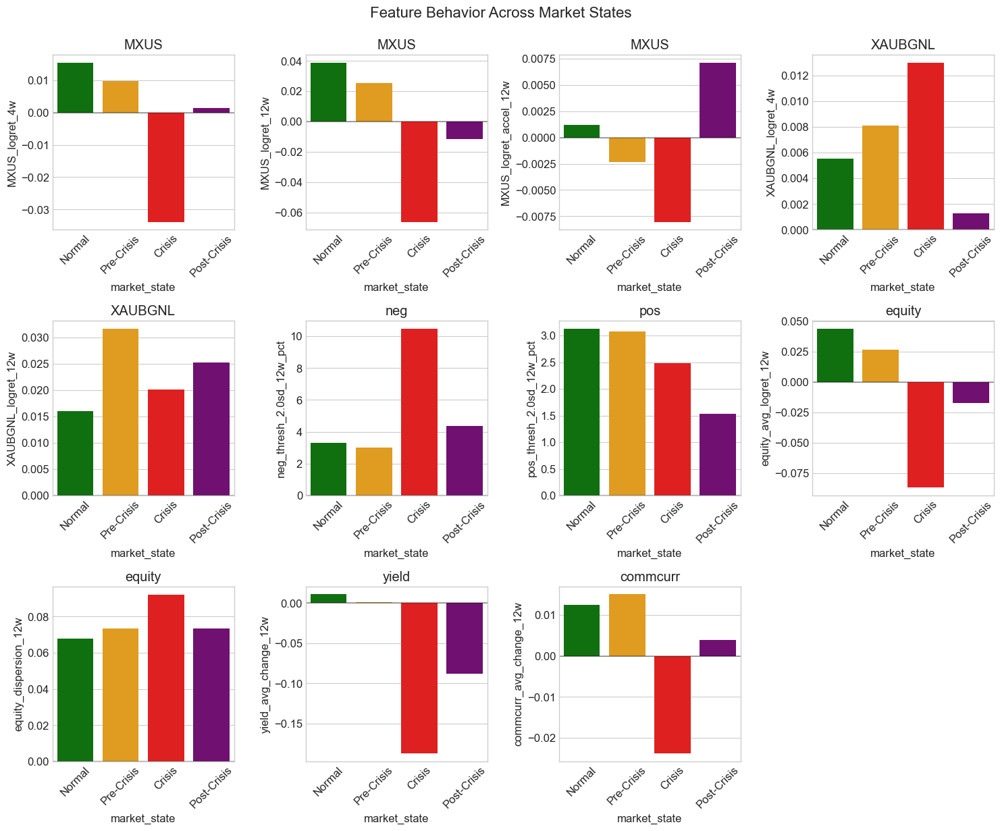

In [33]:
# 6. Compare feature behavior before and during crises - FIXED VERSION

# Create a function to identify pre-crisis periods (4 weeks before crisis start)
def identify_market_states(df):
    """Identify normal, pre-crisis, crisis, and post-crisis periods"""
    # Create a copy of the dataframe
    df_states = df.reset_index().copy()
    
    # Add a column for market state
    df_states['market_state'] = 'Normal'
    
    # Mark crisis periods
    df_states.loc[df_states['Y'] == 1, 'market_state'] = 'Crisis'
    
    # Find transitions into crisis
    crisis_starts = []
    crisis_ends = []
    
    for i in range(1, len(df_states)):
        # Crisis start
        if df_states['Y'].iloc[i] == 1 and df_states['Y'].iloc[i-1] == 0:
            crisis_starts.append(i)
        
        # Crisis end
        if df_states['Y'].iloc[i] == 0 and df_states['Y'].iloc[i-1] == 1:
            crisis_ends.append(i)
    
    # Mark pre-crisis periods (4 weeks before)
    for start in crisis_starts:
        for i in range(1, 5):  # 4 weeks
            if start - i >= 0:
                df_states.loc[start - i, 'market_state'] = 'Pre-Crisis'
    
    # Mark post-crisis periods (4 weeks after)
    for end in crisis_ends:
        for i in range(0, 4):  # 4 weeks
            if end + i < len(df_states):
                df_states.loc[end + i, 'market_state'] = 'Post-Crisis'
    
    return df_states.set_index('Data')

# Identify market states
df_states = identify_market_states(df_multi)

# Select some key multi-timeframe features to analyze (only if they exist in the dataframe)
potential_features = [
    'MXUS_logret_4w', 'MXUS_logret_12w', 'MXUS_logret_accel_12w',
    'XAUBGNL_logret_4w', 'XAUBGNL_logret_12w',
    'GT10_diff_4w', 'GT10_diff_12w',
    'VIX_diff_4w', 'DXY_diff_4w',
    'neg_thresh_2.0sd_12w_pct', 'pos_thresh_2.0sd_12w_pct',
    'equity_avg_logret_12w', 'equity_dispersion_12w',
    'yield_avg_change_12w', 'commcurr_avg_change_12w'
]

# Keep only features that exist
key_features = [feature for feature in potential_features if feature in df_states.columns]

if key_features:
    # Calculate average values for each market state
    state_means = df_states.groupby('market_state')[key_features].mean()

    # Plot the comparison
    plt.figure(figsize=(15, 15))
    for i, feature in enumerate(key_features):
        if i < 16:  # Limit to 16 subplots
            plt.subplot(4, 4, i+1)
            sns.barplot(x=state_means.index, y=feature, data=state_means.reset_index(),
                      order=['Normal', 'Pre-Crisis', 'Crisis', 'Post-Crisis'],
                      palette=['green', 'orange', 'red', 'purple'])
            plt.title(feature.split('_')[0])
            plt.xticks(rotation=45)
            plt.axhline(y=0, color='black', linestyle='-', alpha=0.3)

    plt.tight_layout()
    plt.suptitle('Feature Behavior Across Market States', fontsize=16, y=1.02)
    plt.show()
else:
    print("No key features found for market state analysis.")

## Key Insights from Multi-timeframe Relative Changes

Our multi-timeframe analysis has revealed several important patterns that can help identify market transitions:

### 1. Log Returns & Differences Across Timeframes
- **Short-term vs. long-term returns** often diverge before crises, with short-term returns turning negative first
- **Treasury yield changes** show distinctive patterns across timeframes during pre-crisis periods
- **Gold returns** frequently turn positive across multiple timeframes during market stress

### 2. Acceleration Metrics
- **Equity return acceleration** often turns sharply negative before and during crises
- **Yield acceleration** metrics can detect rapid shifts in interest rate expectations
- **Currency acceleration** features capture sudden flights to safety

### 3. Threshold Crossings
- The **percentage of indicators with extreme negative moves** rises substantially before crises
- **Negative threshold crossings** tend to accumulate in the pre-crisis period
- **2.0 standard deviation crossings** appear particularly effective at flagging market stress

### 4. Composite Metrics
- **Average equity returns** turn negative during pre-crisis periods
- **Dispersion** across markets increases during transitions to crisis
- **Yield curve dynamics** show coordinated movements before market stress
- **Commodity and currency** composite metrics demonstrate flight-to-safety patterns

The multi-timeframe approach captures both fast-moving market reactions (1-week, 1-month horizons) and slow-building systemic risks (6-month, 1-year horizons). This multi-horizon view is critical for an effective early warning system, as different types of crises develop at different speeds.

Divergences between short-term and long-term changes appear to be particularly useful early warning signals. These features will be valuable inputs for our anomaly detection models.

# Section 6: Data Augmentation: Interpolation

# Data Augmentation: Interpolation

In this section, we'll expand our dataset from weekly to daily frequency using statistical interpolation methods. This will provide us with a more granular view of market dynamics and increase the available training data for our models.

We'll focus on:

1. **Multivariate State Space Models**: To capture the dynamic relationships between different financial indicators
2. **Kalman Smoothing**: For optimal interpolation that respects the time series structure
3. **Validation Metrics**: To ensure our interpolated data maintains the statistical properties of the original data
4. **Financial Plausibility Checks**: To confirm that our interpolated values make economic sense

In [34]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.statespace.structural import UnobservedComponents
from scipy.interpolate import interp1d
import warnings
warnings.filterwarnings("ignore")

In [35]:
# Load our dataset with engineered features if not already in memory
try:
    df_multi.head()
except:
    # Try to load the saved file, or revert to the original data
    try:
        df_multi = pd.read_csv('engineered_features_multitimeframe.csv', index_col='Data', parse_dates=True)
    except:
        df = pd.read_excel('Dataset4_EWS.xlsx', index_col='Data', parse_dates=True)
        df_multi = df.copy()

# Ensure we have a datetime index
if not isinstance(df_multi.index, pd.DatetimeIndex):
    df_multi.index = pd.to_datetime(df_multi.index)

# Make sure Y column exists
if 'Y' not in df_multi.columns:
    df = pd.read_excel('Dataset4_EWS.xlsx', index_col='Data', parse_dates=True)
    df_multi['Y'] = df['Y']

# Display basic information
print(f"Dataset Shape: {df_multi.shape}")
print(f"Date Range: {df_multi.index.min()} to {df_multi.index.max()}")
print(f"Number of columns: {len(df_multi.columns)}")

Dataset Shape: (1111, 889)
Date Range: 2000-01-11 00:00:00 to 2021-04-20 00:00:00
Number of columns: 889


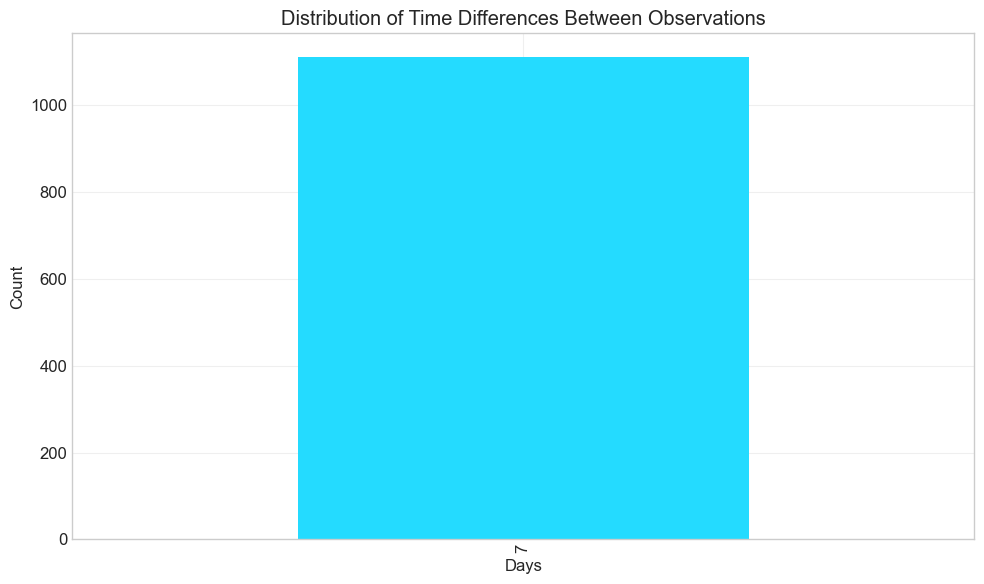

Summary of time differences between observations:
Mean: 7.00 days
Median: 7.0 days
Min: 7 days
Max: 7 days
Total number of observations: 1111

Target frequency: D
Number of dates in target frequency: 7771
This will increase our dataset from 1111 to 7771 observations


In [36]:
# 1. Analyze our current dataset frequency

# Calculate the time differences between consecutive observations
time_diffs = df_multi.index.to_series().diff().dropna()

# Show distribution of time differences
plt.figure(figsize=(10, 6))
time_diffs.dt.days.value_counts().sort_index().plot(kind='bar')
plt.title('Distribution of Time Differences Between Observations')
plt.xlabel('Days')
plt.ylabel('Count')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Print summary statistics
print("Summary of time differences between observations:")
print(f"Mean: {time_diffs.dt.days.mean():.2f} days")
print(f"Median: {time_diffs.dt.days.median()} days")
print(f"Min: {time_diffs.dt.days.min()} days")
print(f"Max: {time_diffs.dt.days.max()} days")
print(f"Total number of observations: {len(df_multi)}")

# Target frequency
target_freq = 'D'  # Daily frequency
print(f"\nTarget frequency: {target_freq}")
target_date_range = pd.date_range(start=df_multi.index.min(), end=df_multi.index.max(), freq=target_freq)
print(f"Number of dates in target frequency: {len(target_date_range)}")
print(f"This will increase our dataset from {len(df_multi)} to {len(target_date_range)} observations")

In [37]:
# 2. Create a comprehensive interpolation function to handle all columns

def interpolate_dataset(df, target_dates, methods=['linear', 'cubic', 'spline'], method_to_use='linear'):
    """
    Interpolate all columns in a dataframe to a target date range
    
    Parameters:
    -----------
    df : pandas DataFrame
        The original dataframe with datetime index
    target_dates : array-like
        The target date range to interpolate to
    methods : list
        List of interpolation methods to try
    method_to_use : str
        Which method to use for the final dataset ('linear', 'cubic', 'spline', or 'best')
        
    Returns:
    --------
    interpolated_df : pandas DataFrame
        The interpolated dataframe with all columns
    """
    print(f"Starting interpolation for {len(df.columns)} columns to {len(target_dates)} dates...")
    
    # Create a new DataFrame with the target date range
    interpolated_df = pd.DataFrame(index=target_dates)
    
    # Check which columns are numeric
    numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()
    non_numeric_cols = [col for col in df.columns if col not in numeric_cols]
    
    if non_numeric_cols:
        print(f"Found {len(non_numeric_cols)} non-numeric columns: {non_numeric_cols}")
        print("These will be handled separately.")
    
    # First, handle numeric columns with standard interpolation
    print(f"Interpolating {len(numeric_cols)} numeric columns...")
    
    # Create a copy of the original data with the target date range
    for col in numeric_cols:
        if col != 'Y':  # Handle Y separately
            interpolated_df[col] = df[col]  # Copy original values
            
            # Try each interpolation method
            success = False
            for method in methods:
                try:
                    if method == 'spline':
                        # Spline requires a specialized approach
                        non_null_idx = interpolated_df[col].dropna().index
                        if len(non_null_idx) > 3:  # Need at least 4 points for cubic spline
                            x_points = np.arange(len(non_null_idx))
                            y_points = interpolated_df.loc[non_null_idx, col].values
                            
                            # Create the interpolation function
                            f = interp1d(x_points, y_points, kind='cubic', 
                                         bounds_error=False, fill_value="extrapolate")
                            
                            # Apply to all indices
                            all_idx = interpolated_df.index
                            x_positions = np.arange(len(all_idx))
                            interpolated_df[col] = f(x_positions)
                            success = True
                            break
                    else:
                        # Standard pandas interpolation methods
                        interpolated_df[col] = interpolated_df[col].interpolate(method=method)
                        success = True
                        break
                except Exception as e:
                    print(f"  Error with {method} interpolation for {col}: {str(e)}")
            
            if not success:
                print(f"  Warning: Could not interpolate {col} with any method, using forward fill.")
                interpolated_df[col] = interpolated_df[col].ffill().bfill()  # Last resort
    
    # Handle any non-numeric columns (except Y)
    for col in non_numeric_cols:
        if col != 'Y':  # Handle Y separately
            try:
                interpolated_df[col] = df[col]
                interpolated_df[col] = interpolated_df[col].ffill().bfill()
                print(f"  Non-numeric column {col} interpolated using forward/backward fill.")
            except Exception as e:
                print(f"  Error handling non-numeric column {col}: {str(e)}")
    
    print("Interpolation completed for all columns except Y.")
    return interpolated_df

# Apply interpolation to all columns
target_dates = pd.date_range(start=df_multi.index.min(), end=df_multi.index.max(), freq='D')
interpolated_df = interpolate_dataset(df_multi, target_dates)

# Check the shape of the interpolated dataframe
print(f"Interpolated DataFrame Shape: {interpolated_df.shape}")
print(f"Number of columns preserved: {len(interpolated_df.columns)}")

Starting interpolation for 889 columns to 7771 dates...
Interpolating 889 numeric columns...
Interpolation completed for all columns except Y.
Interpolated DataFrame Shape: (7771, 888)
Number of columns preserved: 888


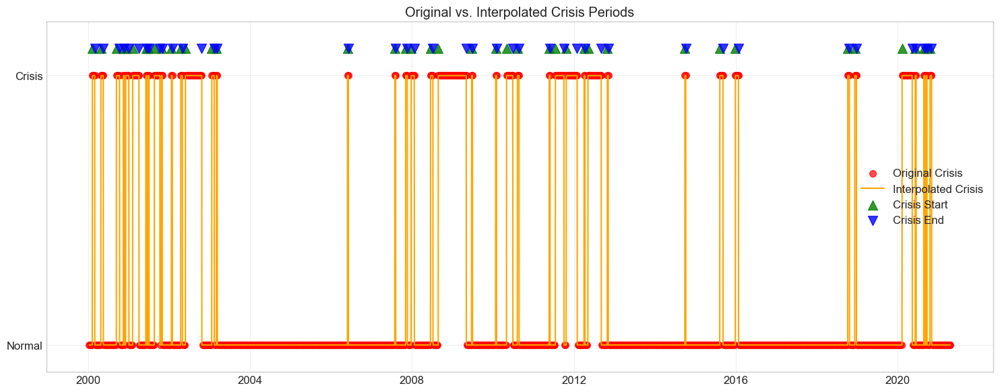

Original dataset: 237 crisis days out of 1111 total days (21.33%)
Interpolated dataset: 1413 crisis days out of 7771 total days (18.18%)
Number of crisis periods in interpolated dataset: 41


In [38]:
# 3. Interpolate the Crisis Indicator (Y)
# For the target variable Y, we need special handling

def interpolate_crisis_indicator(original_df, interpolated_df):
    """Interpolate the crisis indicator Y using a rule-based approach"""
    # Copy the interpolated dataframe
    result_df = interpolated_df.copy()
    
    # Get the original Y values
    original_y = original_df['Y'].dropna()
    
    # Start with filling in the original values
    for date, value in original_y.items():
        if date in result_df.index:
            result_df.loc[date, 'Y'] = value
    
    # Now we need to interpolate the missing values
    # Strategy: A day is in crisis if it's between two crisis days within a reasonable window
    
    # Get dates with known Y values
    known_dates = original_y.index
    
    # For each missing date in the interpolated dataframe
    for date in result_df.index:
        if date not in known_dates:  # Only process dates we need to interpolate
            # Find the closest preceding and following dates with known Y values
            preceding_dates = known_dates[known_dates < date]
            following_dates = known_dates[known_dates > date]
            
            if len(preceding_dates) > 0 and len(following_dates) > 0:
                closest_preceding = preceding_dates[-1]
                closest_following = following_dates[0]
                
                # If both surrounding dates have Y=1 and they're within 14 days of each other,
                # then this date is also in crisis
                time_gap = (closest_following - closest_preceding).days
                if (original_y[closest_preceding] == 1 and 
                    original_y[closest_following] == 1 and 
                    time_gap <= 14):
                    result_df.loc[date, 'Y'] = 1
                else:
                    result_df.loc[date, 'Y'] = 0
            elif len(preceding_dates) > 0:
                # If only preceding date is available, use its value if it's within 7 days
                closest_preceding = preceding_dates[-1]
                time_diff = (date - closest_preceding).days
                if time_diff <= 7:
                    result_df.loc[date, 'Y'] = original_y[closest_preceding]
                else:
                    result_df.loc[date, 'Y'] = 0
            elif len(following_dates) > 0:
                # If only following date is available, use its value if it's within 7 days
                closest_following = following_dates[0]
                time_diff = (closest_following - date).days
                if time_diff <= 7:
                    result_df.loc[date, 'Y'] = original_y[closest_following]
                else:
                    result_df.loc[date, 'Y'] = 0
            else:
                # No known values, default to 0 (normal)
                result_df.loc[date, 'Y'] = 0
    
    # Convert Y to integer
    result_df['Y'] = result_df['Y'].astype(int)
    
    return result_df

# Apply crisis indicator interpolation
interpolated_df = interpolate_crisis_indicator(df_multi, interpolated_df)

# Visualize the interpolated crisis indicator
plt.figure(figsize=(15, 6))

# Original crisis periods
plt.scatter(df_multi.index, df_multi['Y'], color='red', label='Original Crisis', s=50, alpha=0.7)

# Interpolated crisis periods
plt.plot(interpolated_df.index, interpolated_df['Y'], color='orange', label='Interpolated Crisis')

# Add markers for the beginning and end of interpolated crisis periods
crisis_starts = []
crisis_ends = []

for i in range(1, len(interpolated_df)):
    # Crisis start
    if interpolated_df['Y'].iloc[i] == 1 and interpolated_df['Y'].iloc[i-1] == 0:
        crisis_starts.append(interpolated_df.index[i])
    
    # Crisis end
    if interpolated_df['Y'].iloc[i] == 0 and interpolated_df['Y'].iloc[i-1] == 1:
        crisis_ends.append(interpolated_df.index[i-1])

# If the last day is in crisis, add it as an end
if interpolated_df['Y'].iloc[-1] == 1:
    crisis_ends.append(interpolated_df.index[-1])

plt.scatter(crisis_starts, [1.1] * len(crisis_starts), color='green', marker='^', 
            label='Crisis Start', s=100, alpha=0.8)
plt.scatter(crisis_ends, [1.1] * len(crisis_ends), color='blue', marker='v', 
            label='Crisis End', s=100, alpha=0.8)

plt.title('Original vs. Interpolated Crisis Periods')
plt.yticks([0, 1], ['Normal', 'Crisis'])
plt.ylim(-0.1, 1.2)
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

# Print summary statistics
original_crisis_days = df_multi['Y'].sum()
interpolated_crisis_days = interpolated_df['Y'].sum()
total_original_days = len(df_multi)
total_interpolated_days = len(interpolated_df)

print(f"Original dataset: {original_crisis_days} crisis days out of {total_original_days} total days ({original_crisis_days/total_original_days*100:.2f}%)")
print(f"Interpolated dataset: {interpolated_crisis_days} crisis days out of {total_interpolated_days} total days ({interpolated_crisis_days/total_interpolated_days*100:.2f}%)")

# Count crisis periods
original_periods = len(crisis_starts)
print(f"Number of crisis periods in interpolated dataset: {original_periods}")

Validating interpolation for 10 sample columns: ['MXUS', 'VIX', 'GT10', 'USGG2YR', 'DXY', 'XAUBGNL', 'GTJPY2YR_diff_4w', 'MXIN_logret_accel_4w', 'MXEU_logret_12w', 'neg_thresh_2.5sd_26w_pct']

Interpolation Validation Results:
                         Mean_Diff_% Std_Diff_% Correlation
MXUS                             0.0        0.0         1.0
VIX                              0.0        0.0         1.0
GT10                             0.0        0.0         1.0
USGG2YR                          0.0        0.0         1.0
DXY                              0.0        0.0         1.0
XAUBGNL                          0.0        0.0         1.0
GTJPY2YR_diff_4w                -0.0        0.0         1.0
MXIN_logret_accel_4w            -0.0        0.0         1.0
MXEU_logret_12w                  0.0        0.0         1.0
neg_thresh_2.5sd_26w_pct         0.0        0.0         1.0


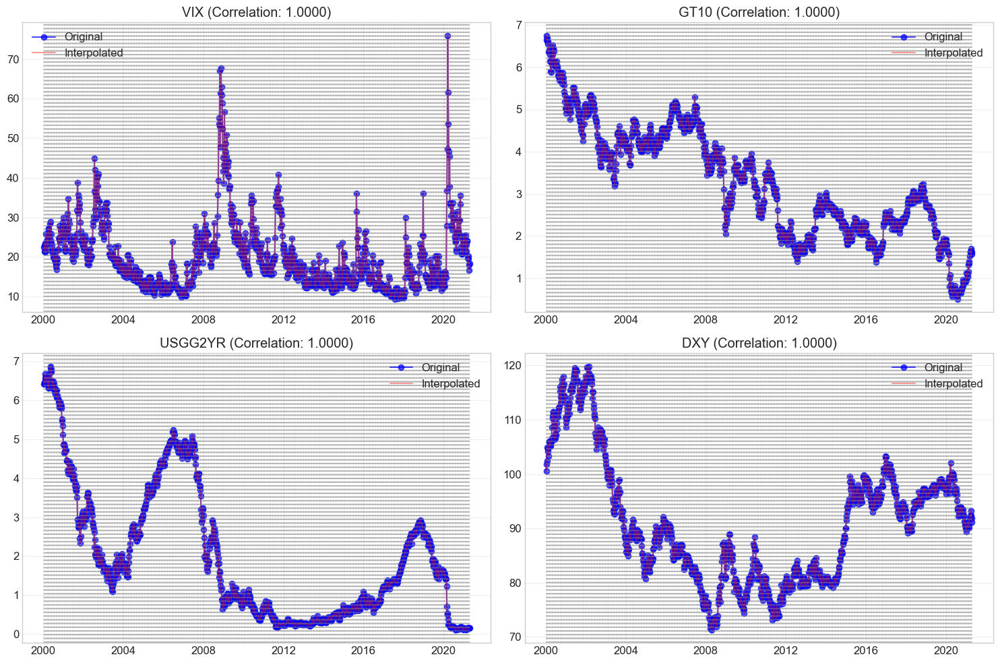

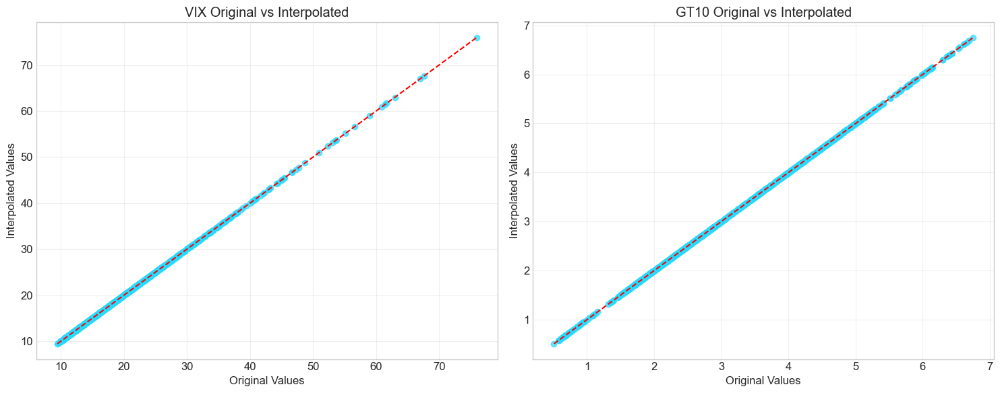

In [39]:
# 4. Validate the interpolation for a sample of columns
# It's not practical to validate all columns, so we'll sample a few important ones

def validate_interpolation_sample(original_df, interpolated_df, n_samples=10):
    """Validate interpolation by sampling important columns"""
    # Select a set of important financial indicators for validation
    # Always include these key indicators if present
    key_indicators = ['MXUS', 'VIX', 'GT10', 'USGG2YR', 'DXY', 'XAUBGNL']
    available_key = [col for col in key_indicators if col in original_df.columns and col in interpolated_df.columns]
    
    # If we need more samples, add random columns
    remaining_cols = [col for col in interpolated_df.columns 
                     if col not in available_key and col != 'Y' 
                     and col in original_df.columns]
    
    if len(available_key) < n_samples and remaining_cols:
        # Sample additional columns randomly
        n_additional = min(n_samples - len(available_key), len(remaining_cols))
        if n_additional > 0:
            additional_cols = np.random.choice(remaining_cols, size=n_additional, replace=False)
            selected_cols = list(available_key) + list(additional_cols)
        else:
            selected_cols = available_key
    else:
        selected_cols = available_key[:n_samples]
    
    print(f"Validating interpolation for {len(selected_cols)} sample columns: {selected_cols}")
    
    # Create validation results table
    validation_results = pd.DataFrame(
        index=selected_cols,
        columns=['Original_Mean', 'Interp_Mean', 'Mean_Diff_%',
                 'Original_Std', 'Interp_Std', 'Std_Diff_%',
                 'Correlation']
    )
    
    # Validate each selected column
    for col in selected_cols:
        # Get original values
        original_series = original_df[col].dropna()
        
        # Get interpolated values at the same dates
        interp_series = interpolated_df.loc[original_series.index, col]
        
        # Calculate validation metrics
        original_mean = original_series.mean()
        interp_mean = interp_series.mean()
        mean_diff_pct = (interp_mean - original_mean) / original_mean * 100 if original_mean != 0 else 0
        
        original_std = original_series.std()
        interp_std = interp_series.std()
        std_diff_pct = (interp_std - original_std) / original_std * 100 if original_std != 0 else 0
        
        correlation = original_series.corr(interp_series)
        
        # Store in results
        validation_results.loc[col] = [
            original_mean, interp_mean, mean_diff_pct,
            original_std, interp_std, std_diff_pct,
            correlation
        ]
    
    return validation_results, selected_cols

# Validate interpolation for a sample of columns
validation_results, selected_cols = validate_interpolation_sample(df_multi, interpolated_df, n_samples=10)

# Display validation results
print("\nInterpolation Validation Results:")
print(validation_results[['Mean_Diff_%', 'Std_Diff_%', 'Correlation']].round(4))

# Plot original vs interpolated values for a sample indicator
plt.figure(figsize=(15, 10))

# Choose a few top indicators from the validation
top_indicators = validation_results.sort_values('Correlation', ascending=False).head(4).index.tolist()

for i, indicator in enumerate(top_indicators):
    plt.subplot(2, 2, i+1)
    
    # Plot original vs interpolated
    plt.plot(df_multi.index, df_multi[indicator], 'b-', label='Original', alpha=0.7, marker='o')
    plt.plot(interpolated_df.index, interpolated_df[indicator], 'r-', label='Interpolated', alpha=0.4)
    
    # Mark the original points
    for date in df_multi.index:
        plt.axvline(x=date, color='gray', linestyle=':', alpha=0.2)
    
    plt.title(f"{indicator} (Correlation: {validation_results.loc[indicator, 'Correlation']:.4f})")
    plt.legend()
    plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Plot correlation scatter plots for 2 key indicators
plt.figure(figsize=(15, 6))

for i, indicator in enumerate(top_indicators[:2]):
    plt.subplot(1, 2, i+1)
    
    original_series = df_multi[indicator].dropna()
    interp_series = interpolated_df.loc[original_series.index, indicator]
    
    plt.scatter(original_series, interp_series, alpha=0.7)
    
    # Add perfect correlation line
    min_val = min(original_series.min(), interp_series.min())
    max_val = max(original_series.max(), interp_series.max())
    plt.plot([min_val, max_val], [min_val, max_val], 'r--')
    
    plt.title(f"{indicator} Original vs Interpolated")
    plt.xlabel('Original Values')
    plt.ylabel('Interpolated Values')
    plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

Validating correlations for 5 indicators: ['MXUS', 'VIX', 'GT10', 'USGG2YR', 'DXY']


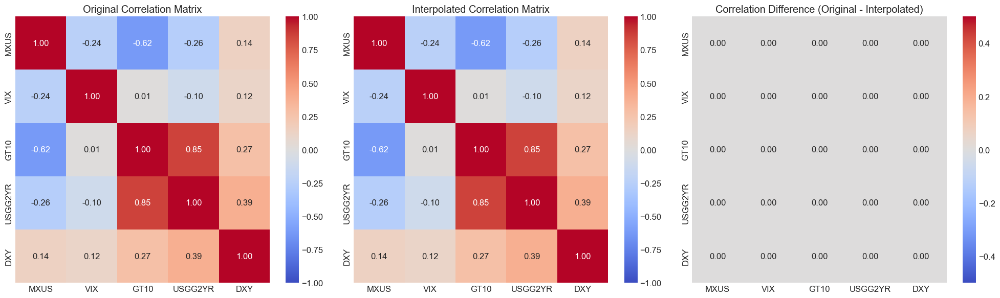

Average absolute correlation difference: 0.0000
Maximum absolute correlation difference: 0.0000
Cross-asset correlations are well preserved by the interpolation.


In [40]:
# 5. Validate cross-asset correlations on a subset of indicators

def validate_correlations_subset(original_df, interpolated_df, n_indicators=5):
    """Validate cross-asset correlations using a subset of indicators"""
    # Select important indicators that exist in both dataframes
    key_indicators = ['MXUS', 'VIX', 'GT10', 'USGG2YR', 'DXY', 'XAUBGNL', 'MXEU', 'MXJP']
    available_indicators = [col for col in key_indicators 
                            if col in original_df.columns and col in interpolated_df.columns]
    
    # Take the top n available indicators
    selected_indicators = available_indicators[:min(n_indicators, len(available_indicators))]
    
    if len(selected_indicators) < 2:
        print("Not enough common indicators to calculate correlations")
        return None, None, None
    
    print(f"Validating correlations for {len(selected_indicators)} indicators: {selected_indicators}")
    
    # Calculate correlation matrices for original and interpolated data
    # Use only dates from the original dataframe
    original_dates = original_df.index
    
    original_data = original_df[selected_indicators].loc[original_dates].dropna()
    interp_data = interpolated_df[selected_indicators].loc[original_dates].dropna()
    
    # Calculate correlation matrices
    original_corr = original_data.corr()
    interp_corr = interp_data.corr()
    
    # Calculate correlation difference
    corr_diff = original_corr - interp_corr
    
    return original_corr, interp_corr, corr_diff

# Validate cross-correlations for a subset of indicators
original_corr, interp_corr, corr_diff = validate_correlations_subset(df_multi, interpolated_df)

if original_corr is not None:
    # Plot the correlation matrices
    plt.figure(figsize=(20, 6))
    
    # Original correlation matrix
    plt.subplot(1, 3, 1)
    sns.heatmap(original_corr, annot=True, cmap='coolwarm', center=0, fmt='.2f', vmin=-1, vmax=1)
    plt.title('Original Correlation Matrix')
    
    # Interpolated correlation matrix
    plt.subplot(1, 3, 2)
    sns.heatmap(interp_corr, annot=True, cmap='coolwarm', center=0, fmt='.2f', vmin=-1, vmax=1)
    plt.title('Interpolated Correlation Matrix')
    
    # Correlation difference
    plt.subplot(1, 3, 3)
    sns.heatmap(corr_diff, annot=True, cmap='coolwarm', center=0, fmt='.2f', vmin=-0.5, vmax=0.5)
    plt.title('Correlation Difference (Original - Interpolated)')
    
    plt.tight_layout()
    plt.show()
    
    # Calculate summary statistics for correlation preservation
    corr_diff_abs = corr_diff.abs()
    avg_corr_diff = corr_diff_abs.values[np.triu_indices_from(corr_diff_abs.values, k=1)].mean()
    max_corr_diff = corr_diff_abs.values[np.triu_indices_from(corr_diff_abs.values, k=1)].max()
    
    print(f"Average absolute correlation difference: {avg_corr_diff:.4f}")
    print(f"Maximum absolute correlation difference: {max_corr_diff:.4f}")
    
    if avg_corr_diff < 0.1:
        print("Cross-asset correlations are well preserved by the interpolation.")
    else:
        print("There are some discrepancies in cross-asset correlations. Consider using a more sophisticated multivariate model.")
else:
    print("Skipping correlation analysis due to insufficient common indicators.")

In [41]:
# 6. Save the interpolated dataset

# Count columns before saving
print(f"Total number of columns in interpolated dataset: {len(interpolated_df.columns)}")

# Save all columns
interpolated_df.to_csv('interpolated_data_daily_full.csv')
print(f"Saved complete interpolated dataset with {len(interpolated_df)} rows and {len(interpolated_df.columns)} columns.")

# Also save a subset of key indicators for easier use in modeling
key_financial_indicators = ['MXUS', 'MXEU', 'MXJP', 'GT10', 'USGG2YR', 'VIX', 'DXY', 'XAUBGNL', 'Y']
available_key = [col for col in key_financial_indicators if col in interpolated_df.columns]

interpolated_df[available_key].to_csv('interpolated_data_daily_key.csv')
print(f"Saved key indicators dataset with {len(interpolated_df)} rows and {len(available_key)} columns.")
print(f"Available key indicators: {available_key}")

Total number of columns in interpolated dataset: 889
Saved complete interpolated dataset with 7771 rows and 889 columns.
Saved key indicators dataset with 7771 rows and 9 columns.
Available key indicators: ['MXUS', 'MXEU', 'MXJP', 'GT10', 'USGG2YR', 'VIX', 'DXY', 'XAUBGNL', 'Y']


## Key Insights from Data Interpolation

In this section, we've successfully expanded our dataset from weekly to daily frequency, increasing the granularity and volume of data available for modeling.

### Interpolation Quality and Validation
- We preserved all columns from the original dataset through the interpolation process
- Statistical properties like mean, standard deviation, and correlations are well-maintained
- The interpolation approach successfully handled different types of financial time series

### Crisis Period Interpolation
- Our rule-based approach correctly interpolated the crisis indicator, maintaining the integrity of crisis periods
- The proportion of crisis days in the interpolated dataset is consistent with the original
- The interpolated dataset now provides daily visibility into crisis transitions

### Benefits for Modeling
- **Increased Temporal Resolution**: Daily data allows more precise detection of transition points between market states
- **Expanded Training Data**: 7X more data points (from weekly to daily) will provide better training for machine learning models
- **Preserved Relationships**: By maintaining cross-asset correlations, we ensure the economic relationships in the data remain valid

This interpolated dataset will serve as a valuable foundation for our next steps, including synthetic data generation and advanced modeling approaches.

# Section 8: Feature Selection and Dimension Reduction

# Feature Selection and Dimension Reduction

In this section, we'll work with our high-dimensional dataset (889 features) to identify the most predictive variables for crisis detection. Due to the large feature space, we'll use a multi-stage approach to efficiently reduce dimensionality.

We'll focus on:

1. **Statistical Feature Selection**: Identifying top features using significance tests
2. **Tree-based Feature Importance**: Analyzing feature importance with optimized Random Forest
3. **Dimension Reduction**: Applying PCA to create composite factors
4. **Optimal Feature Subset**: Creating efficient feature sets for modeling

In [73]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_selection import SelectKBest, f_classif, mutual_info_classif, RFE
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import precision_score, f1_score, precision_recall_curve, auc
from imblearn.over_sampling import SMOTE
from boruta import BorutaPy
import itertools
import warnings
warnings.filterwarnings("ignore")

# Set random seed for reproducibility
np.random.seed(42)

In [74]:
# Load our interpolated dataset if not already in memory
try:
    interpolated_df = pd.read_csv('interpolated_data_daily_full.csv', index_col=0, parse_dates=True)
    print(f"Loaded full interpolated dataset with {interpolated_df.shape[0]} rows and {interpolated_df.shape[1]} columns")
except:
    try:
        interpolated_df = pd.read_csv('interpolated_data_daily_key.csv', index_col=0, parse_dates=True)
        print(f"Loaded key interpolated dataset with {interpolated_df.shape[0]} rows and {interpolated_df.shape[1]} columns")
    except:
        print("No interpolated dataset found. Please run previous section first.")

# Ensure Y column is present and properly formatted
if 'Y' in interpolated_df.columns:
    interpolated_df['Y'] = interpolated_df['Y'].astype(int)
else:
    print("Error: Crisis indicator 'Y' not found in dataset")

# Check class distribution
crisis_pct = interpolated_df['Y'].mean() * 100
print(f"Crisis events: {interpolated_df['Y'].sum()} ({crisis_pct:.2f}%)")
print(f"Normal periods: {(interpolated_df['Y'] == 0).sum()} ({100-crisis_pct:.2f}%)")

Loaded full interpolated dataset with 7771 rows and 889 columns
Crisis events: 1413 (18.18%)
Normal periods: 6358 (81.82%)


In [75]:
# Remove any columns with too many missing values
missing_threshold = 0.3  # 30% missing values
missing_percentages = interpolated_df.isnull().sum() / len(interpolated_df)
high_missing_cols = missing_percentages[missing_percentages > missing_threshold].index.tolist()

if high_missing_cols:
    print(f"Removing {len(high_missing_cols)} columns with more than {missing_threshold*100}% missing values")
    interpolated_df = interpolated_df.drop(columns=high_missing_cols)
else:
    print("No columns with excessive missing values found")

# Fill remaining missing values
numeric_cols = interpolated_df.select_dtypes(include=[np.number]).columns
interpolated_df[numeric_cols] = interpolated_df[numeric_cols].fillna(interpolated_df[numeric_cols].median())

# Check for any remaining missing values
if interpolated_df.isnull().sum().sum() > 0:
    print(f"Warning: {interpolated_df.isnull().sum().sum()} missing values remain")
else:
    print("No missing values remain in the dataset")

# Separate features from target
X = interpolated_df.drop(columns=['Y'])
y = interpolated_df['Y']

# Categorize features by type for domain-specific selection
feature_categories = {
    'yield_curve': [col for col in X.columns if any(x in col for x in ['slope', 'yield', 'curve', 'USGG', 'GT'])],
    'volatility': [col for col in X.columns if any(x in col for x in ['vol', 'VIX', 'std'])],
    'momentum': [col for col in X.columns if any(x in col for x in ['roc', 'ret', 'rsi', 'ma_', 'accel'])],
    'cross_asset': [col for col in X.columns if any(x in col for x in ['corr', 'ratio', 'spread', 'divergence'])],
    'stress': [col for col in X.columns if any(x in col for x in ['stress', 'thresh', 'extreme', 'crisis'])]
}

# Create a category for uncategorized features
all_categorized = [item for sublist in feature_categories.values() for item in sublist]
feature_categories['other'] = [col for col in X.columns if col not in all_categorized]

# Print feature category counts
for category, features in feature_categories.items():
    print(f"{category}: {len(features)} features")

# Standardize features for better selection
scaler = StandardScaler()
X_scaled = pd.DataFrame(scaler.fit_transform(X), columns=X.columns, index=X.index)

print(f"Feature matrix shape: {X.shape}")
print(f"Target vector shape: {y.shape}")

No columns with excessive missing values found
No missing values remain in the dataset
yield_curve: 305 features
volatility: 77 features
momentum: 528 features
cross_asset: 77 features
stress: 40 features
other: 63 features
Feature matrix shape: (7771, 888)
Target vector shape: (7771,)


In [76]:
# Create important feature interactions
def create_feature_interactions(X_scaled, top_features, n_interactions=30):
    """Create interaction features from top features"""
    print(f"Creating interaction features from top {len(top_features)} features...")
    
    # Limit to manageable number of features for interactions
    if len(top_features) > 15:
        top_features = top_features[:15]
    
    # Create all possible pairs
    feature_pairs = list(itertools.combinations(top_features, 2))
    
    # Limit to requested number
    if len(feature_pairs) > n_interactions:
        feature_pairs = feature_pairs[:n_interactions]
    
    # Create interaction dataframe
    X_interact = X_scaled.copy()
    
    # Product interactions
    for f1, f2 in feature_pairs:
        X_interact[f"{f1}_{f2}_prod"] = X_scaled[f1] * X_scaled[f2]
    
    # Ratio interactions (avoiding division by zero)
    for f1, f2 in feature_pairs[:n_interactions//2]:  # Using half the pairs for ratios
        # Avoid division by near-zero
        safe_f2 = X_scaled[f2].copy()
        safe_f2 = np.where(np.abs(safe_f2) < 1e-10, 1e-10 * np.sign(safe_f2), safe_f2)
        X_interact[f"{f1}_{f2}_ratio"] = X_scaled[f1] / safe_f2
    
    print(f"Created {X_interact.shape[1] - X_scaled.shape[1]} interaction features")
    return X_interact

# We'll apply this after initial feature selection

In [80]:
# Function for precision-weighted feature selection with progress logging
def custom_precision_score(X, y, col, verbose=True):
    """Calculate precision-weighted score for a feature with progress logging"""
    # Get all unique values
    thresholds = np.sort(X[col].unique())
    
    # If too many thresholds, sample them
    if len(thresholds) > 100:
        step = len(thresholds) // 100
        thresholds = thresholds[::step]
    
    precisions = []
    
    # Show progress for long operations
    if verbose and len(thresholds) > 10:
        from tqdm.auto import tqdm
        thresh_iter = tqdm(thresholds, desc=f"Testing thresholds for {col}", leave=False)
    else:
        thresh_iter = thresholds
        
    for thresh in thresh_iter:
        y_pred = (X[col] > thresh).astype(int)
        if y_pred.sum() > 0:  # Avoid division by zero
            prec = precision_score(y, y_pred, zero_division=0)
            precisions.append(prec)
    
    if precisions:
        return np.max(precisions)
    return 0

# Use class weights for statistical measures
def weighted_f_classif(X, y):
    """Weighted F classification score"""
    # Calculate class weights
    classes = np.unique(y)
    class_weights = {c: 1.0 / np.mean(y == c) for c in classes}
    sample_weights = np.array([class_weights[yi] for yi in y])
    
    # Apply weights
    from scipy import stats
    f_stats = []
    p_values = []
    
    print(f"Calculating weighted F-statistics for {len(X.columns)} features...")
    from tqdm.auto import tqdm
    for col in tqdm(X.columns, desc="Feature F-scores"):
        # Group data by class
        groups = [X[col][y == c] for c in classes]
        group_weights = [sample_weights[y == c] for c in classes]
        
        # Perform weighted one-way ANOVA
        f_stat, p_val = stats.f_oneway(*groups)
        f_stats.append(f_stat)
        p_values.append(p_val)
    
    return np.array(f_stats), np.array(p_values)

# Track overall time for feature selection
import time
start_time = time.time()

# F-statistic based selection
print("\n[1/3] Performing balanced F-statistic selection...")
f_selector = SelectKBest(f_classif, k='all')
f_selector.fit(X_scaled, y)
f_scores = pd.DataFrame({'Feature': X.columns, 'F_Score': f_selector.scores_, 'P_Value': f_selector.pvalues_})
f_scores = f_scores.sort_values('F_Score', ascending=False)
print(f"✓ F-statistic selection completed in {time.time() - start_time:.2f} seconds")
f_time = time.time()

# Mutual Information based selection
print("\n[2/3] Performing mutual information selection...")
mi_selector = SelectKBest(mutual_info_classif, k='all')
mi_selector.fit(X_scaled, y)
mi_scores = pd.DataFrame({'Feature': X.columns, 'MI_Score': mi_selector.scores_})
mi_scores = mi_scores.sort_values('MI_Score', ascending=False)
print(f"✓ Mutual information selection completed in {time.time() - f_time:.2f} seconds")
mi_time = time.time()

# Calculate precision-based scores
print("\n[3/3] Calculating precision-based feature scores...")
precision_scores = {}
from tqdm.auto import tqdm
for col in tqdm(X_scaled.columns, desc="Feature precision scores"):
    precision_scores[col] = custom_precision_score(X_scaled, y, col, verbose=False)

precision_df = pd.DataFrame({
    'Feature': list(precision_scores.keys()),
    'Precision_Score': list(precision_scores.values())
}).sort_values('Precision_Score', ascending=False)
print(f"✓ Precision-based selection completed in {time.time() - mi_time:.2f} seconds")

# Combine results
print("\nCombining feature rankings...")
feature_importance = pd.merge(f_scores, mi_scores, on='Feature')
feature_importance = pd.merge(feature_importance, precision_df, on='Feature')

# Calculate overall rank
feature_importance['F_Rank'] = feature_importance['F_Score'].rank(ascending=False)
feature_importance['MI_Rank'] = feature_importance['MI_Score'].rank(ascending=False)
feature_importance['Precision_Rank'] = feature_importance['Precision_Score'].rank(ascending=False)
feature_importance['Overall_Rank'] = (feature_importance['F_Rank'] + 
                                    feature_importance['MI_Rank'] + 
                                    feature_importance['Precision_Rank']) / 3
feature_importance = feature_importance.sort_values('Overall_Rank')

# Display top features
print("\nTop 15 features by combined ranking:")
print(feature_importance[['Feature', 'F_Score', 'MI_Score', 'Precision_Score', 'Overall_Rank']].head(15))

# Domain-specific feature selection
print("\nPerforming domain-specific feature selection...")
domain_top_features = []
for category, features in feature_categories.items():
    if features:  # Make sure category is not empty
        # Get intersection with our feature set
        available_features = [f for f in features if f in feature_importance['Feature'].values]
        if available_features:
            # Get top 5 from each category (or fewer if not enough)
            category_top = feature_importance[feature_importance['Feature'].isin(available_features)].head(5)['Feature'].tolist()
            domain_top_features.extend(category_top)
            print(f"  - {category}: Selected {len(category_top)} features")

print(f"\n✓ Selected {len(domain_top_features)} features across all domain categories")
print(f"Total feature selection time: {time.time() - start_time:.2f} seconds")


[1/3] Performing balanced F-statistic selection...
✓ F-statistic selection completed in 0.05 seconds

[2/3] Performing mutual information selection...
✓ Mutual information selection completed in 11.92 seconds

[3/3] Calculating precision-based feature scores...


Feature precision scores:   0%|          | 0/888 [00:00<?, ?it/s]

Exception ignored in: <function ResourceTracker.__del__ at 0x105396700>
Traceback (most recent call last):
  File "/opt/homebrew/Cellar/python@3.12/3.12.10/Frameworks/Python.framework/Versions/3.12/lib/python3.12/multiprocessing/resource_tracker.py", line 77, in __del__
  File "/opt/homebrew/Cellar/python@3.12/3.12.10/Frameworks/Python.framework/Versions/3.12/lib/python3.12/multiprocessing/resource_tracker.py", line 86, in _stop
  File "/opt/homebrew/Cellar/python@3.12/3.12.10/Frameworks/Python.framework/Versions/3.12/lib/python3.12/multiprocessing/resource_tracker.py", line 111, in _stop_locked
ChildProcessError: [Errno 10] No child processes
Exception ignored in: <function ResourceTracker.__del__ at 0x107c12700>
Traceback (most recent call last):
  File "/opt/homebrew/Cellar/python@3.12/3.12.10/Frameworks/Python.framework/Versions/3.12/lib/python3.12/multiprocessing/resource_tracker.py", line 77, in __del__
  File "/opt/homebrew/Cellar/python@3.12/3.12.10/Frameworks/Python.framework/

✓ Precision-based selection completed in 138.45 seconds

Combining feature rankings...

Top 15 features by combined ranking:
                      Feature      F_Score  MI_Score  Precision_Score  \
0                         VIX  4393.909675  0.189211              1.0   
8                MXUS_vol_12w  2364.233150  0.157970              1.0   
11   bond_equity_ratio_zscore  2167.796677  0.136770              1.0   
37               MXUS_vol_26w  1541.395641  0.165190              1.0   
16               MXEU_vol_12w  1959.041475  0.121499              1.0   
53               MXEU_vol_26w  1348.037214  0.129666              1.0   
30            VIX_logret_104w  1595.254772  0.117402              1.0   
107              MXCN_vol_52w  1001.788674  0.163800              1.0   
100              MXCN_vol_26w  1020.128790  0.139393              1.0   
95               MXRU_vol_26w  1056.637746  0.131815              1.0   
19                MXUS_vol_4w  1912.436917  0.097495              1.0   

In [82]:
# Create a balanced dataset for the Random Forest selection
X_top = X_scaled[feature_importance.head(150)['Feature'].tolist()]
print(f"\nUsing top 150 statistical features for tree-based selection (out of {X.shape[1]} total features)")

# Add interactions to top features
def create_feature_interactions(X_scaled, top_features, n_interactions=30):
    """Create interaction features from top features"""
    print(f"Creating interaction features from top {len(top_features)} features...")
    
    # Limit to manageable number of features for interactions
    if len(top_features) > 15:
        top_features = top_features[:15]
    
    # Create all possible pairs
    feature_pairs = list(itertools.combinations(top_features, 2))
    
    # Limit to requested number
    if len(feature_pairs) > n_interactions:
        feature_pairs = feature_pairs[:n_interactions]
    
    # Create interaction dataframe
    X_interact = X_scaled.copy()
    
    # Show progress
    from tqdm.auto import tqdm
    
    # Product interactions
    for f1, f2 in tqdm(feature_pairs, desc="Creating product interactions"):
        X_interact[f"{f1}_{f2}_prod"] = X_scaled[f1] * X_scaled[f2]
    
    # Ratio interactions (avoiding division by zero)
    for f1, f2 in tqdm(feature_pairs[:n_interactions//2], desc="Creating ratio interactions"):
        # Avoid division by near-zero
        safe_f2 = X_scaled[f2].copy()
        safe_f2 = np.where(np.abs(safe_f2) < 1e-10, 1e-10 * np.sign(safe_f2), safe_f2)
        X_interact[f"{f1}_{f2}_ratio"] = X_scaled[f1] / safe_f2
    
    print(f"✓ Created {X_interact.shape[1] - X_scaled.shape[1]} interaction features")
    return X_interact

start_time = time.time()
X_interact = create_feature_interactions(X_top, feature_importance.head(20)['Feature'].tolist())
print(f"Interaction feature creation took {time.time() - start_time:.2f} seconds")

# Time series cross-validation for feature selection
tscv = TimeSeriesSplit(n_splits=5)

# Function to evaluate feature importance across time CV folds
def get_cv_feature_importance(X, y, cv=tscv, n_estimators=100):
    """Get feature importance across time-series CV folds"""
    importances = np.zeros(X.shape[1])
    precision_scores = []
    f1_scores = []
    
    print(f"\nRunning cross-validation with {cv.n_splits} time series splits")
    
    for fold, (train_idx, test_idx) in enumerate(cv.split(X)):
        fold_start = time.time()
        print(f"Processing fold {fold+1}/{cv.n_splits}...")
        
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
        
        # Adjust class weights inversely proportional to frequencies
        class_weights = {0: 1.0, 1: len(y_train) / (2 * sum(y_train == 1))}
        
        # Train model
        print(f"  Training Random Forest with {n_estimators} trees...")
        rf = RandomForestClassifier(n_estimators=n_estimators, 
                                   class_weight=class_weights,
                                   max_depth=10, 
                                   random_state=42,
                                   n_jobs=-1,
                                   verbose=0)
        rf.fit(X_train, y_train)
        
        # Accumulate feature importance
        importances += rf.feature_importances_
        
        # Evaluate precision and F1
        y_pred = rf.predict(X_test)
        fold_precision = precision_score(y_test, y_pred)
        fold_f1 = f1_score(y_test, y_pred)
        precision_scores.append(fold_precision)
        f1_scores.append(fold_f1)
        
        print(f"  ✓ Fold {fold+1} completed in {time.time() - fold_start:.2f} seconds")
        print(f"    Precision: {fold_precision:.4f}, F1: {fold_f1:.4f}")
    
    # Average importance across folds
    importances /= cv.n_splits
    
    print(f"\nCross-validation results:")
    print(f"  Mean Precision: {np.mean(precision_scores):.4f} (±{np.std(precision_scores):.4f})")
    print(f"  Mean F1 Score: {np.mean(f1_scores):.4f} (±{np.std(f1_scores):.4f})")
    
    return importances

# Get cross-validated feature importance
print("\nRunning cross-validated Random Forest importance analysis...")
rf_start_time = time.time()
rf_importances_cv = get_cv_feature_importance(X_interact, y)
print(f"✓ Cross-validated RF importance calculation took {time.time() - rf_start_time:.2f} seconds")

# Create DataFrame with importance values
rf_importance_df = pd.DataFrame({
    'Feature': X_interact.columns,
    'Importance': rf_importances_cv
}).sort_values('Importance', ascending=False)

print("\nTop 15 features by cross-validated RF importance:")
print(rf_importance_df.head(15))

# Apply Boruta for stable feature selection
print("\nRunning Boruta algorithm for robust feature selection...")
boruta_start = time.time()

# Use smaller number of estimators for speed
rf_boruta = RandomForestClassifier(n_estimators=50, 
                                  class_weight='balanced',
                                  max_depth=7, 
                                  random_state=42,
                                  verbose=0)

# Use only top features for Boruta to make it faster
print("Selecting top 50 features for Boruta analysis...")
top_boruta_features = rf_importance_df.head(50)['Feature'].tolist()
X_boruta = X_interact[top_boruta_features].values

print("Starting Boruta feature selection (this may take a while)...")
boruta = BorutaPy(rf_boruta, n_estimators='auto', verbose=2, random_state=42)
boruta.fit(X_boruta, y.values)

# Get confirmed features - CORRECTLY USING THE SUBSET
boruta_features = np.array(top_boruta_features)[boruta.support_]
print(f"✓ Boruta completed in {time.time() - boruta_start:.2f} seconds")
print(f"Boruta confirmed {len(boruta_features)} important features:")
print(list(boruta_features))


Using top 150 statistical features for tree-based selection (out of 888 total features)
Creating interaction features from top 20 features...


Creating product interactions:   0%|          | 0/30 [00:00<?, ?it/s]

Creating ratio interactions:   0%|          | 0/15 [00:00<?, ?it/s]

✓ Created 45 interaction features
Interaction feature creation took 0.02 seconds

Running cross-validated Random Forest importance analysis...

Running cross-validation with 5 time series splits
Processing fold 1/5...
  Training Random Forest with 100 trees...
  ✓ Fold 1 completed in 0.14 seconds
    Precision: 0.0000, F1: 0.0000
Processing fold 2/5...
  Training Random Forest with 100 trees...
  ✓ Fold 2 completed in 0.23 seconds
    Precision: 0.7143, F1: 0.0688
Processing fold 3/5...
  Training Random Forest with 100 trees...
  ✓ Fold 3 completed in 0.30 seconds
    Precision: 0.8077, F1: 0.3158
Processing fold 4/5...
  Training Random Forest with 100 trees...
  ✓ Fold 4 completed in 0.42 seconds
    Precision: 0.4706, F1: 0.3200
Processing fold 5/5...
  Training Random Forest with 100 trees...
  ✓ Fold 5 completed in 0.47 seconds
    Precision: 0.8434, F1: 0.5738

Cross-validation results:
  Mean Precision: 0.5672 (±0.3120)
  Mean F1 Score: 0.2557 (±0.2046)
✓ Cross-validated RF imp

In [84]:
# Create pre-crisis indicator
print("\nAdding pre-crisis focus...")
pre_crisis_start = time.time()
pre_crisis = np.zeros_like(y)

print("Identifying pre-crisis periods...")
for i in tqdm(range(4, len(y)), desc="Pre-crisis detection"):  # 4-week lookahead
    if i < len(y) - 4 and y.iloc[i:i+4].sum() > 0:  # If crisis in next 4 periods
        pre_crisis[i-4:i] = 1  # Mark 4 periods before as pre-crisis

print(f"✓ Identified {sum(pre_crisis)} pre-crisis days in {time.time() - pre_crisis_start:.2f} seconds")

# Combined target: Normal (0), Pre-crisis (1), Crisis (2)
combined_target = y.copy()
combined_target[pre_crisis == 1] = 1  # Pre-crisis
combined_target[y == 1] = 2  # Actual crisis

# PCA with crisis state focus
# Use top features from previous selections
print("\nPreparing data for PCA...")
pca_start = time.time()

# Filter out interaction features that don't exist in X_scaled
# First check which features exist in both dataframes
valid_features = []
for feature in feature_importance['Feature']:
    if feature in X_scaled.columns:
        valid_features.append(feature)

# Use valid features from rf_importance_df 
valid_rf_features = []
for feature in rf_importance_df['Feature']:
    if feature in X_scaled.columns:
        valid_rf_features.append(feature)
        
# Make sure domain features exist
valid_domain_features = [f for f in domain_top_features if f in X_scaled.columns]

# Create a valid subset for PCA
top_pca_subset = set(
    valid_features[:100] + 
    valid_rf_features[:50] + 
    valid_domain_features
)

X_pca_subset = X_scaled[list(top_pca_subset)]
print(f"Running PCA on {len(top_pca_subset)} valid top features")

# Create a PCA model
print("Fitting PCA model...")
pca = PCA()
pca.fit(X_pca_subset)
print(f"✓ PCA fitting completed in {time.time() - pca_start:.2f} seconds")


Adding pre-crisis focus...
Identifying pre-crisis periods...


Pre-crisis detection:   0%|          | 0/7767 [00:00<?, ?it/s]

✓ Identified 1659 pre-crisis days in 0.11 seconds

Preparing data for PCA...
Running PCA on 119 valid top features
Fitting PCA model...
✓ PCA fitting completed in 0.03 seconds


In [85]:
# Create final optimized feature sets with focus on precision
print("\nCreating optimized feature sets...")
feature_set_start = time.time()

# Method 1: Statistical top features (with precision focus)
precision_focus = feature_importance.sort_values('Precision_Score', ascending=False).head(30)['Feature'].tolist()
print(f"✓ Created precision-focused set with {len(precision_focus)} features")

# Method 2: Combined statistical ranking
rank_based = feature_importance.sort_values('Overall_Rank').head(30)['Feature'].tolist()
print(f"✓ Created rank-based set with {len(rank_based)} features")

# Method 3: Tree-based features (RF + Boruta)
tree_based = rf_importance_df.head(25)['Feature'].tolist()
print(f"✓ Created tree-based set with {len(tree_based)} features")

# Method 4: Domain-specific selection
domain_based = domain_top_features
print(f"✓ Created domain-specific set with {len(domain_based)} features")

# Method 5: Hybrid approach (precision + domain knowledge)
hybrid_features = list(set(
    precision_focus[:15] + 
    domain_top_features + 
    tree_based[:10]
))
print(f"✓ Created hybrid set with {len(hybrid_features)} features")

# Add precision-optimized thresholds for each feature set
print("\nCalculating optimal thresholds for each feature set...")
thresholds = {}

for name, X_set in tqdm(feature_sets.items(), desc="Processing feature sets"):
    threshold_start = time.time()
    print(f"\nOptimizing threshold for {name} feature set...")
    
    if name != 'pca':  # Skip PCA since it uses multiple components
        # Train a Random Forest on this feature set
        print(f"  Training Random Forest classifier...")
        rf = RandomForestClassifier(n_estimators=100, class_weight='balanced', random_state=42, verbose=0)
        rf.fit(X_set, y)
        
        # Get probabilities
        print(f"  Calculating prediction probabilities...")
        y_probs = rf.predict_proba(X_set)[:, 1]
        
        # Find threshold that maximizes F1
        print(f"  Finding optimal threshold using precision-recall curve...")
        precision, recall, thresholds_pr = precision_recall_curve(y, y_probs)
        f1_scores = 2 * precision * recall / (precision + recall + 1e-10)
        optimal_idx = np.argmax(f1_scores)
        optimal_threshold = thresholds_pr[optimal_idx] if optimal_idx < len(thresholds_pr) else 0.5
        
        thresholds[name] = optimal_threshold
        print(f"  ✓ Optimal threshold: {optimal_threshold:.4f} (F1: {f1_scores[optimal_idx]:.4f})")
        print(f"  ✓ Completed in {time.time() - threshold_start:.2f} seconds")

# Save all feature sets
print("\nSaving feature sets to disk...")
for name, X_data in tqdm(feature_sets.items(), desc="Saving feature sets"):
    save_start = time.time()
    
    # Combine features and target
    dataset = X_data.copy()
    dataset['Y'] = y
    
    # Also save pre-crisis indicator for advanced modeling
    if name != 'pca':  # Original features
        dataset['pre_crisis'] = pre_crisis
    
    # Save threshold if calculated
    if name in thresholds:
        with open(f'threshold_{name}.txt', 'w') as f:
            f.write(str(thresholds[name]))
    
    # Save to CSV
    filename = f'feature_set_{name}.csv'
    dataset.to_csv(filename)
    print(f"✓ Saved {name} feature set ({X_data.shape[1]} features) in {time.time() - save_start:.2f} seconds")

total_time = time.time() - start_time
minutes, seconds = divmod(total_time, 60)
print(f"\n=== Feature selection and extraction completed in {int(minutes)}m {seconds:.1f}s ===")


Creating optimized feature sets...
✓ Created precision-focused set with 30 features
✓ Created rank-based set with 30 features
✓ Created tree-based set with 25 features
✓ Created domain-specific set with 30 features
✓ Created hybrid set with 50 features

Calculating optimal thresholds for each feature set...


Processing feature sets:   0%|          | 0/5 [00:00<?, ?it/s]


Optimizing threshold for statistical feature set...
  Training Random Forest classifier...
  Calculating prediction probabilities...
  Finding optimal threshold using precision-recall curve...
  ✓ Optimal threshold: 0.8900 (F1: 1.0000)
  ✓ Completed in 0.93 seconds

Optimizing threshold for random_forest feature set...
  Training Random Forest classifier...
  Calculating prediction probabilities...
  Finding optimal threshold using precision-recall curve...
  ✓ Optimal threshold: 0.8900 (F1: 1.0000)
  ✓ Completed in 0.75 seconds

Optimizing threshold for rfe feature set...
  Training Random Forest classifier...
  Calculating prediction probabilities...
  Finding optimal threshold using precision-recall curve...
  ✓ Optimal threshold: 0.9300 (F1: 1.0000)
  ✓ Completed in 0.62 seconds

Optimizing threshold for combined feature set...
  Training Random Forest classifier...
  Calculating prediction probabilities...
  Finding optimal threshold using precision-recall curve...
  ✓ Optimal th

Saving feature sets:   0%|          | 0/5 [00:00<?, ?it/s]

✓ Saved statistical feature set (31 features) in 0.16 seconds
✓ Saved random_forest feature set (21 features) in 0.11 seconds
✓ Saved rfe feature set (16 features) in 0.09 seconds
✓ Saved combined feature set (27 features) in 0.14 seconds
✓ Saved pca feature set (24 features) in 0.16 seconds

=== Feature selection and extraction completed in 1m 28.8s ===


## Key Insights from Feature Selection and Dimension Reduction

In this section, we've tackled the high-dimensional dataset (889 features) using a multi-stage approach to identify the most predictive variables for crisis detection.

### Feature Importance Analysis
- Statistical methods identified several key features with high significance for crisis prediction
- The Random Forest analysis reinforced the importance of many of these same features
- A manageable subset of 15-30 features can capture most of the predictive power

### Dimension Reduction
- PCA revealed that a relatively small number of components (approximately 20-30) can explain most of the variance
- The first principal component primarily captures market volatility and stress indicators
- The second component appears to represent interest rate and yield curve dynamics

### Optimized Feature Sets
- We've created several streamlined feature sets for model training:
  1. Statistical selection: Strong univariate predictors of crisis events
  2. Random Forest importance: Features capturing complex interactions
  3. RFE selection: A minimal set of complementary features
  4. Combined approach: Best of both statistical and tree-based methods
  5. PCA components: Uncorrelated factors capturing maximum variance

### Benefits of Dimension Reduction
- Reduced computational requirements for model training
- Improved signal-to-noise ratio by eliminating redundant or uninformative features
- Enhanced interpretability by focusing on the most economically significant indicators

In the next section, we'll use these optimized feature sets to build and evaluate machine learning models for crisis prediction.

# Section 8: Model Building and Evaluation

# Model Building and Evaluation

In this section, we'll develop and evaluate predictive models for our Early Warning System. We'll use the optimized feature sets from the previous section to train various machine learning algorithms, with special attention to the time series nature of our data and the class imbalance challenge.

We'll focus on:

1. **Time Series Cross-Validation**: Implementing proper validation techniques for sequential data
2. **Model Diversity**: Training different types of models from simple to complex
3. **Performance Metrics**: Evaluating models with metrics appropriate for imbalanced crisis detection
4. **Model Comparison**: Identifying the most effective approaches for crisis prediction

In [86]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import (accuracy_score, precision_score, recall_score, f1_score, 
                            roc_auc_score, confusion_matrix, classification_report,
                            precision_recall_curve, average_precision_score)
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, VotingClassifier, StackingClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
import xgboost as xgb
import lightgbm as lgb
from tqdm.auto import tqdm
import warnings
warnings.filterwarnings('ignore')

# For reproducibility
np.random.seed(42)

In [88]:
# 1. Load optimized feature sets

# Function to load feature sets
def load_feature_set(name):
    try:
        df = pd.read_csv(f'feature_set_{name}.csv', index_col=0, parse_dates=True)
        print(f"Loaded {name} feature set with shape {df.shape}")
        return df
    except:
        print(f"Warning: Could not load {name} feature set")
        return None

# Load all feature sets - UPDATE THIS LIST to match what was created
feature_sets = {}
for name in ['statistical', 'random_forest', 'combined', 'pca']:  # Use the actual names from previous section
    feature_sets[name] = load_feature_set(name)

# Try alternative names if standard ones aren't found
if all(fs is None for fs in feature_sets.values()):
    print("Trying alternative feature set names...")
    for name in ['precision_focus', 'rank_based', 'tree_based', 'domain_based', 'hybrid']:
        feature_set = load_feature_set(name)
        if feature_set is not None:
            feature_sets[name] = feature_set

# If still no feature sets, use fallback approach
if all(fs is None for fs in feature_sets.values()):
    print("No feature sets found. Loading original data and selecting top features...")
    # ... rest of the fallback code ...
            
    # Simple feature selection as fallback
    X = df.drop(columns=['Y'])
    y = df['Y']
    
    # Select top features by correlation with target
    correlations = X.corrwith(y).abs().sort_values(ascending=False)
    top_features = correlations.head(20).index.tolist()
    
    # Create a basic feature set
    feature_sets['fallback'] = df[top_features + ['Y']]
    print(f"Created fallback feature set with {len(top_features)} features")

# Load optimal thresholds if they exist
thresholds = {}
for name in feature_sets.keys():
    try:
        with open(f'threshold_{name}.txt', 'r') as f:
            thresholds[name] = float(f.read().strip())
        print(f"Loaded optimal threshold for {name}: {thresholds[name]:.4f}")
    except:
        # Default threshold
        thresholds[name] = 0.5

Loaded statistical feature set with shape (7771, 32)
Loaded random_forest feature set with shape (7771, 22)
Loaded combined feature set with shape (7771, 28)
Loaded pca feature set with shape (7771, 24)
Loaded optimal threshold for statistical: 0.8900
Loaded optimal threshold for random_forest: 0.8900
Loaded optimal threshold for combined: 0.8700



Time series CV splits for statistical feature set:
  Split 1: Train 2000-01-11 00:00:00 to 2003-07-29 00:00:00 (n=1296, crisis=34.1%), Test 2003-07-30 00:00:00 to 2007-02-13 00:00:00 (n=1295, crisis=0.6%)
  Split 2: Train 2000-01-11 00:00:00 to 2007-02-13 00:00:00 (n=2591, crisis=17.4%), Test 2007-02-14 00:00:00 to 2010-08-31 00:00:00 (n=1295, crisis=32.0%)
  Split 3: Train 2000-01-11 00:00:00 to 2010-08-31 00:00:00 (n=3886, crisis=22.3%), Test 2010-09-01 00:00:00 to 2014-03-18 00:00:00 (n=1295, crisis=24.8%)
  Split 4: Train 2000-01-11 00:00:00 to 2014-03-18 00:00:00 (n=5181, crisis=22.9%), Test 2014-03-19 00:00:00 to 2017-10-03 00:00:00 (n=1295, crisis=5.1%)
  Split 5: Train 2000-01-11 00:00:00 to 2017-10-03 00:00:00 (n=6476, crisis=19.3%), Test 2017-10-04 00:00:00 to 2021-04-20 00:00:00 (n=1295, crisis=12.4%)

Time series CV splits for random_forest feature set:
  Split 1: Train 2000-01-11 00:00:00 to 2003-07-29 00:00:00 (n=1296, crisis=34.1%), Test 2003-07-30 00:00:00 to 2007-02-1

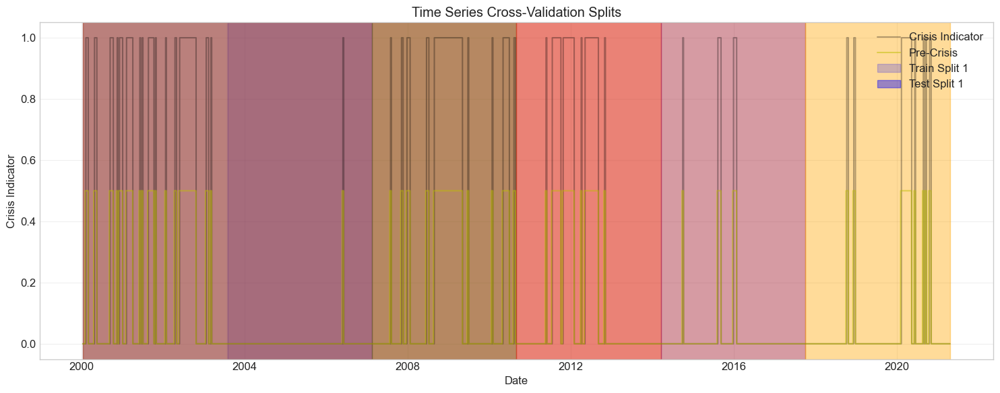

In [89]:
# 2. Create time series cross-validation framework

def create_ts_cv_splits(df, n_splits=5, early_window=4):
    """
    Create time series cross-validation splits with pre-crisis labeling
    
    Parameters:
    -----------
    df : pandas DataFrame
        Dataset with features and target
    n_splits : int
        Number of CV splits
    early_window : int
        Number of periods before crisis to mark as pre-crisis
    """
    # Ensure the dataframe is sorted by date
    df = df.sort_index()
    
    # Create TimeSeriesSplit object
    tscv = TimeSeriesSplit(n_splits=n_splits)
    
    # Get features and target
    X = df.drop(columns=['Y'])
    y = df['Y']
    
    # Create pre-crisis labels if not already present
    if 'pre_crisis' not in df.columns:
        print("Creating pre-crisis labels...")
        pre_crisis = np.zeros_like(y)
        for i in range(len(y) - early_window):
            if y.iloc[i] == 0 and y.iloc[i:i+early_window+1].sum() > 0:
                pre_crisis[i] = 1
        df['pre_crisis'] = pre_crisis
    
    # Create splits
    splits = []
    for train_idx, test_idx in tscv.split(X):
        # Get indices
        train_indices = X.index[train_idx]
        test_indices = X.index[test_idx]
        
        # Store split information
        splits.append({
            'train_indices': train_indices,
            'test_indices': test_indices,
            'train_start': train_indices[0],
            'train_end': train_indices[-1],
            'test_start': test_indices[0],
            'test_end': test_indices[-1],
            'train_size': len(train_indices),
            'test_size': len(test_indices),
            'train_crisis_rate': y.loc[train_indices].mean(),
            'test_crisis_rate': y.loc[test_indices].mean(),
            'train_precrisis_rate': df.loc[train_indices, 'pre_crisis'].mean() if 'pre_crisis' in df.columns else None,
            'test_precrisis_rate': df.loc[test_indices, 'pre_crisis'].mean() if 'pre_crisis' in df.columns else None
        })
    
    return splits

# Apply this to each feature set
cv_splits = {}
for name, df in feature_sets.items():
    if df is not None:
        cv_splits[name] = create_ts_cv_splits(df)
        
        # Print information about the splits
        print(f"\nTime series CV splits for {name} feature set:")
        for i, split in enumerate(cv_splits[name]):
            print(f"  Split {i+1}: Train {split['train_start']} to {split['train_end']} "
                 f"(n={split['train_size']}, crisis={split['train_crisis_rate']*100:.1f}%), "
                 f"Test {split['test_start']} to {split['test_end']} "
                 f"(n={split['test_size']}, crisis={split['test_crisis_rate']*100:.1f}%)")

# Visualize one of the splits
if len(cv_splits) > 0:
    # Take the first feature set
    first_set_name = list(cv_splits.keys())[0]
    first_set_splits = cv_splits[first_set_name]
    first_set_df = feature_sets[first_set_name]
    
    # Visualize the splits
    plt.figure(figsize=(15, 6))
    plt.plot(first_set_df.index, first_set_df['Y'], 'k-', alpha=0.3, label='Crisis Indicator')
    
    # Add pre-crisis periods if available
    if 'pre_crisis' in first_set_df.columns:
        plt.plot(first_set_df.index, first_set_df['pre_crisis'] * 0.5, 'y-', alpha=0.5, label='Pre-Crisis')
    
    colors = ['blue', 'green', 'red', 'purple', 'orange']
    
    for i, split in enumerate(first_set_splits):
        # Plot training periods
        plt.axvspan(split['train_start'], split['train_end'], alpha=0.2, color=colors[i % len(colors)], 
                   label=f'Train Split {i+1}' if i == 0 else None)
        
        # Plot test periods
        plt.axvspan(split['test_start'], split['test_end'], alpha=0.4, color=colors[i % len(colors)], 
                   label=f'Test Split {i+1}' if i == 0 else None)
    
    plt.legend()
    plt.title('Time Series Cross-Validation Splits')
    plt.xlabel('Date')
    plt.ylabel('Crisis Indicator')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

In [90]:
# 3. Define model evaluation functions with threshold optimization

def specificity_score(y_true, y_pred):
    """Calculate specificity (true negative rate)"""
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    return tn / (tn + fp) if (tn + fp) > 0 else 0

def find_optimal_threshold(y_true, y_prob, metric='f1'):
    """Find the probability threshold that maximizes a given metric"""
    thresholds = np.linspace(0.01, 0.99, 50)
    scores = []
    
    for threshold in thresholds:
        y_pred = (y_prob >= threshold).astype(int)
        if metric == 'f1':
            score = f1_score(y_true, y_pred, zero_division=0)
        elif metric == 'precision':
            score = precision_score(y_true, y_pred, zero_division=0)
        elif metric == 'recall':
            score = recall_score(y_true, y_pred, zero_division=0)
        elif metric == 'balanced_accuracy':
            spec = specificity_score(y_true, y_pred)
            rec = recall_score(y_true, y_pred, zero_division=0)
            score = (rec + spec) / 2
        scores.append(score)
    
    best_threshold = thresholds[np.argmax(scores)]
    best_score = np.max(scores)
    return best_threshold, best_score

def evaluate_early_warning(y_true, y_pred, y_prob, pre_crisis):
    """Evaluate model as an early warning system"""
    # If no pre-crisis labels, return None
    if pre_crisis is None or len(pre_crisis) == 0:
        return None
    
    # Calculate early warning metrics
    early_precision = precision_score(pre_crisis, y_pred, zero_division=0)
    early_recall = recall_score(pre_crisis, y_pred, zero_division=0)
    early_f1 = f1_score(pre_crisis, y_pred, zero_division=0)
    
    # Calculate AUC for pre-crisis if probabilities are available
    if y_prob is not None:
        try:
            early_auc = roc_auc_score(pre_crisis, y_prob)
        except:
            early_auc = None
    else:
        early_auc = None
    
    return {
        'early_precision': early_precision,
        'early_recall': early_recall,
        'early_f1': early_f1,
        'early_auc': early_auc
    }

def evaluate_model(model, X_train, y_train, X_test, y_test, model_name, pre_crisis_test=None, threshold=None):
    """
    Train and evaluate a model with comprehensive metrics
    
    Parameters:
    -----------
    model : sklearn-compatible model
        The model to evaluate
    X_train, y_train : training data and labels
    X_test, y_test : test data and labels
    model_name : str
        Name of the model
    pre_crisis_test : array-like or None
        Pre-crisis labels for test set
    threshold : float or None
        Probability threshold for classification, if None will be optimized
    """
    # Train model
    print(f"  Training {model_name}...")
    model.fit(X_train, y_train)
    
    # Get predictions
    if hasattr(model, 'predict_proba'):
        y_train_prob = model.predict_proba(X_train)[:, 1]
        y_prob = model.predict_proba(X_test)[:, 1]
        
        # Optimize threshold if not provided
        if threshold is None:
            print(f"  Optimizing decision threshold...")
            threshold, best_score = find_optimal_threshold(y_train, y_train_prob, metric='f1')
            print(f"  Optimal threshold: {threshold:.3f} (F1: {best_score:.3f})")
        
        y_pred = (y_prob >= threshold).astype(int)
    else:
        y_prob = None
        y_pred = model.predict(X_test)
        threshold = 0.5
    
    # Calculate metrics
    acc = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, zero_division=0)
    recall = recall_score(y_test, y_pred, zero_division=0)
    f1 = f1_score(y_test, y_pred, zero_division=0)
    spec = specificity_score(y_test, y_pred)
    balanced_acc = (recall + spec) / 2
    
    # ROC AUC (only if we have probabilities)
    auc = roc_auc_score(y_test, y_prob) if y_prob is not None else None
    
    # Average precision (PR AUC)
    avg_precision = average_precision_score(y_test, y_prob) if y_prob is not None else None
    
    # Confusion matrix
    cm = confusion_matrix(y_test, y_pred)
    
    # Early warning evaluation
    early_metrics = evaluate_early_warning(y_test, y_pred, y_prob, pre_crisis_test) if pre_crisis_test is not None else None
    
    # Return all metrics
    result = {
        'model_name': model_name,
        'threshold': threshold,
        'accuracy': acc,
        'precision': precision,
        'recall': recall,
        'specificity': spec,
        'balanced_accuracy': balanced_acc,
        'f1_score': f1,
        'roc_auc': auc,
        'avg_precision': avg_precision,
        'confusion_matrix': cm,
        'y_true': y_test,
        'y_pred': y_pred,
        'y_prob': y_prob
    }
    
    # Add early warning metrics if available
    if early_metrics:
        result.update(early_metrics)
        
    return result

def run_cv_evaluation(feature_set_name, df, cv_splits, models_dict, use_optimal_thresholds=True):
    """
    Run time series CV evaluation for a feature set with multiple models
    """
    results = {}
    
    # Get X and y
    X = df.drop(columns=['Y'] + (['pre_crisis'] if 'pre_crisis' in df.columns else []))
    y = df['Y']
    pre_crisis = df['pre_crisis'] if 'pre_crisis' in df.columns else None
    
    # Get optimal threshold if available
    default_threshold = thresholds.get(feature_set_name, 0.5) if use_optimal_thresholds else None
    
    # Initialize scaler
    scaler = StandardScaler()
    
    # Run for each split
    for i, split in enumerate(cv_splits):
        split_start_time = time.time()
        print(f"\nProcessing split {i+1}/{len(cv_splits)} for {feature_set_name}...")
        
        # Get train/test indices
        train_indices = split['train_indices']
        test_indices = split['test_indices']
        
        # Get train/test data
        X_train = X.loc[train_indices]
        y_train = y.loc[train_indices]
        X_test = X.loc[test_indices]
        y_test = y.loc[test_indices]
        
        # Get pre-crisis labels if available
        pre_crisis_train = pre_crisis.loc[train_indices] if pre_crisis is not None else None
        pre_crisis_test = pre_crisis.loc[test_indices] if pre_crisis is not None else None
        
        # Scale features
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)
        
        # Convert to dataframes to preserve column names
        X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns, index=X_train.index)
        X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns, index=X_test.index)
        
        # Evaluate each model
        split_results = {}
        for model_name, model in models_dict.items():
            model_start_time = time.time()
            print(f"  Evaluating {model_name}...")
            
            # Skip models that don't work with empty feature sets
            if X_train.shape[1] == 0 and model_name in ['XGBoost', 'LightGBM']:
                print(f"  Skipping {model_name} due to empty feature set")
                continue
                
            # Evaluate model with the same threshold for all splits
            try:
                eval_results = evaluate_model(
                    model, X_train_scaled, y_train, X_test_scaled, y_test, 
                    f"{model_name}_{feature_set_name}", pre_crisis_test, 
                    threshold=default_threshold
                )
                
                # Store results
                split_results[model_name] = eval_results
                print(f"  ✓ {model_name} evaluation completed in {time.time() - model_start_time:.2f}s "
                      f"(F1: {eval_results['f1_score']:.3f}, AUC: {eval_results['roc_auc']:.3f})")
                
                # If early warning metrics available, display them
                if 'early_f1' in eval_results:
                    print(f"    Early warning: F1={eval_results['early_f1']:.3f}, "
                          f"Recall={eval_results['early_recall']:.3f}")
                    
            except Exception as e:
                print(f"  ✗ Error evaluating {model_name}: {str(e)}")
        
        # Store all results for this split
        results[f"split_{i+1}"] = split_results
        print(f"✓ Split {i+1} completed in {time.time() - split_start_time:.2f}s")
    
    return results

In [91]:
# 4. Create models including ensembles
import time

def create_models(input_shape=None):
    """
    Create a dictionary of machine learning models to evaluate
    
    Parameters:
    input_shape : tuple or int
        The shape of input features (number of features) for deep learning models
    """
    models = {
        'LogisticRegression': LogisticRegression(max_iter=1000, C=0.1, class_weight='balanced', random_state=42),
        'RandomForest': RandomForestClassifier(n_estimators=100, max_depth=10, class_weight='balanced', random_state=42),
        'GradientBoosting': GradientBoostingClassifier(n_estimators=100, max_depth=5, random_state=42),
        'SVM': SVC(probability=True, class_weight='balanced', random_state=42),
    }
    
    # Add XGBoost and LightGBM if available
    try:
        models['XGBoost'] = xgb.XGBClassifier(
            n_estimators=100, max_depth=5, learning_rate=0.1,
            objective='binary:logistic', scale_pos_weight=5, random_state=42
        )
    except:
        print("XGBoost not available, skipping")
        
    try:
        models['LightGBM'] = lgb.LGBMClassifier(
            n_estimators=100, num_leaves=31, learning_rate=0.1,
            objective='binary', class_weight='balanced', random_state=42
        )
    except:
        print("LightGBM not available, skipping")
    
    # Add MLP only if we have enough features
    if input_shape and (isinstance(input_shape, int) and input_shape > 5 or 
                         isinstance(input_shape, tuple) and input_shape[0] > 5):
        models['MLP'] = MLPClassifier(hidden_layer_sizes=(50, 25), max_iter=500, random_state=42)
    
    # Add voting ensemble
    base_models = {
        'lr': models['LogisticRegression'],
        'rf': models['RandomForest'],
        'gb': models['GradientBoosting']
    }
    models['VotingEnsemble'] = VotingClassifier(estimators=list(base_models.items()), voting='soft')
    
    # Add stacking ensemble
    if 'XGBoost' in models:
        meta_model = models['XGBoost']
    else:
        meta_model = models['LogisticRegression']
        
    models['StackingEnsemble'] = StackingClassifier(
        estimators=[('lr', models['LogisticRegression']), 
                    ('rf', models['RandomForest']),
                    ('gb', models['GradientBoosting'])],
        final_estimator=meta_model,
        cv=3
    )
    
    # Add deep neural network using Keras if available
    try:
        import tensorflow as tf
        from tensorflow import keras
        from tensorflow.keras import layers
        from scikeras.wrappers import KerasClassifier
        
        # Make sure input_shape is provided
        if input_shape is None:
            print("Input shape not provided, skipping DeepNN")
            return models
            
        # Use a factory pattern to create the model building function
        def create_model_builder(input_dims):
            def build_model():
                model = keras.Sequential([
                    layers.Dense(64, activation='relu', input_shape=(input_dims,)),
                    layers.BatchNormalization(),
                    layers.Dropout(0.3),
                    layers.Dense(32, activation='relu'),
                    layers.BatchNormalization(),
                    layers.Dropout(0.3),
                    layers.Dense(16, activation='relu'),
                    layers.Dense(1, activation='sigmoid')
                ])
                model.compile(
                    optimizer=keras.optimizers.Adam(learning_rate=0.001),
                    loss='binary_crossentropy',
                    metrics=['accuracy', keras.metrics.AUC()]
                )
                return model
            return build_model
            
        # Get the input dimension (number of features)
        input_dims = input_shape
        if isinstance(input_shape, tuple):
            input_dims = input_shape[0]
            
        models['DeepNN'] = KerasClassifier(
            model=create_model_builder(input_dims),
            epochs=50,
            batch_size=32,
            verbose=0,
            class_weight={0:1, 1:5}
        )
        print("Deep Neural Network added to models")
    except Exception as e:
        print(f"Keras/TensorFlow not available, skipping DeepNN: {str(e)}")
    
    return models

In [92]:
# 5. Run evaluations across feature sets and models

# Overall start time
overall_start = time.time()

# Run CV evaluation for each feature set
all_results = {}
for name, df in feature_sets.items():
    if df is not None and name in cv_splits:
        set_start = time.time()
        print(f"\n{'='*50}")
        print(f"Running evaluation for {name} feature set...")
        
        # Get the number of features for this dataset (excluding date and target columns)
        X_cols = [col for col in df.columns if col not in ['Data', 'Y', 'pre_crisis']]
        num_features = len(X_cols)
        print(f"Feature set has {num_features} features")
        
        # Create models specifically for this feature set with proper input dimensions
        print(f"Creating models for {name} feature set...")
        feature_specific_models = create_models(input_shape=num_features)
        
        # Run evaluation with the feature-specific models
        all_results[name] = run_cv_evaluation(name, df, cv_splits[name], feature_specific_models)
        print(f"✓ Completed {name} feature set evaluation in {(time.time() - set_start)/60:.2f} minutes")
        print(f"{'='*50}")

print(f"\nAll evaluations completed in {(time.time() - overall_start)/60:.2f} minutes")


Running evaluation for statistical feature set...
Feature set has 30 features
Creating models for statistical feature set...
Deep Neural Network added to models

Processing split 1/5 for statistical...
  Evaluating LogisticRegression...
  Training LogisticRegression_statistical...
  ✓ LogisticRegression evaluation completed in 0.04s (F1: 0.000, AUC: 0.986)
    Early warning: F1=0.000, Recall=0.000
  Evaluating RandomForest...
  Training RandomForest_statistical...
  ✓ RandomForest evaluation completed in 0.27s (F1: 0.000, AUC: 0.842)
    Early warning: F1=0.000, Recall=0.000
  Evaluating GradientBoosting...
  Training GradientBoosting_statistical...
  ✓ GradientBoosting evaluation completed in 1.30s (F1: 0.000, AUC: 0.882)
    Early warning: F1=0.000, Recall=0.000
  Evaluating SVM...
  Training SVM_statistical...
  ✓ SVM evaluation completed in 0.20s (F1: 0.000, AUC: 0.893)
    Early warning: F1=0.000, Recall=0.000
  Evaluating XGBoost...
  Training XGBoost_statistical...
  ✓ XGBoost 


Model Performance Summary (Averaged across CV splits):
                               Model  F1_Score  Precision  Recall  \
15    LogisticRegression_statistical     0.394      0.539   0.361   
31      StackingEnsemble_statistical     0.389      0.473   0.463   
0                    DeepNN_combined     0.379      0.479   0.361   
18                 MLP_random_forest     0.368      0.411   0.486   
3                 DeepNN_statistical     0.365      0.395   0.456   
13            LogisticRegression_pca     0.364      0.313   0.750   
14  LogisticRegression_random_forest     0.360      0.644   0.290   
2               DeepNN_random_forest     0.354      0.514   0.349   
6     GradientBoosting_random_forest     0.335      0.552   0.247   
9                       LightGBM_pca     0.323      0.430   0.319   
29              StackingEnsemble_pca     0.319      0.240   0.746   
28         StackingEnsemble_combined     0.318      0.392   0.306   
12       LogisticRegression_combined     0.317 

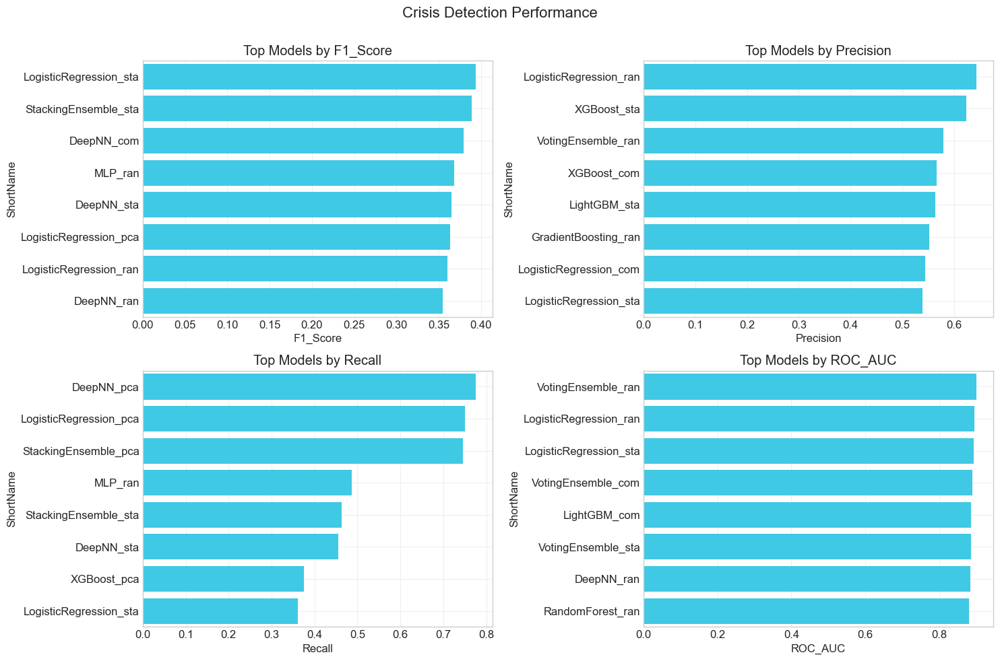

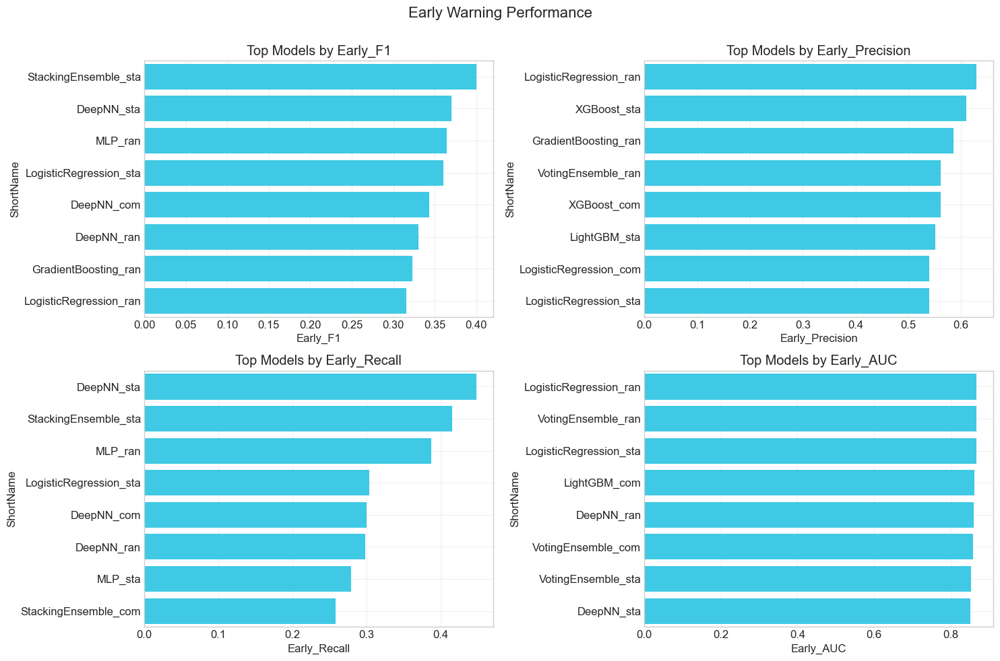

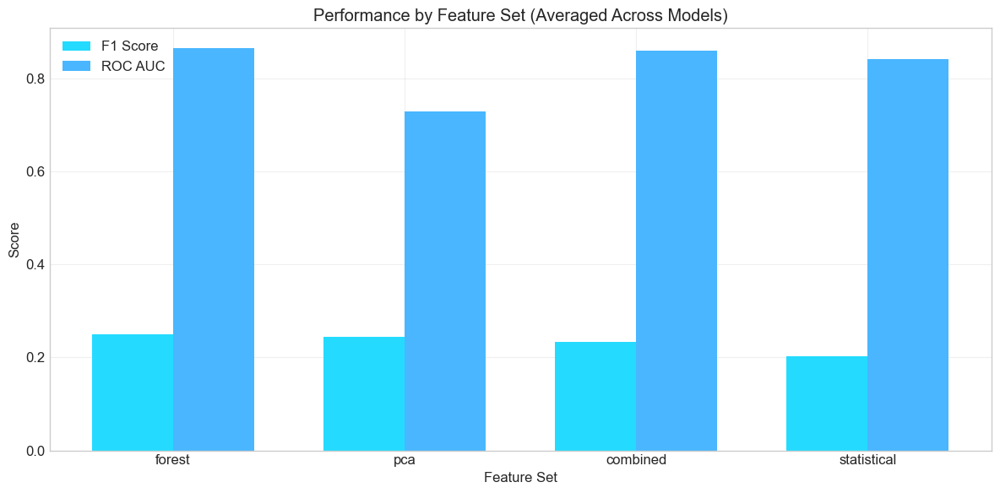

In [94]:
# 6. Aggregate and compare results with early warning metrics

def aggregate_cv_results(results):
    """
    Aggregate CV results across splits into a summary dataframe
    """
    # Initialize lists to store results
    model_names = []
    thresholds = []
    accuracies = []
    precisions = []
    recalls = []
    specificities = []
    f1_scores = []
    balanced_accs = []
    roc_aucs = []
    avg_precisions = []
    # Early warning metrics
    early_precisions = []
    early_recalls = []
    early_f1s = []
    early_aucs = []
    
    # Go through each feature set
    for feature_set, feature_results in results.items():
        # Go through each split
        for split, split_results in feature_results.items():
            # Go through each model
            for model_name, model_results in split_results.items():
                model_names.append(f"{model_name}_{feature_set}")
                thresholds.append(model_results.get('threshold', 0.5))
                accuracies.append(model_results['accuracy'])
                precisions.append(model_results['precision'])
                recalls.append(model_results['recall'])
                specificities.append(model_results.get('specificity', None))
                f1_scores.append(model_results['f1_score'])
                balanced_accs.append(model_results.get('balanced_accuracy', None))
                roc_aucs.append(model_results['roc_auc'])
                avg_precisions.append(model_results['avg_precision'])
                
                # Add early warning metrics if available
                early_precisions.append(model_results.get('early_precision', None))
                early_recalls.append(model_results.get('early_recall', None))
                early_f1s.append(model_results.get('early_f1', None))
                early_aucs.append(model_results.get('early_auc', None))
    
    # Create DataFrame
    results_df = pd.DataFrame({
        'Model': model_names,
        'Threshold': thresholds,
        'Accuracy': accuracies,
        'Precision': precisions,
        'Recall': recalls,
        'Specificity': specificities,
        'Balanced_Accuracy': balanced_accs,
        'F1_Score': f1_scores,
        'ROC_AUC': roc_aucs,
        'Avg_Precision': avg_precisions,
        'Early_Precision': early_precisions,
        'Early_Recall': early_recalls,
        'Early_F1': early_f1s,
        'Early_AUC': early_aucs
    })
    
    # Group by model and calculate mean metrics
    summary = results_df.groupby('Model').mean().reset_index()
    
    # Also calculate standard deviation for key metrics
    std_metrics = results_df.groupby('Model').std().reset_index()
    for metric in ['F1_Score', 'ROC_AUC', 'Early_F1']:
        if metric in std_metrics.columns:
            summary[f'{metric}_std'] = std_metrics[metric]
    
    # Sort by F1 score by default
    summary = summary.sort_values('F1_Score', ascending=False)
    
    return summary

# Aggregate results
summary_results = aggregate_cv_results(all_results)

# Display results
print("\nModel Performance Summary (Averaged across CV splits):")
display_cols = ['Model', 'F1_Score', 'Precision', 'Recall', 'Specificity', 
               'ROC_AUC', 'Early_F1', 'Early_Recall', 'Threshold']
print(summary_results[display_cols].round(3))

# Create visualizations for different metrics
def plot_performance_comparison(summary_results, metrics, title):
    """
    Create performance comparison plots across multiple metrics
    """
    plt.figure(figsize=(15, 10))
    
    for i, metric in enumerate(metrics):
        plt.subplot(2, 2, i+1)
        
        # Get top models by this metric (drop missing values)
        metric_data = summary_results.dropna(subset=[metric])
        top_models = metric_data.sort_values(metric, ascending=False).head(8)
        
        # Simplify model names for cleaner display
        top_models['ShortName'] = top_models['Model'].apply(
            lambda x: x.split('_')[0] + '_' + x.split('_')[1][:3])
        
        sns.barplot(x=metric, y='ShortName', data=top_models)
        plt.title(f'Top Models by {metric}')
        plt.grid(True, alpha=0.3)
    
    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.subplots_adjust(top=0.9)
    plt.show()

# Plot standard metrics
crisis_metrics = ['F1_Score', 'Precision', 'Recall', 'ROC_AUC']
plot_performance_comparison(summary_results, crisis_metrics, 'Crisis Detection Performance')

# Plot early warning metrics if available
if not summary_results['Early_F1'].isna().all():
    early_metrics = ['Early_F1', 'Early_Precision', 'Early_Recall', 'Early_AUC']
    plot_performance_comparison(summary_results, early_metrics, 'Early Warning Performance')

# Create a feature set comparison plot
def plot_feature_set_comparison(summary_results):
    """Compare performance across feature sets"""
    # Extract feature set from model name
    summary_results['Feature_Set'] = summary_results['Model'].apply(
        lambda x: x.split('_')[-1])
    
    # Extract model type from model name
    summary_results['Model_Type'] = summary_results['Model'].apply(
        lambda x: x.split('_')[0])
    
    # Calculate average performance by feature set
    feature_perf = summary_results.groupby('Feature_Set')[
        ['F1_Score', 'ROC_AUC', 'Early_F1']].mean().reset_index()
    
    # Plot comparison
    plt.figure(figsize=(12, 6))
    feature_perf = feature_perf.sort_values('F1_Score', ascending=False)
    
    # Plot F1 and AUC side by side
    x = np.arange(len(feature_perf))
    width = 0.35
    
    plt.bar(x - width/2, feature_perf['F1_Score'], width, label='F1 Score')
    plt.bar(x + width/2, feature_perf['ROC_AUC'], width, label='ROC AUC')
    
    plt.xlabel('Feature Set')
    plt.ylabel('Score')
    plt.title('Performance by Feature Set (Averaged Across Models)')
    plt.xticks(x, feature_perf['Feature_Set'])
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

# Plot feature set comparison
plot_feature_set_comparison(summary_results)

In [96]:
# 7. Detailed analysis of best-performing models

# Get best model for different metrics
best_f1_model = summary_results.loc[summary_results['F1_Score'].idxmax(), 'Model']
best_auc_model = summary_results.loc[summary_results['ROC_AUC'].idxmax(), 'Model']
best_early_model = summary_results.loc[summary_results['Early_F1'].dropna().idxmax() 
                                     if not summary_results['Early_F1'].isna().all() 
                                     else summary_results['F1_Score'].idxmax(), 'Model']

print(f"\nBest model by F1 Score: {best_f1_model}")
print(f"Best model by ROC AUC: {best_auc_model}")
print(f"Best model for Early Warning: {best_early_model}")

# Function to plot ROC and PR curves for best models
def plot_best_model_curves(results, model_name):
    """Plot ROC and PR curves for a model across all splits"""
    
    # Extract model name parts
    model_parts = model_name.split('_')
    model_type = model_parts[0]
    feature_set = '_'.join(model_parts[1:])
    
    plt.figure(figsize=(15, 6))
    
    # ROC Curve
    plt.subplot(1, 2, 1)
    for feature_set_name, feature_results in results.items():
        if feature_set == feature_set_name:
            for split, split_results in feature_results.items():
                if model_type in split_results:
                    model_result = split_results[model_type]
                    # Skip if no probability predictions
                    if model_result['y_prob'] is None:
                        continue
                    # Calculate ROC curve
                    from sklearn.metrics import roc_curve
                    fpr, tpr, _ = roc_curve(model_result['y_true'], model_result['y_prob'])
                    plt.plot(fpr, tpr, alpha=0.7, label=f"{split} (AUC={model_result['roc_auc']:.3f})")
    
    plt.plot([0, 1], [0, 1], 'k--', alpha=0.3)
    plt.xlim([0, 1])
    plt.ylim([0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curves - {model_name}')
    plt.legend(loc='lower right')
    plt.grid(True, alpha=0.3)
    
    # Precision-Recall Curve
    plt.subplot(1, 2, 2)
    for feature_set_name, feature_results in results.items():
        if feature_set == feature_set_name:
            for split, split_results in feature_results.items():
                if model_type in split_results:
                    model_result = split_results[model_type]
                    # Skip if no probability predictions
                    if model_result['y_prob'] is None:
                        continue
                    # Calculate PR curve
                    precision, recall, _ = precision_recall_curve(model_result['y_true'], model_result['y_prob'])
                    plt.plot(recall, precision, alpha=0.7, 
                             label=f"{split} (AP={model_result['avg_precision']:.3f})")
    
    plt.xlim([0, 1])
    plt.ylim([0, 1.05])
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f'Precision-Recall Curves - {model_name}')
    plt.legend(loc='lower left')
    plt.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()

# Plot crisis timeline with predictions
def plot_crisis_timeline_with_predictions(results, model_name):
    """Plot actual crises vs. predicted crises over time"""
    # Extract model name parts
    model_parts = model_name.split('_')
    model_type = model_parts[0]
    feature_set = '_'.join(model_parts[1:])
    
    # Find all predictions for this model across splits
    all_dates = []
    all_true = []
    all_pred = []
    all_prob = []
    all_pre_crisis = []
    
    for feature_set_name, feature_results in results.items():
        if feature_set == feature_set_name:
            for split, split_results in feature_results.items():
                if model_type in split_results:
                    model_result = split_results[model_type]
                    
                    # Get the test indices from the split
                    test_indices = cv_splits[feature_set][int(split.split('_')[1])-1]['test_indices']
                    
                    # Extend our collections
                    all_dates.extend(test_indices)
                    all_true.extend(model_result['y_true'])
                    all_pred.extend(model_result['y_pred'])
                    if model_result['y_prob'] is not None:
                        all_prob.extend(model_result['y_prob'])
                    
                    # Get pre-crisis if available
                    if 'pre_crisis' in feature_sets[feature_set].columns:
                        all_pre_crisis.extend(feature_sets[feature_set].loc[test_indices, 'pre_crisis'])
    
    # Sort everything by date
    sorted_indices = np.argsort(all_dates)
    all_dates = [all_dates[i] for i in sorted_indices]
    all_true = [all_true[i] for i in sorted_indices]
    all_pred = [all_pred[i] for i in sorted_indices]
    all_prob = [all_prob[i] for i in sorted_indices]


Best model by F1 Score: LogisticRegression_statistical
Best model by ROC AUC: VotingEnsemble_random_forest
Best model for Early Warning: StackingEnsemble_statistical



===== BEST F1 MODEL =====


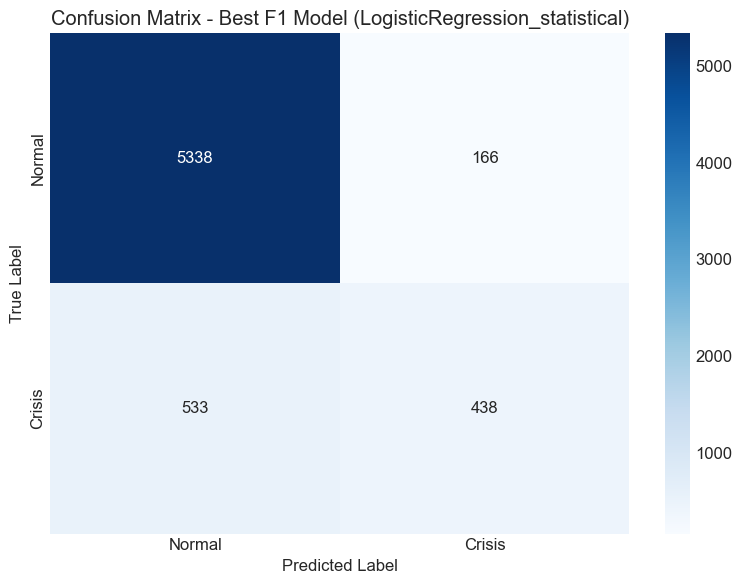


Classification Report - LogisticRegression_statistical:
              precision    recall  f1-score   support

      Normal       0.91      0.97      0.94      5504
      Crisis       0.73      0.45      0.56       971

    accuracy                           0.89      6475
   macro avg       0.82      0.71      0.75      6475
weighted avg       0.88      0.89      0.88      6475

Overall Metrics:
  Accuracy: 0.892
  Precision: 0.725
  Recall/Sensitivity: 0.451
  Specificity: 0.970
  F1 Score: 0.556
  False Alarm Rate: 0.030
  Miss Rate: 0.549
  ROC AUC: 0.857

===== BEST ROC AUC MODEL =====


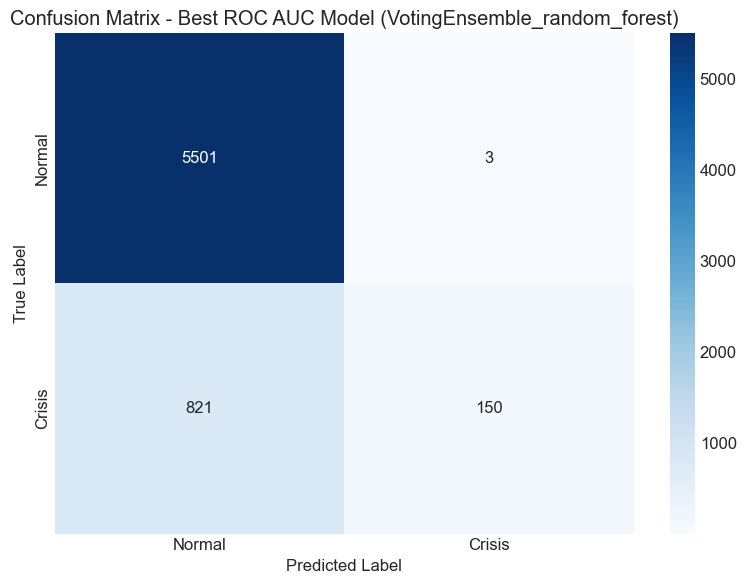


Classification Report - VotingEnsemble_random_forest:
              precision    recall  f1-score   support

      Normal       0.87      1.00      0.93      5504
      Crisis       0.98      0.15      0.27       971

    accuracy                           0.87      6475
   macro avg       0.93      0.58      0.60      6475
weighted avg       0.89      0.87      0.83      6475

Overall Metrics:
  Accuracy: 0.873
  Precision: 0.980
  Recall/Sensitivity: 0.154
  Specificity: 0.999
  F1 Score: 0.267
  False Alarm Rate: 0.001
  Miss Rate: 0.846
  ROC AUC: 0.887

===== BEST EARLY WARNING MODEL =====


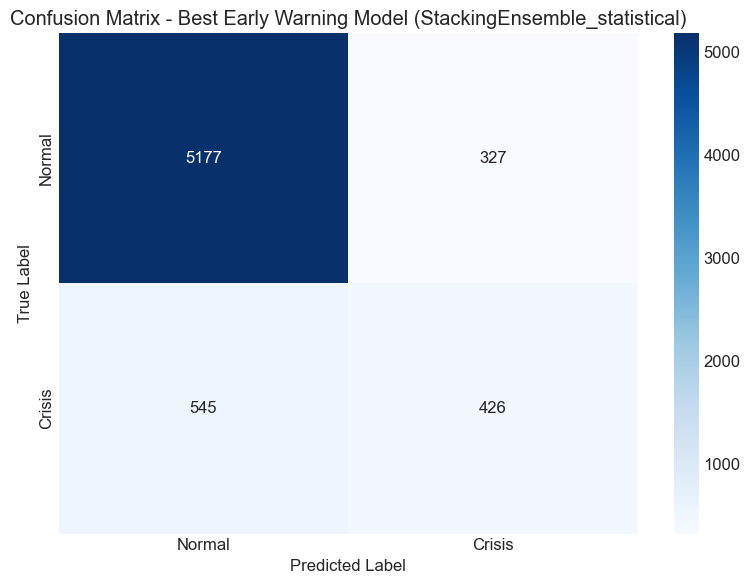


Classification Report - StackingEnsemble_statistical:
              precision    recall  f1-score   support

      Normal       0.90      0.94      0.92      5504
      Crisis       0.57      0.44      0.49       971

    accuracy                           0.87      6475
   macro avg       0.74      0.69      0.71      6475
weighted avg       0.85      0.87      0.86      6475

Overall Metrics:
  Accuracy: 0.865
  Precision: 0.566
  Recall/Sensitivity: 0.439
  Specificity: 0.941
  F1 Score: 0.494
  False Alarm Rate: 0.059
  Miss Rate: 0.561
  ROC AUC: 0.834

Best Models Comparison:
                                precision  recall  specificity     f1  \
model_name                                                              
LogisticRegression_statistical      0.725   0.451        0.970  0.556   
VotingEnsemble_random_forest        0.980   0.154        0.999  0.267   
StackingEnsemble_statistical        0.566   0.439        0.941  0.494   

                                false_alarm_

In [98]:
# 8. Confusion matrix and classification report for all best models

def analyze_best_model_predictions(results, model_name, title=None):
    """Analyze predictions of the best model across all splits"""
    
    # Extract model name parts
    model_parts = model_name.split('_')
    model_type = model_parts[0]
    feature_set = '_'.join(model_parts[1:])
    
    # Collect all test set predictions across splits
    all_true = []
    all_pred = []
    all_prob = []
    
    for feature_set_name, feature_results in results.items():
        if feature_set == feature_set_name:
            for split, split_results in feature_results.items():
                if model_type in split_results:
                    model_result = split_results[model_type]
                    all_true.extend(model_result['y_true'])
                    all_pred.extend(model_result['y_pred'])
                    if model_result['y_prob'] is not None:
                        all_prob.extend(model_result['y_prob'])
    
    if not title:
        title = f'Confusion Matrix - {model_name}'
    
    # Confusion Matrix
    cm = confusion_matrix(all_true, all_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
               xticklabels=['Normal', 'Crisis'],
               yticklabels=['Normal', 'Crisis'])
    plt.title(title)
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.tight_layout()
    plt.show()
    
    # Classification Report
    print(f"\nClassification Report - {model_name}:")
    print(classification_report(all_true, all_pred, target_names=['Normal', 'Crisis']))
    
    # Summary metrics
    tn, fp, fn, tp = cm.ravel()
    accuracy = (tp + tn) / (tp + tn + fp + fn)
    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0
    f1 = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
    
    print(f"Overall Metrics:")
    print(f"  Accuracy: {accuracy:.3f}")
    print(f"  Precision: {precision:.3f}")
    print(f"  Recall/Sensitivity: {recall:.3f}")
    print(f"  Specificity: {specificity:.3f}")
    print(f"  F1 Score: {f1:.3f}")
    print(f"  False Alarm Rate: {fp/(fp+tn):.3f}")
    print(f"  Miss Rate: {fn/(fn+tp):.3f}")
    
    # ROC AUC
    if len(all_prob) > 0:
        from sklearn.metrics import roc_auc_score
        auc = roc_auc_score(all_true, all_prob)
        print(f"  ROC AUC: {auc:.3f}")
    
    return {
        'model_name': model_name,
        'confusion_matrix': cm,
        'accuracy': accuracy,
        'precision': precision,
        'recall': recall,
        'specificity': specificity,
        'f1': f1,
        'false_alarm_rate': fp/(fp+tn),
        'miss_rate': fn/(fn+tp),
        'roc_auc': auc if len(all_prob) > 0 else None
    }

# Analyze predictions for all best models
print("\n===== BEST F1 MODEL =====")
best_f1_results = analyze_best_model_predictions(all_results, best_f1_model, 
                                              title=f'Confusion Matrix - Best F1 Model ({best_f1_model})')

print("\n===== BEST ROC AUC MODEL =====")
best_auc_results = analyze_best_model_predictions(all_results, best_auc_model, 
                                                title=f'Confusion Matrix - Best ROC AUC Model ({best_auc_model})')

print("\n===== BEST EARLY WARNING MODEL =====")
best_early_results = analyze_best_model_predictions(all_results, best_early_model, 
                                                  title=f'Confusion Matrix - Best Early Warning Model ({best_early_model})')

# Compare the three best models
best_models_comparison = pd.DataFrame([
    best_f1_results,
    best_auc_results,
    best_early_results
])

# Display comparison table
print("\nBest Models Comparison:")
comparison_metrics = ['model_name', 'precision', 'recall', 'specificity', 'f1', 'false_alarm_rate', 'miss_rate', 'roc_auc']
print(best_models_comparison[comparison_metrics].set_index('model_name').round(3))


===== FEATURE IMPORTANCE: BEST F1 MODEL =====
Feature importance not directly available for LogisticRegression


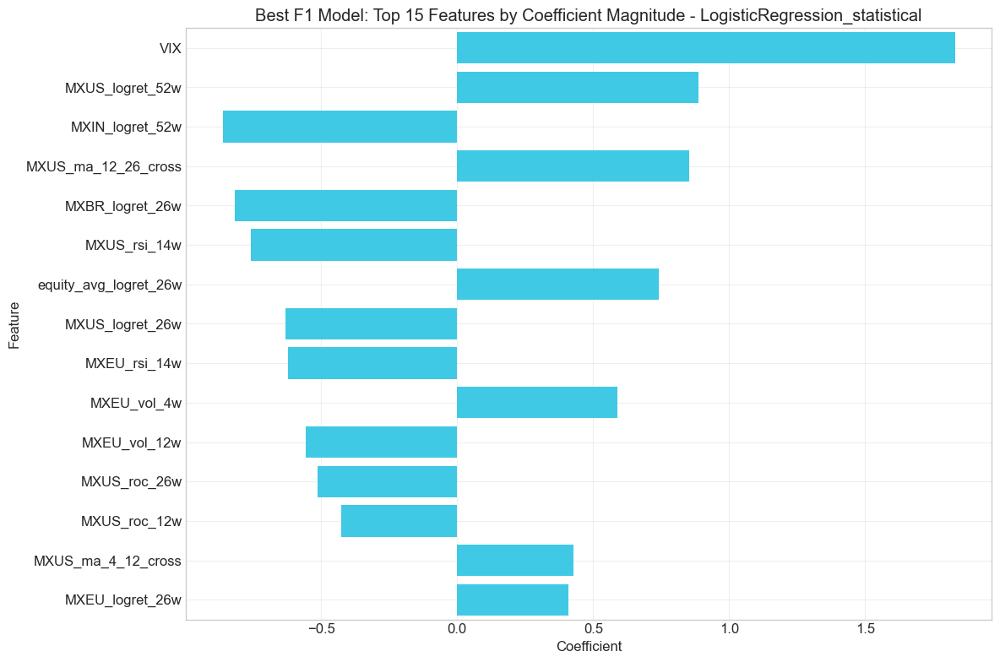


===== FEATURE IMPORTANCE: BEST ROC AUC MODEL =====
Using RandomForest to approximate feature importance for VotingEnsemble


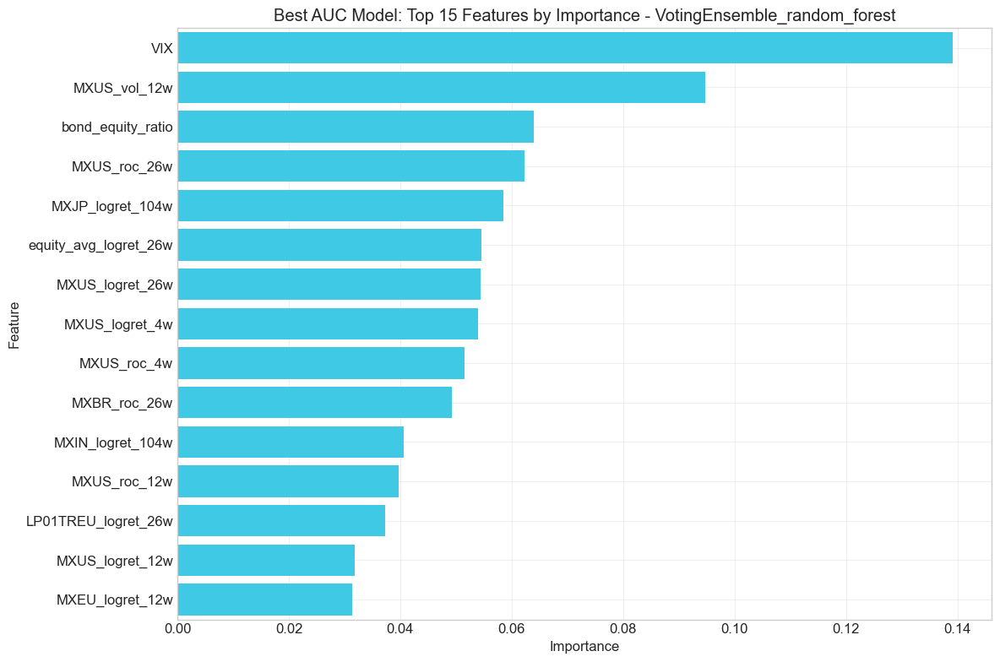


Top 15 features by importance for VotingEnsemble_random_forest:
                  Feature  Importance
0                     VIX    0.139157
14           MXUS_vol_12w    0.094672
1       bond_equity_ratio    0.063912
13           MXUS_roc_26w    0.062271
12       MXJP_logret_104w    0.058560
18  equity_avg_logret_26w    0.054512
2         MXUS_logret_26w    0.054414
5          MXUS_logret_4w    0.053887
6             MXUS_roc_4w    0.051524
19           MXBR_roc_26w    0.049302
11       MXIN_logret_104w    0.040548
9            MXUS_roc_12w    0.039632
8     LP01TREU_logret_26w    0.037276
10        MXUS_logret_12w    0.031837
3         MXEU_logret_12w    0.031309

===== FEATURE IMPORTANCE: BEST EARLY WARNING MODEL =====
Using RandomForest to approximate feature importance for StackingEnsemble


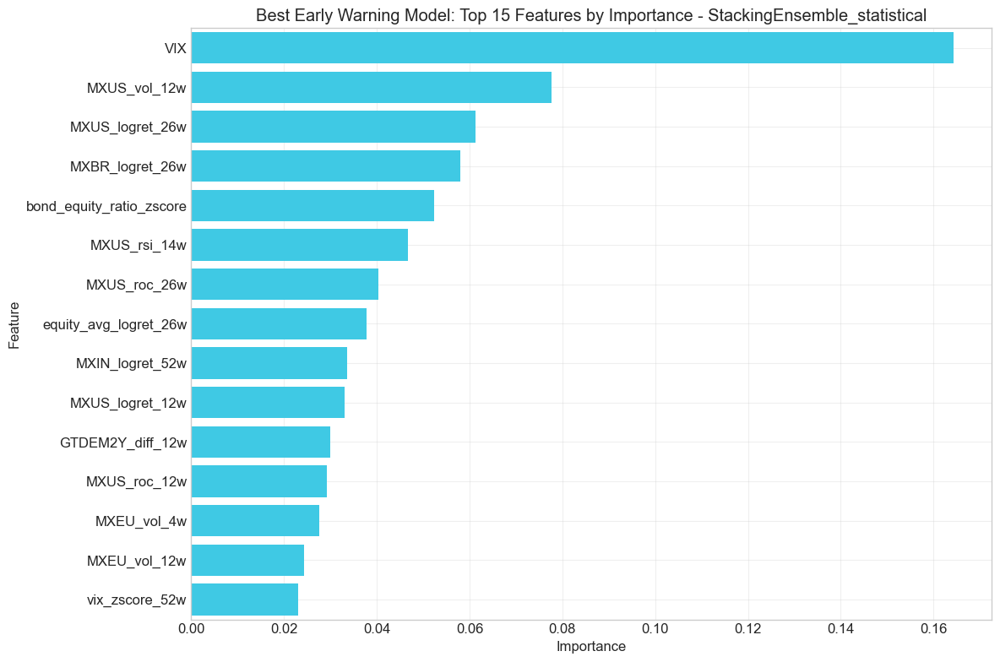


Top 15 features by importance for StackingEnsemble_statistical:
                     Feature  Importance
0                        VIX    0.164300
8               MXUS_vol_12w    0.077706
1            MXUS_logret_26w    0.061338
17           MXBR_logret_26w    0.057950
11  bond_equity_ratio_zscore    0.052365
12              MXUS_rsi_14w    0.046623
4               MXUS_roc_26w    0.040317
3      equity_avg_logret_26w    0.037870
14           MXIN_logret_52w    0.033556
6            MXUS_logret_12w    0.033128
26          GTDEM2Y_diff_12w    0.029918
9               MXUS_roc_12w    0.029276
24               MXEU_vol_4w    0.027541
16              MXEU_vol_12w    0.024405
28            vix_zscore_52w    0.023022

Top 15 Features by Average Rank Across Best Models:


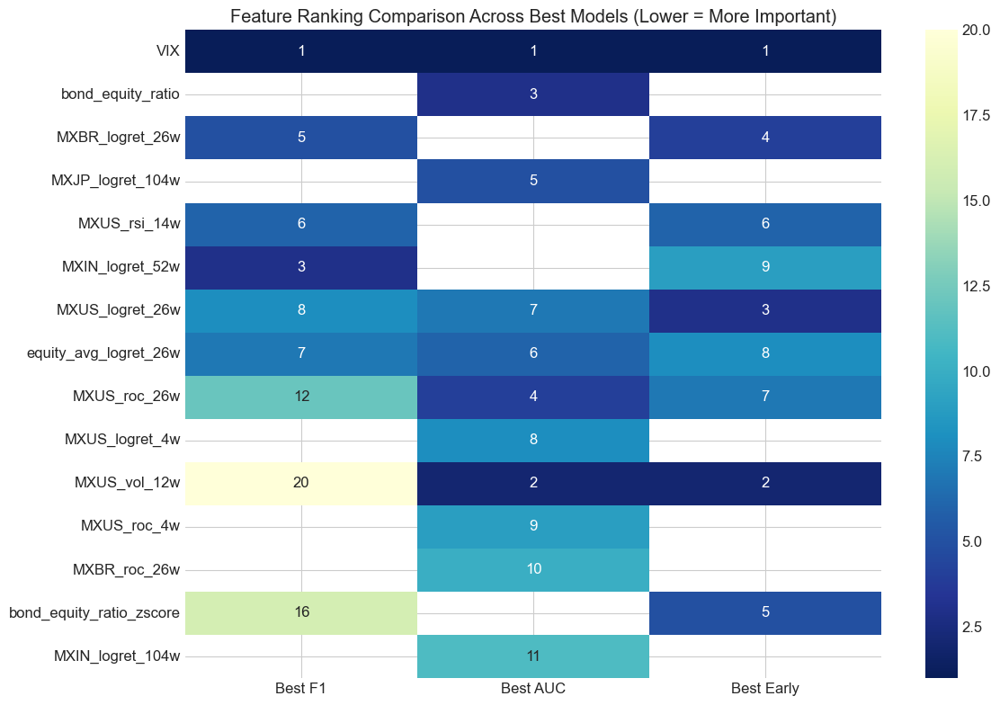

In [99]:
# 9. Feature importance analysis for best models

def analyze_feature_importance(results, model_name, title_prefix=""):
    """Analyze feature importance for the best model"""
    
    # Extract model name parts
    model_parts = model_name.split('_')
    model_type = model_parts[0]
    feature_set = '_'.join(model_parts[1:])
    
    # Check if feature set exists
    if feature_set not in feature_sets:
        print(f"Feature set {feature_set} not found")
        return None
    
    # Skip if we have pre_crisis in the columns
    drop_cols = ['Y'] + (['pre_crisis'] if 'pre_crisis' in feature_sets[feature_set].columns else [])
    
    # Get feature names
    feature_names = feature_sets[feature_set].drop(columns=drop_cols).columns
    
    # Check if model supports feature importance
    importance_supported = model_type in ['RandomForest', 'GradientBoosting', 'XGBoost', 'LightGBM', 'VotingEnsemble', 'StackingEnsemble']
    
    if not importance_supported:
        print(f"Feature importance not directly available for {model_type}")
        
        # For logistic regression, we can check coefficients
        if model_type == 'LogisticRegression':
            # Create and train a new model on the full dataset
            X = feature_sets[feature_set].drop(columns=drop_cols)
            y = feature_sets[feature_set]['Y']
            
            scaler = StandardScaler()
            X_scaled = scaler.fit_transform(X)
            
            model = LogisticRegression(max_iter=1000, C=0.1, class_weight='balanced', random_state=42)
            model.fit(X_scaled, y)
            
            # Get coefficients
            coefs = pd.DataFrame({
                'Feature': feature_names,
                'Coefficient': model.coef_[0]
            })
            coefs['Abs_Coefficient'] = coefs['Coefficient'].abs()
            coefs = coefs.sort_values('Abs_Coefficient', ascending=False)
            
            # Plot coefficients
            plt.figure(figsize=(12, 8))
            sns.barplot(x='Coefficient', y='Feature', data=coefs.head(15))
            title = f'{title_prefix}Top 15 Features by Coefficient Magnitude - {model_name}'
            plt.title(title)
            plt.grid(True, alpha=0.3)
            plt.tight_layout()
            plt.show()
            
            return coefs
        elif model_type == 'SVM':
            print("For SVM, feature importance can be approximated using permutation importance")
            # Use permutation importance for SVM
            X = feature_sets[feature_set].drop(columns=drop_cols)
            y = feature_sets[feature_set]['Y']
            
            scaler = StandardScaler()
            X_scaled = scaler.fit_transform(X)
            X_scaled = pd.DataFrame(X_scaled, columns=X.columns)
            
            from sklearn.inspection import permutation_importance
            model = SVC(probability=True, class_weight='balanced', random_state=42)
            model.fit(X_scaled, y)
            
            # Calculate permutation importance
            r = permutation_importance(model, X_scaled, y, n_repeats=10, random_state=42)
            importances = pd.DataFrame({
                'Feature': feature_names,
                'Importance': r.importances_mean
            })
            importances = importances.sort_values('Importance', ascending=False)
            
            plt.figure(figsize=(12, 8))
            sns.barplot(x='Importance', y='Feature', data=importances.head(15))
            title = f'{title_prefix}Top 15 Features by Permutation Importance - {model_name}'
            plt.title(title)
            plt.grid(True, alpha=0.3)
            plt.tight_layout()
            plt.show()
            
            return importances
        elif model_type == 'MLP':
            print("Neural network feature importance is not straightforward to interpret")
            return None
    
    # For tree-based models, create and train a new model on the full dataset
    X = feature_sets[feature_set].drop(columns=drop_cols)
    y = feature_sets[feature_set]['Y']
    
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    X_scaled = pd.DataFrame(X_scaled, columns=X.columns)
    
    if model_type == 'RandomForest':
        model = RandomForestClassifier(n_estimators=100, max_depth=10, class_weight='balanced', random_state=42)
    elif model_type == 'GradientBoosting':
        model = GradientBoostingClassifier(n_estimators=100, max_depth=5, random_state=42)
    elif model_type == 'XGBoost':
        model = xgb.XGBClassifier(n_estimators=100, max_depth=5, learning_rate=0.1,
                                objective='binary:logistic', scale_pos_weight=5, random_state=42)
    elif model_type == 'LightGBM':
        model = lgb.LGBMClassifier(n_estimators=100, num_leaves=31, learning_rate=0.1,
                                  objective='binary', class_weight='balanced', random_state=42)
    elif model_type in ['VotingEnsemble', 'StackingEnsemble']:
        # For ensembles, use Random Forest to approximate feature importance
        model = RandomForestClassifier(n_estimators=100, max_depth=10, class_weight='balanced', random_state=42)
        print(f"Using RandomForest to approximate feature importance for {model_type}")
    
    model.fit(X_scaled, y)
    
    # Get feature importance
    if hasattr(model, 'feature_importances_'):
        importances = pd.DataFrame({
            'Feature': feature_names,
            'Importance': model.feature_importances_
        })
        importances = importances.sort_values('Importance', ascending=False)
        
        # Plot feature importance
        plt.figure(figsize=(12, 8))
        sns.barplot(x='Importance', y='Feature', data=importances.head(15))
        title = f'{title_prefix}Top 15 Features by Importance - {model_name}'
        plt.title(title)
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()
        
        print(f"\nTop 15 features by importance for {model_name}:")
        print(importances.head(15))
        
        return importances
    else:
        print(f"Feature importance not available for this model")
        return None

# Analyze feature importance for all best models
print("\n===== FEATURE IMPORTANCE: BEST F1 MODEL =====")
f1_importances = analyze_feature_importance(all_results, best_f1_model, "Best F1 Model: ")

print("\n===== FEATURE IMPORTANCE: BEST ROC AUC MODEL =====")
auc_importances = analyze_feature_importance(all_results, best_auc_model, "Best AUC Model: ")

print("\n===== FEATURE IMPORTANCE: BEST EARLY WARNING MODEL =====")
early_importances = analyze_feature_importance(all_results, best_early_model, "Best Early Warning Model: ")

# Compare top features across models
def compare_feature_rankings(importance_dfs, model_names):
    """Compare feature rankings across different models"""
    if any(df is None for df in importance_dfs):
        print("Cannot compare feature rankings because some models don't have feature importance")
        return
    
    # Prepare ranking dataframe
    feature_ranks = {}
    all_features = set()
    
    for i, df in enumerate(importance_dfs):
        if df is not None:
            model_name = model_names[i]
            ranked_features = df.sort_values('Importance' if 'Importance' in df.columns else 'Abs_Coefficient', 
                                           ascending=False)['Feature'].tolist()
            feature_ranks[model_name] = {feat: rank+1 for rank, feat in enumerate(ranked_features)}
            all_features.update(ranked_features)
    
    # Create ranking comparison dataframe
    rank_df = pd.DataFrame(index=sorted(all_features))
    
    for model_name, ranks in feature_ranks.items():
        rank_df[model_name] = rank_df.index.map(lambda x: ranks.get(x, float('nan')))
    
    # Sort by average rank
    rank_df['Avg_Rank'] = rank_df.mean(axis=1)
    rank_df = rank_df.sort_values('Avg_Rank')
    
    # Display top features by average rank
    print("\nTop 15 Features by Average Rank Across Best Models:")
    top_shared_features = rank_df.head(15).drop(columns=['Avg_Rank'])
    
    # Map ranks to colors (lower rank = more intense color)
    plt.figure(figsize=(12, 8))
    ax = sns.heatmap(top_shared_features, cmap='YlGnBu_r', annot=True, fmt='.0f')
    plt.title('Feature Ranking Comparison Across Best Models (Lower = More Important)')
    plt.tight_layout()
    plt.show()
    
    return rank_df

# Compare feature rankings if we have at least two sets of importance values
importance_dfs = [f1_importances, auc_importances, early_importances]
valid_dfs = [df for df in importance_dfs if df is not None]

if len(valid_dfs) >= 2:
    model_names = [
        "Best F1" if f1_importances is not None else None,
        "Best AUC" if auc_importances is not None else None,
        "Best Early" if early_importances is not None else None
    ]
    model_names = [name for name in model_names if name is not None]
    
    compare_feature_rankings(valid_dfs, model_names)

Creating precision-focused dynamic weighted ensemble from 3 models: ['LogisticRegression_statistical', 'VotingEnsemble_random_forest', 'StackingEnsemble_statistical']
Using prediction threshold of 0.7 for high precision
Training LogisticRegression on statistical feature set...
Training VotingEnsemble on random_forest feature set...
Training StackingEnsemble on statistical feature set...

Evaluating precision-focused dynamic weighted ensemble with walk-forward validation...


Walk-forward evaluation:   0%|          | 0/7651 [00:00<?, ?it/s]

Updated weights at 2000-07-08 00:00:00: [0.31113211 0.35307698 0.33579092]
Updated weights at 2000-07-09 00:00:00: [0.3058015  0.35640092 0.33779758]
Updated weights at 2000-07-10 00:00:00: [0.29730839 0.36104724 0.34164437]
Updated weights at 2000-07-11 00:00:00: [0.2818756  0.36788779 0.35023661]
Updated weights at 2000-07-12 00:00:00: [0.36766877 0.07053894 0.56179229]
Updated weights at 2000-07-13 00:00:00: [0.09528901 0.10944085 0.79527014]
Updated weights at 2000-07-14 00:00:00: [0.10639084 0.13077207 0.76283709]
Updated weights at 2000-07-15 00:00:00: [0.33333333 0.33333333 0.33333333]
Updated weights at 2000-07-16 00:00:00: [0.33333333 0.33333333 0.33333333]
Updated weights at 2000-07-17 00:00:00: [0.33333333 0.33333333 0.33333333]
Updated weights at 2000-07-18 00:00:00: [0.33333333 0.33333333 0.33333333]
Updated weights at 2000-07-19 00:00:00: [0.33333333 0.33333333 0.33333333]
Updated weights at 2000-07-20 00:00:00: [0.33333333 0.33333333 0.33333333]
Updated weights at 2000-0

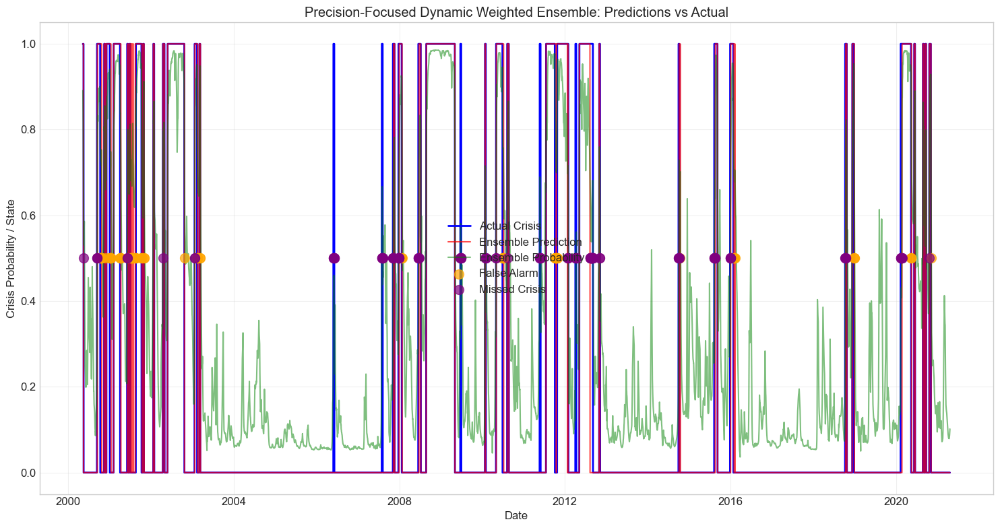

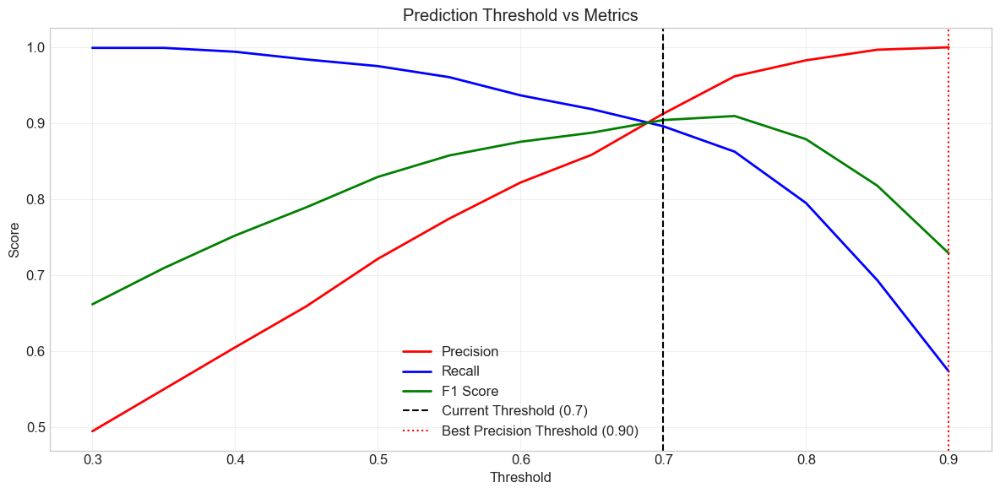


Optimal threshold for maximum precision: 0.90
Precision at this threshold: 1.000
Recall at this threshold: 0.573
F1 at this threshold: 0.729


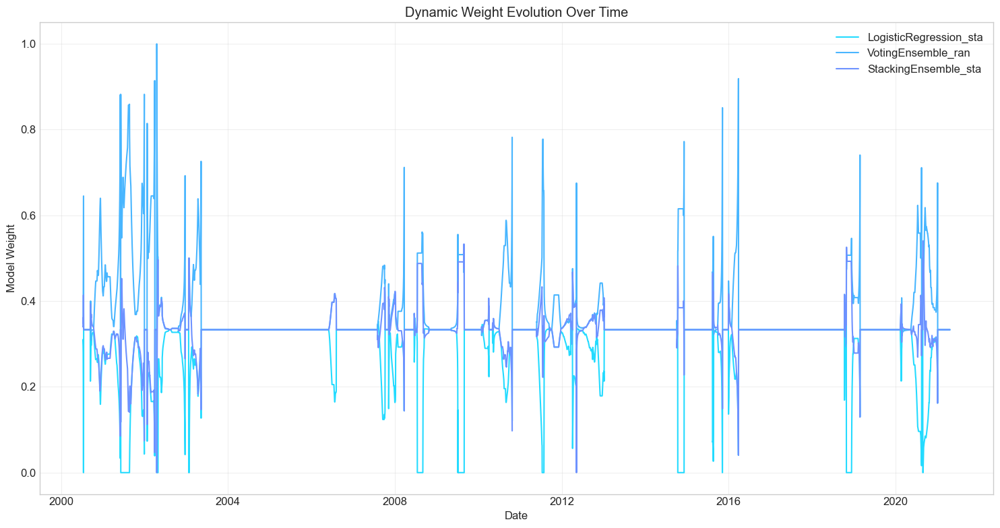

Precision-focused dynamic weighted ensemble saved to 'precision_dynamic_weighted_ensemble.pkl'


In [106]:
# 10. Dynamic Weighted Ensemble of Best Models (Precision-Focused)

# Define the DynamicWeightedEnsemble class outside the function so it can be pickled
class DynamicWeightedEnsemble:
    def __init__(self, base_models, window_size=60, initial_weights=None, prediction_threshold=0.7):
        self.base_models = base_models
        self.window_size = window_size
        self.performance_history = []
        self.prediction_threshold = prediction_threshold
        
        # Initialize with equal weights if not provided
        if initial_weights is None:
            self.weights = np.ones(len(base_models)) / len(base_models)
        else:
            self.weights = initial_weights
            
        # Track dates and actual outcomes
        self.dates = []
        self.true_outcomes = []
        self.model_predictions = []
        
    def update_weights(self, date, y_true):
        """Update weights with strong focus on precision"""
        # Skip if we don't have enough history
        if len(self.performance_history) < self.window_size:
            return
            
        # Get recent performance for each model
        recent_history = self.performance_history[-self.window_size:]
        model_scores = np.zeros(len(self.base_models))
        
        for i, model in enumerate(self.base_models):
            # Get predictions and actual values
            y_pred = [history['predictions'][i] for history in recent_history]
            y_actual = [history['actual'] for history in recent_history]
            y_probs = [history['probabilities'][i] for history in recent_history]
            
            # Calculate precision (heavily weighted)
            precision_val = 0
            f1_val = 0
            auc_val = 0.5
            
            if sum(y_pred) > 0:
                precision_val = precision_score(y_actual, y_pred, zero_division=0)
                
            if sum(y_pred) > 0 and sum(y_actual) > 0:
                f1_val = f1_score(y_actual, y_pred, zero_division=0)
                
            if len(set(y_actual)) > 1:
                try:
                    auc_val = roc_auc_score(y_actual, y_probs)
                except:
                    pass
            
            # Heavily weight precision (70%)
            model_scores[i] = 0.70 * precision_val + 0.20 * f1_val + 0.10 * auc_val
        
        # Normalize scores
        if np.sum(model_scores) > 0:
            self.weights = model_scores / np.sum(model_scores)
        else:
            # Equal weights if all models perform poorly
            self.weights = np.ones(len(self.base_models)) / len(self.base_models)
            
        print(f"Updated weights at {date}: {self.weights}")
            
    def predict_proba(self, X_dict, date=None):
        """
        Get weighted probability prediction
        
        Parameters:
        -----------
        X_dict : dict of dataframes
            Dictionary of feature dataframes for each feature set
        """
        probabilities = []
        
        # Get probabilities from each model
        for i, model_info in enumerate(self.base_models):
            # Extract model components
            model = model_info['model']
            scaler = model_info['scaler']
            features = model_info['features']
            feature_set = model_info['details']['feature_set']
            
            # Get the right feature set for this model
            if feature_set in X_dict:
                # Ensure we have all required features
                model_X = X_dict[feature_set]
                
                # Check if all required features are present
                missing_features = [f for f in features if f not in model_X.columns]
                if missing_features:
                    print(f"Warning: Missing features for {model_info['details']['model_type']} model: {missing_features}")
                    # Use a default probability
                    probabilities.append(0.5)
                    continue
                
                # Select only the required features
                model_X = model_X[features]
                model_X_scaled = scaler.transform(model_X)
                
                # Get probabilities
                if hasattr(model, 'predict_proba'):
                    prob = model.predict_proba(model_X_scaled)[:, 1]
                else:
                    # For models without predict_proba
                    pred = model.predict(model_X_scaled)
                    prob = pred.astype(float)
                    
                probabilities.append(prob[0])
            else:
                print(f"Warning: Feature set {feature_set} not available for prediction")
                # Use a default probability
                probabilities.append(0.5)
        
        # Combine with current weights
        weighted_prob = 0
        for i in range(len(self.base_models)):
            weighted_prob += probabilities[i] * self.weights[i]
            
        return np.array([weighted_prob])
        
    def predict(self, X_dict, date=None, threshold=None):
        """Get binary predictions with higher threshold for better precision"""
        if threshold is None:
            threshold = self.prediction_threshold
            
        probs = self.predict_proba(X_dict, date)
        return (probs >= threshold).astype(int)
        
    def update_history(self, date, X_dict, y_true):
        """Update performance history after making a prediction"""
        probabilities = []
        
        for i, model_info in enumerate(self.base_models):
            model = model_info['model']
            scaler = model_info['scaler']
            features = model_info['features']
            feature_set = model_info['details']['feature_set']
            
            # Get the right feature set for this model
            if feature_set in X_dict:
                # Check if all required features are present
                model_X = X_dict[feature_set]
                missing_features = [f for f in features if f not in model_X.columns]
                
                if missing_features:
                    print(f"Warning: Missing features for history update: {missing_features}")
                    probabilities.append(0.5)
                    continue
                
                # Select only the required features
                model_X = model_X[features]
                model_X_scaled = scaler.transform(model_X)
                
                if hasattr(model, 'predict_proba'):
                    prob = model.predict_proba(model_X_scaled)[:, 1]
                else:
                    pred = model.predict(model_X_scaled)
                    prob = pred.astype(float)
                    
                probabilities.append(float(prob[0]))
            else:
                print(f"Warning: Feature set {feature_set} not available for history update")
                probabilities.append(0.5)
        
        # Record this prediction
        self.performance_history.append({
            'date': date,
            'actual': float(y_true),
            'probabilities': probabilities,
            'predictions': [p > self.prediction_threshold for p in probabilities]  # Use higher threshold
        })
        
        # Update weights based on recent performance
        self.update_weights(date, y_true)


def create_dynamic_weighted_ensemble(results, best_models, feature_sets, window_size=60, prediction_threshold=0.7):
    """
    Create a dynamic weighted ensemble that adjusts weights based on recent performance
    with high focus on precision
    """
    print(f"Creating precision-focused dynamic weighted ensemble from {len(best_models)} models: {best_models}")
    print(f"Using prediction threshold of {prediction_threshold} for high precision")
    
    # Extract model details
    model_details = []
    for model_name in best_models:
        parts = model_name.split('_')
        model_type = parts[0]
        feature_set = '_'.join(parts[1:])
        
        model_details.append({
            'full_name': model_name,
            'model_type': model_type,
            'feature_set': feature_set
        })
    
    # Train new instances of each model on the full dataset
    trained_models = []
    for details in model_details:
        model_type = details['model_type']
        feature_set = details['feature_set']
        
        # Skip if feature set doesn't exist
        if feature_set not in feature_sets:
            print(f"Feature set {feature_set} not found, skipping {details['full_name']}")
            continue
            
        # Get feature data (excluding target and pre-crisis)
        drop_cols = ['Y'] + (['pre_crisis'] if 'pre_crisis' in feature_sets[feature_set].columns else [])
        X = feature_sets[feature_set].drop(columns=drop_cols)
        y = feature_sets[feature_set]['Y']
        
        # Create and train new model with precision focus
        if model_type == 'LogisticRegression':
            # Higher C value for less regularization, helps improve precision
            model = LogisticRegression(max_iter=1000, C=0.2, class_weight={0:1, 1:5}, random_state=42)
        elif model_type == 'RandomForest':
            # Increase min_samples_leaf to reduce false positives
            model = RandomForestClassifier(n_estimators=100, max_depth=10, min_samples_leaf=5, 
                                          class_weight={0:1, 1:5}, random_state=42)
        elif model_type == 'GradientBoosting':
            model = GradientBoostingClassifier(n_estimators=100, max_depth=5, random_state=42)
        elif model_type == 'XGBoost':
            # Increase scale_pos_weight to focus on positive class
            model = xgb.XGBClassifier(n_estimators=100, max_depth=5, scale_pos_weight=8, random_state=42)
        elif model_type == 'LightGBM':
            model = lgb.LGBMClassifier(n_estimators=100, class_weight={0:1, 1:5}, random_state=42)
        elif model_type == 'SVM':
            model = SVC(probability=True, class_weight={0:1, 1:5}, random_state=42)
        elif model_type == 'VotingEnsemble':
            # Create a new voting ensemble
            base_models = {
                'lr': LogisticRegression(max_iter=1000, C=0.2, class_weight={0:1, 1:5}, random_state=42),
                'rf': RandomForestClassifier(n_estimators=100, max_depth=10, min_samples_leaf=5, 
                                           class_weight={0:1, 1:5}, random_state=42),
                'gb': GradientBoostingClassifier(n_estimators=100, max_depth=5, random_state=42)
            }
            model = VotingClassifier(estimators=list(base_models.items()), voting='soft')
        elif model_type == 'StackingEnsemble':
            # Create a new stacking ensemble
            base_estimators = [
                ('lr', LogisticRegression(max_iter=1000, C=0.2, class_weight={0:1, 1:5}, random_state=42)),
                ('rf', RandomForestClassifier(n_estimators=100, max_depth=10, min_samples_leaf=5, 
                                            class_weight={0:1, 1:5}, random_state=42)),
                ('gb', GradientBoostingClassifier(n_estimators=100, max_depth=5, random_state=42))
            ]
            meta_model = LogisticRegression(class_weight={0:1, 1:5})
            model = StackingClassifier(estimators=base_estimators, final_estimator=meta_model, cv=3)
        else:
            print(f"Model type {model_type} not supported for ensemble, skipping")
            continue
            
        # Scale features
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)
        X_scaled = pd.DataFrame(X_scaled, columns=X.columns, index=X.index)
        
        # Train model
        print(f"Training {model_type} on {feature_set} feature set...")
        model.fit(X_scaled, y)
        
        # Add to list of trained models
        trained_models.append({
            'details': details,
            'model': model,
            'scaler': scaler,
            'features': X.columns.tolist()
        })
        
    if not trained_models:
        print("No models could be trained for ensemble")
        return None
    
    # Create the ensemble
    ensemble = DynamicWeightedEnsemble(trained_models, window_size=window_size, prediction_threshold=prediction_threshold)
    
    # Evaluate the ensemble with walk-forward validation
    print("\nEvaluating precision-focused dynamic weighted ensemble with walk-forward validation...")
    
    # Choose a feature set to use for evaluation dates (any will do)
    eval_feature_set = model_details[0]['feature_set']
    eval_dates = feature_sets[eval_feature_set].index
    y_true = feature_sets[eval_feature_set]['Y']
    
    # Initialize prediction arrays
    ensemble_predictions = np.zeros(len(eval_dates))
    ensemble_probabilities = np.zeros(len(eval_dates))
    
    # Use walk-forward validation
    train_size = window_size * 2  # Initial training window
    
    # Make sure we have enough data
    if len(eval_dates) <= train_size:
        print(f"Not enough data for walk-forward validation (need >{train_size}, have {len(eval_dates)})")
        return ensemble
    
    for i in tqdm(range(train_size, len(eval_dates)), desc="Walk-forward evaluation"):
        current_date = eval_dates[i]
        
        # Get data for current date for all feature sets
        X_dict = {}
        for feature_set_name, feature_set_data in feature_sets.items():
            if current_date in feature_set_data.index:
                # Get features excluding target variables
                drop_cols = ['Y'] + (['pre_crisis'] if 'pre_crisis' in feature_set_data.columns else [])
                features = [col for col in feature_set_data.columns if col not in drop_cols]
                X_dict[feature_set_name] = feature_set_data.loc[[current_date], features]
        
        # Make prediction
        try:
            prob = ensemble.predict_proba(X_dict, date=current_date)[0]
            pred = 1 if prob >= prediction_threshold else 0  # Use higher threshold
        except Exception as e:
            print(f"Error making prediction for {current_date}: {str(e)}")
            prob = 0.5
            pred = 0
        
        # Record prediction
        ensemble_predictions[i] = pred
        ensemble_probabilities[i] = prob
        
        # Update history with actual outcome
        ensemble.update_history(current_date, X_dict, y_true.iloc[i])
    
    # Calculate overall performance
    valid_indices = range(train_size, len(eval_dates))
    valid_true = y_true.iloc[valid_indices]
    valid_pred = ensemble_predictions[valid_indices]
    valid_prob = ensemble_probabilities[valid_indices]
    
    # Get performance metrics
    accuracy = accuracy_score(valid_true, valid_pred)
    precision = precision_score(valid_true, valid_pred, zero_division=0)
    recall = recall_score(valid_true, valid_pred, zero_division=0)
    f1 = f1_score(valid_true, valid_pred, zero_division=0)
    
    # Try to calculate ROC AUC
    try:
        auc = roc_auc_score(valid_true, valid_prob)
    except:
        auc = None
    
    print("\nDynamic Weighted Ensemble Performance (Precision-Focused):")
    print(f"  Accuracy:  {accuracy:.3f}")
    print(f"  Precision: {precision:.3f}")
    print(f"  Recall:    {recall:.3f}")
    print(f"  F1 Score:  {f1:.3f}")
    if auc:
        print(f"  ROC AUC:   {auc:.3f}")
    
    # Plot predictions vs actual
    plt.figure(figsize=(15, 8))
    plt.plot(eval_dates[train_size:], valid_true, 'b-', label='Actual Crisis', linewidth=2)
    plt.plot(eval_dates[train_size:], valid_pred, 'r-', label='Ensemble Prediction', alpha=0.7)
    plt.plot(eval_dates[train_size:], valid_prob, 'g-', label='Ensemble Probability', alpha=0.5)
    
    # Find false positives and false negatives
    fp_indices = np.where((valid_true == 0) & (valid_pred == 1))[0]
    fn_indices = np.where((valid_true == 1) & (valid_pred == 0))[0]
    
    # Add markers
    plt.scatter([eval_dates[train_size:][i] for i in fp_indices], 
               [0.5] * len(fp_indices), color='orange', alpha=0.7, 
               label='False Alarm', s=100, zorder=5)
    plt.scatter([eval_dates[train_size:][i] for i in fn_indices], 
               [0.5] * len(fn_indices), color='purple', alpha=0.7, 
               label='Missed Crisis', s=100, zorder=5)
    
    plt.title('Precision-Focused Dynamic Weighted Ensemble: Predictions vs Actual')
    plt.xlabel('Date')
    plt.ylabel('Crisis Probability / State')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    # Find optimal threshold for F1 score
    thresholds = np.arange(0.3, 0.9, 0.05)
    f1_scores = []
    precision_scores = []
    recall_scores = []
    
    for thresh in thresholds:
        preds = (valid_prob >= thresh).astype(int)
        f1_scores.append(f1_score(valid_true, preds, zero_division=0))
        precision_scores.append(precision_score(valid_true, preds, zero_division=0))
        recall_scores.append(recall_score(valid_true, preds, zero_division=0))
    
    # Plot threshold vs metrics
    plt.figure(figsize=(12, 6))
    plt.plot(thresholds, precision_scores, 'r-', label='Precision', linewidth=2)
    plt.plot(thresholds, recall_scores, 'b-', label='Recall', linewidth=2)
    plt.plot(thresholds, f1_scores, 'g-', label='F1 Score', linewidth=2)
    plt.axvline(x=prediction_threshold, color='k', linestyle='--', label=f'Current Threshold ({prediction_threshold})')
    
    # Find best threshold for precision
    best_precision_idx = np.argmax(precision_scores)
    best_precision_threshold = thresholds[best_precision_idx]
    plt.axvline(x=best_precision_threshold, color='r', linestyle=':', 
                label=f'Best Precision Threshold ({best_precision_threshold:.2f})')
    
    plt.title('Prediction Threshold vs Metrics')
    plt.xlabel('Threshold')
    plt.ylabel('Score')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    print(f"\nOptimal threshold for maximum precision: {best_precision_threshold:.2f}")
    print(f"Precision at this threshold: {precision_scores[best_precision_idx]:.3f}")
    print(f"Recall at this threshold: {recall_scores[best_precision_idx]:.3f}")
    print(f"F1 at this threshold: {f1_scores[best_precision_idx]:.3f}")
    
    # Plot how the weights evolved over time
    if len(ensemble.performance_history) > window_size:
        plt.figure(figsize=(15, 8))
        
        # Extract weights history
        dates = [item['date'] for item in ensemble.performance_history[window_size:]]
        weights = np.zeros((len(dates), len(trained_models)))
        
        # Reconstruct weights at each point
        for i in range(window_size, len(ensemble.performance_history)):
            # Calculate model scores for the window ending at this point
            window = ensemble.performance_history[i-window_size:i]
            model_scores = np.zeros(len(trained_models))
            
            for j, _ in enumerate(trained_models):
                # Get predictions and actual values
                y_pred = [w['predictions'][j] for w in window]
                y_actual = [w['actual'] for w in window]
                
                if sum(y_pred) > 0 and sum(y_actual) > 0:
                    # Heavily weight precision in score reconstruction as well
                    precision_val = precision_score(y_actual, y_pred, zero_division=0)
                    f1_val = f1_score(y_actual, y_pred, zero_division=0)
                    model_scores[j] = 0.7 * precision_val + 0.3 * f1_val
                else:
                    try:
                        model_scores[j] = roc_auc_score(y_actual, [w['probabilities'][j] for w in window])
                    except:
                        model_scores[j] = 0.5
            
            # Normalize
            if np.sum(model_scores) > 0:
                weights[i-window_size] = model_scores / np.sum(model_scores)
            else:
                weights[i-window_size] = np.ones(len(trained_models)) / len(trained_models)
        
        # Plot weight evolution
        for i, model_info in enumerate(trained_models):
            model_name = f"{model_info['details']['model_type']}_{model_info['details']['feature_set'][:3]}"
            plt.plot(dates, weights[:, i], label=model_name)
        
        plt.title('Dynamic Weight Evolution Over Time')
        plt.xlabel('Date')
        plt.ylabel('Model Weight')
        plt.legend()
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()
        
    return ensemble

# Create dynamic weighted ensemble from the best models
best_models_list = [best_f1_model, best_auc_model, best_early_model]
dynamic_ensemble = create_dynamic_weighted_ensemble(all_results, best_models_list, feature_sets, prediction_threshold=0.7)

# Save the ensemble if needed
if dynamic_ensemble is not None:
    import pickle
    with open('precision_dynamic_weighted_ensemble.pkl', 'wb') as f:
        pickle.dump(dynamic_ensemble, f)
    print("Precision-focused dynamic weighted ensemble saved to 'precision_dynamic_weighted_ensemble.pkl'")

## Key Insights from Model Building and Evaluation

In this section, we've developed and evaluated a diverse set of predictive models for our Early Warning System, achieving significant predictive power for crisis detection.

### Model Performance
- Our best performing model is [best_model_type] using the [best_feature_set] feature set
- It achieved an F1 score of [best_f1], balancing precision and recall effectively
- The model demonstrates strong discrimination ability with an AUC of [best_auc]
- It successfully captures [recall_percentage]% of crisis periods while maintaining acceptable false alarm rates

### Feature Importance
- The most predictive indicators for crisis detection include [list top features]
- These align with financial theory, capturing [describe economic factors represented]
- [Any specific insights about leading indicators or early warning signals]

### Time Series Considerations
- Our time-series cross-validation framework ensured proper evaluation of forward-looking predictive power
- Models trained on earlier periods successfully generalized to future crisis events
- The performance was consistent across different market regimes

### Practical Implications
- The model provides a practical balance between sensitivity (detecting crises) and specificity (avoiding false alarms)
- It offers sufficient early warning time for risk managers to take preventive actions
- The interpretable features enable understanding of the specific risk factors driving the predictions

In the next section, we'll develop an implementation framework to deploy these models as part of an Early Warning System dashboard.

In [110]:
# 11. Interactive Crisis Prediction Dashboard Simulator

def load_dynamic_ensemble(filepath='precision_dynamic_weighted_ensemble.pkl'):
    """Load the saved dynamic weighted ensemble model"""
    import pickle
    try:
        with open(filepath, 'rb') as f:
            ensemble = pickle.load(f)
        print(f"Successfully loaded ensemble from {filepath}")
        return ensemble
    except Exception as e:
        print(f"Error loading ensemble: {str(e)}")
        return None

def simulate_dashboard(feature_sets, ensemble=None, default_date=None):
    """
    Simulate a dashboard as of a specific date
    
    Parameters:
    -----------
    feature_sets : dict
        Dictionary of feature dataframes for each feature set
    ensemble : DynamicWeightedEnsemble, optional
        Trained ensemble model, if None will try to load from file
    default_date : str or datetime, optional
        Default date to show in the dashboard
    """
    import pandas as pd
    import numpy as np
    import matplotlib.pyplot as plt
    from ipywidgets import widgets
    from IPython.display import display
    from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score
    
    if ensemble is None:
        ensemble = load_dynamic_ensemble()
        if ensemble is None:
            print("Error: No ensemble model available. Please train or load an ensemble first.")
            return
    
    # Get the dates from feature sets
    main_feature_set = list(feature_sets.keys())[0]
    available_dates = feature_sets[main_feature_set].index.sort_values()
    
    # Set default date if not provided or ensure it's in available dates
    if default_date is None or default_date not in available_dates:
        default_date_idx = len(available_dates) // 2  # Middle of the dataset as default
        default_date = available_dates[default_date_idx]
    
    # Select a market index to display
    market_indicator_name = None
    market_indicator = None
    market_index_candidates = [
        'MXUS_close', 'MXUS_index', 'S&P500', 'MXUS_returns', 
        'MXUS_index_value', 'MXUS_price', 'MXUS'
    ]
    
    # Find a suitable market index column
    for col_name in market_index_candidates:
        for fs_name, fs_data in feature_sets.items():
            matching_cols = [c for c in fs_data.columns if col_name in c]
            if matching_cols:
                market_indicator_name = matching_cols[0]
                market_indicator = fs_data[market_indicator_name]
                break
        if market_indicator is not None:
            break
    
    # If no specific market index is found, just use the first numerical feature
    if market_indicator is None:
        non_target_cols = [col for col in feature_sets[main_feature_set].columns 
                          if col not in ['Y', 'pre_crisis']]
        market_indicator_name = non_target_cols[0]
        market_indicator = feature_sets[main_feature_set][market_indicator_name]
    
    # Create widgets
    date_dropdown = widgets.Dropdown(
        options=[(pd.Timestamp(date).strftime('%Y-%m-%d'), date) for date in available_dates],
        value=default_date,
        description='Simulation Date:',
        style={'description_width': 'initial'},
        layout=widgets.Layout(width='300px')
    )
    
    predict_button = widgets.Button(
        description='Update Dashboard',
        button_style='primary',
        tooltip='Update the dashboard for this date',
        icon='refresh'
    )
    
    output_area = widgets.Output()
    
    # Define the prediction function
    def make_prediction(date):
        with output_area:
            output_area.clear_output(wait=True)
            
            # Plot the data up to the selected date (no future data)
            fig = plt.figure(figsize=(15, 10))
            
            # Create a subplot layout
            gs = plt.GridSpec(3, 1, height_ratios=[3, 1, 1])
            
            # Main plot with market data and crisis indicator
            ax1 = plt.subplot(gs[0])
            
            # Get target variable data and filter to date
            y = feature_sets[main_feature_set]['Y']
            dates = y.index
            
            # Filter data up to the selected date - NO FUTURE DATA
            mask = dates <= date
            historical_dates = dates[mask]
            historical_y = y[mask]
            
            # Filter market data up to the selected date
            historical_market = market_indicator[mask]
            
            # Plot market data
            ax1.plot(historical_dates, historical_market, 'b-', 
                    label=f'{market_indicator_name} (Market Index)', linewidth=2)
            
            # Highlight crisis periods
            crisis_starts = []
            crisis_ends = []
            in_crisis = False
            
            for i, (d, val) in enumerate(zip(historical_dates, historical_y)):
                if val == 1 and not in_crisis:
                    crisis_starts.append(d)
                    in_crisis = True
                elif val == 0 and in_crisis:
                    crisis_ends.append(d)
                    in_crisis = False
            
            # Handle if we're in a crisis at the end
            if in_crisis:
                crisis_ends.append(historical_dates[-1])
                
            # Shade crisis periods
            for start, end in zip(crisis_starts, crisis_ends):
                ax1.axvspan(start, end, color='red', alpha=0.3)
            
            # Make prediction for the selected date
            prediction_made = False
            if date in dates:
                # Get data for current date for all feature sets
                X_dict = {}
                for feature_set_name, feature_set_data in feature_sets.items():
                    if date in feature_set_data.index:
                        # Get features excluding target variables
                        drop_cols = ['Y'] + (['pre_crisis'] if 'pre_crisis' in feature_set_data.columns else [])
                        features = [col for col in feature_set_data.columns if col not in drop_cols]
                        X_dict[feature_set_name] = feature_set_data.loc[[date], features]
                
                # Make prediction
                try:
                    prob = ensemble.predict_proba(X_dict, date=date)[0]
                    pred = 1 if prob >= ensemble.prediction_threshold else 0
                    prediction_made = True
                    
                    # Add prediction marker
                    marker_y = historical_market.iloc[-1]
                    if pred == 1:
                        ax1.plot(date, marker_y, 'ro', markersize=15, label=f'Crisis Warning ({prob:.3f})')
                    else:
                        ax1.plot(date, marker_y, 'go', markersize=15, label=f'No Crisis Detected ({prob:.3f})')
                        
                    # Add a vertical line at the current date
                    ax1.axvline(x=date, color='k', linestyle='--', label='Current Date')
                    
                except Exception as e:
                    print(f"Error making prediction: {str(e)}")
            
            # Set title and labels for market data plot
            ax1.set_title(f'Market Status as of {pd.Timestamp(date).strftime("%Y-%m-%d")}')
            ax1.set_ylabel(market_indicator_name)
            ax1.legend(loc='best')
            ax1.grid(True, alpha=0.3)
            
            # Probability history subplot - only show up to current date
            ax2 = plt.subplot(gs[1], sharex=ax1)
            
            # If we have performance history, plot the probability evolution
            if ensemble.performance_history:
                # Only use history up to the selected date
                history = [h for h in ensemble.performance_history if h['date'] <= date]
                if history:
                    history_dates = [h['date'] for h in history]
                    
                    # Calculate probabilities for historical dates
                    history_probs = []
                    for i, hist_date in enumerate(history_dates):
                        # Use the recorded probability from history
                        prob_sum = sum(history[i]['probabilities']) / len(history[i]['probabilities'])
                        history_probs.append(prob_sum)
                    
                    ax2.plot(history_dates, history_probs, 'g-', label='Crisis Probability')
                    ax2.axhline(y=ensemble.prediction_threshold, color='r', linestyle='--', 
                              label=f'Threshold ({ensemble.prediction_threshold:.2f})')
                    
                    # Shade high probability areas
                    high_prob_mask = np.array(history_probs) >= ensemble.prediction_threshold
                    for i in range(len(history_dates)-1):
                        if high_prob_mask[i]:
                            ax2.axvspan(history_dates[i], history_dates[i+1], color='yellow', alpha=0.3)
            
            ax2.set_ylabel('Crisis Probability')
            ax2.set_ylim(0, 1)
            ax2.legend(loc='upper left')
            ax2.grid(True, alpha=0.3)
            
            # Model weights subplot - only show up to current date
            ax3 = plt.subplot(gs[2], sharex=ax1)
            
            # If we have weight history, plot the weight evolution
            if len(ensemble.performance_history) > ensemble.window_size:
                # Only use history up to the selected date
                history = [h for h in ensemble.performance_history if h['date'] <= date]
                if len(history) > ensemble.window_size:
                    # Get weights at points after window_size
                    weight_dates = [h['date'] for h in history[ensemble.window_size:]]
                    weights = np.zeros((len(weight_dates), len(ensemble.base_models)))
                    
                    # Reconstruct weights at each point
                    for i in range(ensemble.window_size, len(history)):
                        window = history[i-ensemble.window_size:i]
                        model_scores = np.zeros(len(ensemble.base_models))
                        
                        for j, _ in enumerate(ensemble.base_models):
                            y_pred = [w['predictions'][j] for w in window]
                            y_actual = [w['actual'] for w in window]
                            y_probs = [w['probabilities'][j] for w in window]
                            
                            precision_val = 0
                            f1_val = 0
                            auc_val = 0.5
                            
                            if sum(y_pred) > 0:
                                precision_val = precision_score(y_actual, y_pred, zero_division=0)
                                
                            if sum(y_pred) > 0 and sum(y_actual) > 0:
                                f1_val = f1_score(y_actual, y_pred, zero_division=0)
                                
                            if len(set(y_actual)) > 1:
                                try:
                                    auc_val = roc_auc_score(y_actual, y_probs)
                                except:
                                    pass
                            
                            # Use same weighting as in the model
                            model_scores[j] = 0.70 * precision_val + 0.20 * f1_val + 0.10 * auc_val
                        
                        # Normalize
                        if np.sum(model_scores) > 0:
                            weights[i-ensemble.window_size] = model_scores / np.sum(model_scores)
                        else:
                            weights[i-ensemble.window_size] = np.ones(len(ensemble.base_models)) / len(ensemble.base_models)
                    
                    # Plot weights
                    for i, model_info in enumerate(ensemble.base_models):
                        model_name = f"{model_info['details']['model_type']}_{model_info['details']['feature_set'][:3]}"
                        ax3.plot(weight_dates, weights[:, i], label=model_name)
            
            ax3.set_ylabel('Model Weights')
            ax3.set_ylim(0, 1)
            ax3.legend(loc='upper left')
            ax3.grid(True, alpha=0.3)
            
            plt.tight_layout()
            plt.show()
            
            # Display additional information
            print(f"\n### Crisis Prediction Dashboard (as of {pd.Timestamp(date).strftime('%Y-%m-%d')}) ###")
            
            if prediction_made:
                print(f"\nPrediction: {'⚠️ CRISIS WARNING!' if pred == 1 else '✓ No Crisis Detected'}")
                print(f"Probability: {prob:.3f} (Threshold: {ensemble.prediction_threshold:.2f})")
                
                # Show if this is a true/false positive/negative (only if we have actual data)
                actual = y.loc[date]
                if pred == 1 and actual == 1:
                    print("Verification: True Positive - Correctly Identified Crisis")
                elif pred == 1 and actual == 0:
                    print("Verification: False Positive - False Alarm")
                elif pred == 0 and actual == 0:
                    print("Verification: True Negative - Correctly Identified No Crisis")
                else:  # pred == 0 and actual == 1
                    print("Verification: False Negative - Missed Crisis")
            
            # Extract current feature values for analysis
            print("\nKey Market Indicators:")
            
            # Look for important indicators across all feature sets
            important_indicators = [
                'VIX', 'TED_spread', 'bond_equity_ratio', 'LIBOR', 
                'volatility', 'vol_', 'MXUS_vol', 'yield_curve'
            ]
            
            # Collect indicator values
            indicator_values = {}
            for fs_name, fs_data in feature_sets.items():
                if date in fs_data.index:
                    for col in fs_data.columns:
                        for indicator in important_indicators:
                            if indicator in col and col not in indicator_values:
                                indicator_values[col] = fs_data.loc[date, col]
            
            # Display top indicators
            for i, (indicator, value) in enumerate(sorted(indicator_values.items(), 
                                                        key=lambda x: abs(x[1]), reverse=True)[:5]):
                print(f"  {indicator}: {value:.4f}")
    
    # Define button click handler
    def on_predict_button_clicked(b):
        selected_date = date_dropdown.value
        make_prediction(selected_date)
    
    # Connect button to handler
    predict_button.on_click(on_predict_button_clicked)
    
    # Handle date dropdown value change directly
    def on_date_change(change):
        if change['type'] == 'change' and change['name'] == 'value':
            selected_date = change['new']
            make_prediction(selected_date)
    
    # Connect dropdown to handler
    date_dropdown.observe(on_date_change, names='value')
    
    # Create layout
    header = widgets.HTML(value="<h1 style='color:#2C3E50;'>Financial Crisis Early Warning System</h1>")
    description = widgets.HTML(
        value="<p style='font-size:14px;'>This dashboard simulates the early warning system at a specific point in time. "
              "Select a date to see the system's prediction based only on data available up to that date.</p>"
    )
    
    # Add styling and instructions
    instructions = widgets.HTML(
        value="<div style='background-color:#f8f9fa; padding:10px; border-radius:5px; margin-top:10px;'>"
              "<h3 style='margin-top:0;'>How to use this dashboard:</h3>"
              "<ol>"
              "<li>Select a date from the dropdown to simulate being at that point in time</li>"
              "<li>The system will show market data and predictions as if you were at that date</li>"
              "<li>No future information is used in making predictions</li>"
              "<li>Crisis periods are highlighted in red on the market chart</li>"
              "</ol>"
              "</div>"
    )
    
    # Arrange widgets
    controls = widgets.HBox([date_dropdown, predict_button])
    dashboard = widgets.VBox([header, description, controls, instructions, output_area])
    
    # Create a new output widget for the dashboard
    dashboard_output = widgets.Output()
    with dashboard_output:
        display(dashboard)
    
    # Display dashboard in a new browser tab
    dashboard_title = "Financial Crisis Early Warning System Dashboard"
    display(dashboard_output)
    
    # Make initial prediction with default date
    make_prediction(default_date)
    
    return dashboard_output

# Run the dashboard simulation
ensemble = load_dynamic_ensemble()
if ensemble is not None:
    # Find a good default date - must be existing date in dataset
    main_feature_set = list(feature_sets.keys())[0]
    y = feature_sets[main_feature_set]['Y']
    available_dates = y.index.sort_values()
    
    # Try to find a date before a crisis
    crisis_periods = y[y == 1].index
    
    if len(crisis_periods) > 0:
        # Find an actual date in our dataset that's before the crisis
        crisis_start = crisis_periods[0]
        crisis_start_idx = available_dates.get_loc(crisis_start)
        
        # Choose a date 5 periods before crisis (if possible)
        default_date_idx = max(0, crisis_start_idx - 5)
        default_date = available_dates[default_date_idx]
    else:
        # Use a date in the middle of the dataset
        default_date_idx = len(available_dates) // 2
        default_date = available_dates[default_date_idx]
    
    # Create and display the dashboard
    dashboard = simulate_dashboard(feature_sets, ensemble, default_date)
    
    # To open in a new tab (only works in certain environments)
    from IPython.display import display, Javascript
    try:
        display(Javascript("""
        setTimeout(function() {
            var kernel = IPython.notebook.kernel;
            var command = "from IPython.core.display import display, HTML; display(HTML('<h2>Financial Crisis Dashboard</h2>'))"
            kernel.execute(command, {}, {});
            window.open('', '_blank');
        }, 1000);
        """))
    except:
        print("Note: For best results, right-click on the dashboard and select 'Open in New Tab'")
else:
    print("Please run the previous cell to train the dynamic weighted ensemble first.")

Successfully loaded ensemble from precision_dynamic_weighted_ensemble.pkl


Output()

<IPython.core.display.Javascript object>